In [1]:
import pandas as pd
from IPython.display import clear_output 
import re
from tqdm import tqdm
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore')

In [2]:
data=pd.read_csv("C:/Users/attil/Downloads/20_22ESGsentidata (1).csv");data

,Unnamed: 0,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,0,2020-05-21 00:23:03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,1,2021-09-07 14:31:02,47,4.0,41.0,0.0,NaN,NaN,NaN,NaN,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2,2020-07-20 16:56:49,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,3,2020-07-20 21:14:41,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,4,2020-07-24 19:22:53,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,239984,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,239985,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,239986,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,239987,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [3]:
data=data.drop(["Unnamed: 0"],axis=1);data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,2020-05-21 00:23:03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,2021-09-07 14:31:02,47,4.0,41.0,0.0,NaN,NaN,NaN,NaN,NaN,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2020-07-20 16:56:49,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,2020-07-20 21:14:41,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,2020-07-24 19:22:53,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [4]:
data=data.dropna(subset=["sentiment_label_headline","sentiment_label_content","ESG_label_headline","ESG_label_content"]);data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,2020-05-21 00:23:03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,2021-09-07 14:31:02,47,4.0,41.0,0.0,NaN,NaN,NaN,NaN,NaN,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2020-07-20 16:56:49,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,2020-07-20 21:14:41,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,2020-07-24 19:22:53,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [5]:
data["pubdate"]=pd.to_datetime(data['pubdate']);data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,2020-05-21 00:23:03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,2021-09-07 14:31:02,47,4.0,41.0,0.0,NaN,NaN,NaN,NaN,NaN,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2020-07-20 16:56:49,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,2020-07-20 21:14:41,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,2020-07-24 19:22:53,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,2022-04-05 16:31:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,2022-04-05 16:31:54,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [6]:
data["pubdate"]=data["pubdate"].dt.strftime('%y-%m-%d')
data["pubdate"]=pd.to_datetime(data["pubdate"],format='%y-%m-%d');data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,2020-05-21,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,2021-09-07,47,4.0,41.0,0.0,NaN,NaN,NaN,NaN,NaN,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2020-07-20,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,2020-07-20,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,2020-07-24,0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,2022-04-05,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,2022-04-05,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,2022-04-05,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233446 entries, 0 to 239988
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   pubdate                   233446 non-null  datetime64[ns]
 1   non_view_engagements      233446 non-null  int64         
 2   comment_count             56967 non-null   float64       
 3   like_count                200037 non-null  float64       
 4   dislike_count             185241 non-null  float64       
 5   love_count                88535 non-null   float64       
 6   haha_count                88535 non-null   float64       
 7   wow_count                 88398 non-null   float64       
 8   angry_count               88398 non-null   float64       
 9   sad_count                 88398 non-null   float64       
 10  share_count               180055 non-null  float64       
 11  view_count                167230 non-null  float64       
 12  em

In [8]:
data.fillna(value=0,inplace=True)

In [9]:
data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,cleanText_headline,cleanText_content,sentiment_headline,sentiment_label_headline,sentiment_content,sentiment_label_content,ESG_label_headline,ESG_label_score_headline,ESG_label_content,ESG_label_score_content
0,2020-05-21,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"[HoneyBee] It turned out that today's ""World B...","[HoneyBee] It turned out that today's ""World B...",0.903570,positive,0.903570,positive,Natural Capital,0.840029,Natural Capital,0.840029
1,2021-09-07,47,4.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Meet the Director of Anbai Global Finance and ...,Meet the director of Anbai Global Finance And ...,0.660269,neutral,0.614142,neutral,Human Capital,0.741361,Community Relations,0.856874
2,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,nd 'S' of 6S Quality Process 'Sourcing' #6squa...,[#Sustainability x NU SKIN 6s-Find the best so...,0.874979,neutral,0.727102,positive,Product Liability,0.736576,Pollution & Waste,0.808805
3,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,The 3rd 'S' of 6S Quality Process 'Specificati...,The 3rd 's' of 6s Quality Process 'Specificati...,0.911395,neutral,0.535679,neutral,Pollution & Waste,0.513317,Product Liability,0.716865
4,2020-07-24,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,"Fifth ""S"" security [Microscope] #6S quality me...","Fifth ""S"" security [Microscope] #6S quality me...",0.874436,neutral,0.582023,neutral,Product Liability,0.521553,Product Liability,0.854554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Australia's blue mountain mud pouring in Briti...,Australia's blue mountain mud pouring in Briti...,0.832790,negative,0.638008,negative,Community Relations,0.666846,Human Capital,0.554774
239985,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.559875,negative,Community Relations,0.666846,Community Relations,0.848026
239986,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Australia's blue mountain mud pouring in Briti...,"The blue mountains west of Sydney, the largest...",0.832790,negative,0.607592,negative,Community Relations,0.666846,Community Relations,0.700846
239987,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Australia's blue mountain mud pouring in Briti...,Rescuers sent helicopters to The blue mountain...,0.832790,negative,0.597801,negative,Community Relations,0.666846,Community Relations,0.808769


In [10]:
data=data.join(pd.get_dummies(data[["sentiment_label_headline","sentiment_label_content","ESG_label_headline","ESG_label_content"]]));data

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
0,2020-05-21,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,2021-09-07,47,4.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
2,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,1,0
3,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
4,2020-07-24,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
239985,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
239986,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
239987,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233446 entries, 0 to 239988
Data columns (total 55 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   pubdate                                      233446 non-null  datetime64[ns]
 1   non_view_engagements                         233446 non-null  int64         
 2   comment_count                                233446 non-null  float64       
 3   like_count                                   233446 non-null  float64       
 4   dislike_count                                233446 non-null  float64       
 5   love_count                                   233446 non-null  float64       
 6   haha_count                                   233446 non-null  float64       
 7   wow_count                                    233446 non-null  float64       
 8   angry_count                                  233446 non-null  fl

In [12]:
test=data.drop(["pubdate.1","sentiment_label_headline","sentiment_label_content","pubtype","headline","pubname","content","tran_headline","tran_content","cleanText_headline","cleanText_content","sentiment_headline",
"sentiment_content","ESG_label_headline",
"ESG_label_score_headline","ESG_label_content","ESG_label_score_content",],axis=1);test

,pubdate,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
0,2020-05-21,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,2021-09-07,47,4.0,41.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
2,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,1,0
3,2020-07-20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
4,2020-07-24,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239984,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
239985,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
239986,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
239987,2022-04-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0


In [13]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233446 entries, 0 to 239988
Data columns (total 38 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   pubdate                                      233446 non-null  datetime64[ns]
 1   non_view_engagements                         233446 non-null  int64         
 2   comment_count                                233446 non-null  float64       
 3   like_count                                   233446 non-null  float64       
 4   dislike_count                                233446 non-null  float64       
 5   love_count                                   233446 non-null  float64       
 6   haha_count                                   233446 non-null  float64       
 7   wow_count                                    233446 non-null  float64       
 8   angry_count                                  233446 non-null  fl

In [14]:
test.to_csv("full_data_with_dummies.csv")

In [15]:
data_group=test.groupby(pd.Grouper(key="pubdate",axis=0,freq="D")).sum();data_group

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.0,5.0,16.0,2.0,0.0,0.0,0.0,2.0,0.0
2020-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,15.0,21.0,2.0,1.0,22.0,0.0,1.0,0.0
2020-01-03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,21.0,43.0,0.0,4.0,17.0,1.0,6.0,0.0
2020-01-04,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,7.0,33.0,6.0,0.0,16.0,1.0,0.0,0.0
2020-01-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.0,23.0,4.0,1.0,9.0,0.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,15400,650.0,14750.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.0,100.0,62.0,44.0,24.0,2.0,2.0,18.0,11.0,2.0
2022-09-27,7688,545.0,7143.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,84.0,46.0,97.0,16.0,14.0,4.0,18.0,7.0,0.0
2022-09-28,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,107.0,25.0,67.0,55.0,44.0,4.0,15.0,2.0,1.0


In [16]:
data_group.to_csv("grouped_data_with_dummies.csv")

In [17]:
data_group.fillna(value=0,inplace=True)

In [18]:
from scipy import stats

In [19]:
data_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   int64  
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [20]:
data_group_1=data_group.apply(stats.zscore)

In [21]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.447056,-0.418282,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.192454,3.680841,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.172981,3.024981,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.101095,3.967780,-0.354973,-0.187386,2.302691,1.934736,-0.564694,0.017114,-0.796883,-0.550270


In [22]:
data_group_1=data_group_1.clip(lower=-2,upper=2)

In [23]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.447056,-0.418282,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.192454,2.000000,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.172981,2.000000,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.101095,2.000000,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270


In [24]:
data_group_1.to_csv("full_data_after_preprocessing.csv")

In [25]:
data_group_1.describe()

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
count,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,...,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000,1004.000000
mean,-0.070377,-0.070853,-0.066812,-0.073602,-0.032013,-0.080160,-0.072300,-0.061140,-0.069585,-0.073342,...,-0.062255,-0.086319,-0.064459,-0.065047,-0.069213,-0.058109,-0.064900,-0.063606,-0.050483,-0.058249
std,0.547519,0.508326,0.555946,0.646028,0.263193,0.513039,0.554150,0.316982,0.411605,0.540464,...,0.694774,0.593755,0.548896,0.616245,0.677094,0.605520,0.662650,0.775551,0.815516,0.697027
min,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.315990,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.712224,-0.952733,-0.707455,-0.748577,-0.630664,-0.819690,-1.096534,-0.742702
25%,-0.476017,-0.440206,-0.500145,-0.403511,-0.145693,-0.315190,-0.363878,-0.152833,-0.233424,-0.396280,...,-0.538415,-0.418282,-0.440714,-0.512079,-0.597995,-0.504640,-0.486353,-0.652329,-0.647057,-0.550270
50%,-0.205213,-0.192878,-0.204323,-0.403511,-0.126675,-0.298388,-0.324205,-0.147900,-0.220736,-0.294824,...,-0.264339,-0.336300,-0.212073,-0.210579,-0.269616,-0.199718,-0.333796,-0.373394,-0.197579,-0.165407
75%,0.125657,0.099220,0.172301,0.010621,-0.053529,-0.151968,-0.087401,-0.120563,-0.125357,-0.021595,...,0.192454,-0.090352,0.159468,0.206883,0.168224,0.166189,0.078521,0.240262,0.401724,0.219456
max,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000


In [26]:
data_group_1.corr()

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
non_view_engagements,1.000000,0.883018,0.976972,0.368810,0.548489,0.643281,0.600549,0.448879,0.501930,0.668373,...,0.495872,0.065036,0.486835,0.557471,0.194391,0.424516,0.480144,0.023344,0.357058,0.463337
comment_count,0.883018,1.000000,0.818015,0.368436,0.576656,0.717839,0.643823,0.511476,0.541970,0.710645,...,0.523979,0.016889,0.488279,0.597700,0.159850,0.443341,0.562912,0.067709,0.341033,0.470558
like_count,0.976972,0.818015,1.000000,0.355933,0.469361,0.543215,0.493062,0.352726,0.385887,0.540792,...,0.433661,0.080316,0.451146,0.488681,0.193469,0.370510,0.371349,0.020402,0.332964,0.425025
dislike_count,0.368810,0.368436,0.355933,1.000000,0.319441,0.210133,0.281877,0.229647,0.185510,0.291798,...,0.230156,-0.131319,0.195689,0.289105,0.135101,0.209755,0.283590,-0.112879,0.176466,0.258086
love_count,0.548489,0.576656,0.469361,0.319441,1.000000,0.575109,0.491750,0.502227,0.461876,0.640741,...,0.462703,-0.050535,0.366009,0.517312,0.198278,0.414981,0.531145,0.040777,0.278129,0.399577
haha_count,0.643281,0.717839,0.543215,0.210133,0.575109,1.000000,0.630729,0.475165,0.480929,0.713657,...,0.488839,0.001567,0.419681,0.550424,0.087933,0.447682,0.623355,0.072899,0.338398,0.413350
wow_count,0.600549,0.643823,0.493062,0.281877,0.491750,0.630729,1.000000,0.471812,0.561014,0.833751,...,0.486024,0.011889,0.475824,0.509664,0.143812,0.365002,0.657816,0.031806,0.283522,0.409400
angry_count,0.448879,0.511476,0.352726,0.229647,0.502227,0.475165,0.471812,1.000000,0.391295,0.608733,...,0.366868,-0.035603,0.331042,0.400836,0.117642,0.361872,0.407236,0.136021,0.234874,0.315652
sad_count,0.501930,0.541970,0.385887,0.185510,0.461876,0.480929,0.561014,0.391295,1.000000,0.596552,...,0.404622,0.003785,0.366176,0.491051,0.092598,0.391664,0.558660,0.027975,0.257337,0.321689
share_count,0.668373,0.710645,0.540792,0.291798,0.640741,0.713657,0.833751,0.608733,0.596552,1.000000,...,0.575839,0.024505,0.548826,0.618980,0.155640,0.484033,0.711018,0.069355,0.343727,0.475044


<AxesSubplot:>

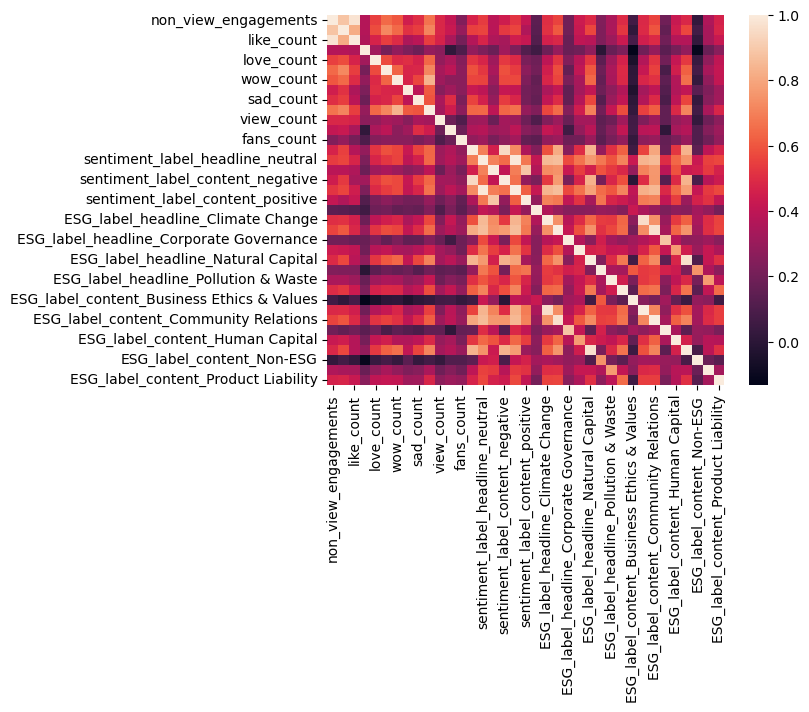

In [27]:
sns.heatmap(data_group_1.corr())

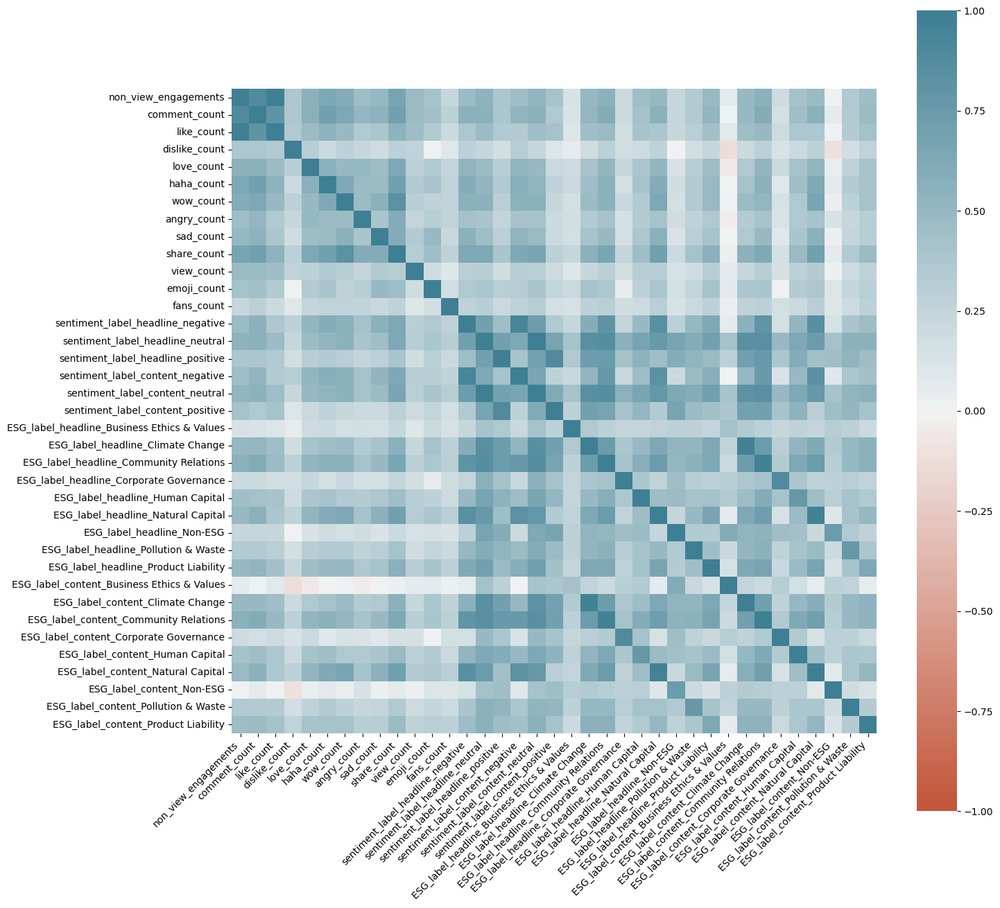

In [28]:
fig, ax = plt.subplots(figsize=(15, 15))
corr=data_group_1.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
fig.savefig("heatmap.jpg")

In [29]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.447056,-0.418282,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.192454,2.000000,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.172981,2.000000,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.101095,2.000000,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270


In [30]:
data_group_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   float64
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [31]:
hsi=pd.read_csv("HSI.csv");hsi

,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500
1,2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800
2,2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800
3,2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900
4,2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400
...,...,...,...,...,...,...,...
1227,2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900
1228,2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800
1229,2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100
1230,2023-01-04,20319.980469,20793.109375,20233.390625,20793.109375,20793.109375,3015986300


In [32]:
hsi["Date"]=pd.to_datetime(hsi["Date"]);hsi

,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500
1,2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800
2,2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800
3,2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900
4,2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400
...,...,...,...,...,...,...,...
1227,2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900
1228,2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800
1229,2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100
1230,2023-01-04,20319.980469,20793.109375,20233.390625,20793.109375,20793.109375,3015986300


In [33]:
hsi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1232 entries, 0 to 1231
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1232 non-null   datetime64[ns]
 1   Open       1232 non-null   float64       
 2   High       1232 non-null   float64       
 3   Low        1232 non-null   float64       
 4   Close      1232 non-null   float64       
 5   Adj Close  1232 non-null   float64       
 6   Volume     1232 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 67.5 KB


In [34]:
hsi.set_index(["Date"],inplace=True)

In [35]:
hsi

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400
...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100


In [36]:
hsi1=hsi["2020-01-01":"2022-09-30"]
hsi1=hsi1.apply(lambda x: x/x[0]);hsi1

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2020-01-03,1.020496,1.011904,1.006450,0.996776,0.996776,1.423820
2020-01-06,1.002730,0.993846,0.993214,0.988883,0.988883,1.420274
2020-01-07,1.003657,0.997532,1.000641,0.992241,0.992241,1.031641
2020-01-08,0.991158,0.987916,0.986255,0.984038,0.984038,1.353605
...,...,...,...,...,...,...
2022-09-26,0.629461,0.633336,0.627608,0.625541,0.625541,2.025050
2022-09-27,0.631471,0.627260,0.624812,0.625722,0.625722,1.505069
2022-09-28,0.626683,0.620225,0.608389,0.604371,0.604371,2.334981


In [37]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.447056,-0.418282,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.812491,-0.418282,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.192454,2.000000,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.172981,2.000000,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.101095,2.000000,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270


In [38]:
data_group_1["hsi_daily_return"]=hsi1["Adj Close"]
data_group_1["hsi_volume"]=hsi1["Volume"]

In [39]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,NaN,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,NaN,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981


In [40]:
data_group_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 39 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   float64
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [41]:
data_group_1.fillna(method="bfill")

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981


In [42]:
data_group_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 39 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   float64
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [43]:
# data_group_1["ESG_average"]=data_group_1.iloc[19:37].mean()

In [44]:
data_group_1=data_group_1.fillna(method="bfill");data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981


In [45]:
data_group_1.iloc[:,19:37]

,ESG_label_headline_Business Ethics & Values,ESG_label_headline_Climate Change,ESG_label_headline_Community Relations,ESG_label_headline_Corporate Governance,ESG_label_headline_Human Capital,ESG_label_headline_Natural Capital,ESG_label_headline_Non-ESG,ESG_label_headline_Pollution & Waste,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,
2020-01-01,0.169690,-0.711855,-0.891616,-0.643522,-0.709274,-0.581141,-0.934015,-0.669946,-0.447056,-0.418282,-0.640774,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702
2020-01-02,-0.407832,-0.601240,-0.680822,-0.643522,-0.658511,-0.128613,-0.934015,-0.812936,-0.812491,-0.418282,-0.497874,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702
2020-01-03,-0.407832,-0.474822,-0.445228,-0.705367,-0.607747,-0.286014,-0.674851,-0.383965,-0.812491,-0.418282,-0.412134,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702
2020-01-04,-0.407832,-0.553833,-0.507226,-0.396141,-0.709274,-0.502441,-0.901619,-0.955926,-0.812491,-0.418282,-0.612194,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702
2020-01-05,-0.407832,-0.617042,-0.705621,-0.767212,-0.556984,-0.443415,-0.934015,-0.669946,-0.812491,-0.418282,-0.669354,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,-0.215324,0.204673,-0.581624,0.655226,-0.303166,-0.482766,2.000000,0.759955,0.192454,2.000000,0.173758,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839
2022-09-27,-0.407832,0.457509,-0.271632,0.098620,-0.353929,-0.482766,2.000000,0.473975,-0.172981,2.000000,-0.054883,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702
2022-09-28,-0.407832,-0.206184,-0.147635,2.000000,0.509052,-0.541791,2.000000,-0.669946,0.101095,2.000000,-0.354973,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270


In [46]:
data_group_1["ESG_average"]=(data_group_1.iloc[:,19:37].sum(axis=1))/18

In [47]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume,ESG_average
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.778790,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.720810,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.465694,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.581656,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.697617,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.454098,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.160498,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.187386,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800


In [48]:
data_group_1.corr()[["ESG_average"]]

,ESG_average
non_view_engagements,0.528041
comment_count,0.547470
like_count,0.468216
dislike_count,0.235847
love_count,0.479989
haha_count,0.521421
wow_count,0.512039
angry_count,0.403867
sad_count,0.446791
share_count,0.608591


In [49]:
data_group_1["hsi_close"]=hsi["Close"];data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume,ESG_average,hsi_close
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859


In [50]:
data_group_1["hsi_close"]=data_group_1["hsi_close"].fillna(method="bfill");data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return,hsi_volume,ESG_average,hsi_close
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859


In [51]:
data_group_1.corr()[["ESG_average","hsi_close"]]

,ESG_average,hsi_close
non_view_engagements,0.528041,-0.268602
comment_count,0.547470,-0.163795
like_count,0.468216,-0.326594
dislike_count,0.235847,0.004121
love_count,0.479989,0.026854
haha_count,0.521421,-0.005954
wow_count,0.512039,-0.023680
angry_count,0.403867,0.045317
sad_count,0.446791,0.067422
share_count,0.608591,0.045967


In [52]:
hsi

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400
...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100


In [53]:
hsi["daily_change"]=hsi["Close"].pct_change()

In [54]:
hsi2=hsi.copy()
hsi2.fillna(value=0,inplace=True)

In [55]:
hsi2

,Open,High,Low,Close,Adj Close,Volume,daily_change
Date,,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500,0.000000
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800,0.003621
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800,0.002009
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900,0.001502
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400,0.009388
...,...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900,-0.007929
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100,0.018395


In [56]:
data_group_1=data_group_1.rename(columns={"hsi_daily_return":"hsi_daily_return_accu"});data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return_accu,hsi_volume,ESG_average,hsi_close
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597995,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.707455,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.379076,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.488535,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.606063,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.168224,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,2.000000,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859


In [57]:
hsi3=hsi2["2020-01-01":"2022-09-30"]
data_group_1["hsi_daily_change"]=hsi3["daily_change"];data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return_accu,hsi_volume,ESG_average,hsi_close,hsi_daily_change
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.748577,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.687593,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531,0.012550
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.504640,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000,-0.003224
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.748577,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.687593,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.626608,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625,-0.004357
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,0.105204,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547,0.000290
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,1.934736,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859,-0.034122


In [58]:
data_group_1.fillna(value=0,inplace=True)

In [59]:
data_group_1.corr()[["hsi_daily_change"]]

,hsi_daily_change
non_view_engagements,0.016207
comment_count,0.045317
like_count,0.007164
dislike_count,0.030557
love_count,0.002380
haha_count,0.016176
wow_count,0.016607
angry_count,0.055113
sad_count,0.001454
share_count,0.035781


<AxesSubplot:>

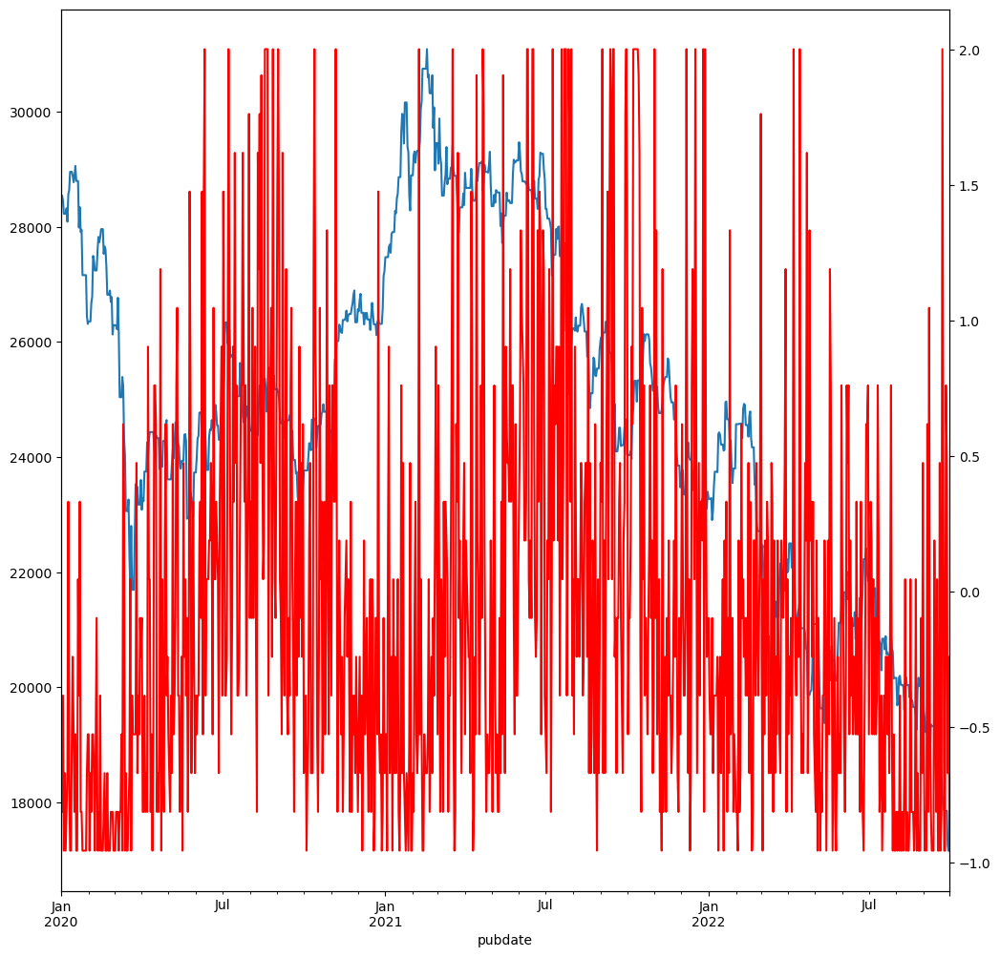

In [60]:
data_group_1["hsi_close"].plot(figsize=(12,12))
data_group_1["ESG_label_headline_Pollution & Waste"].plot(secondary_y=True, style='r')

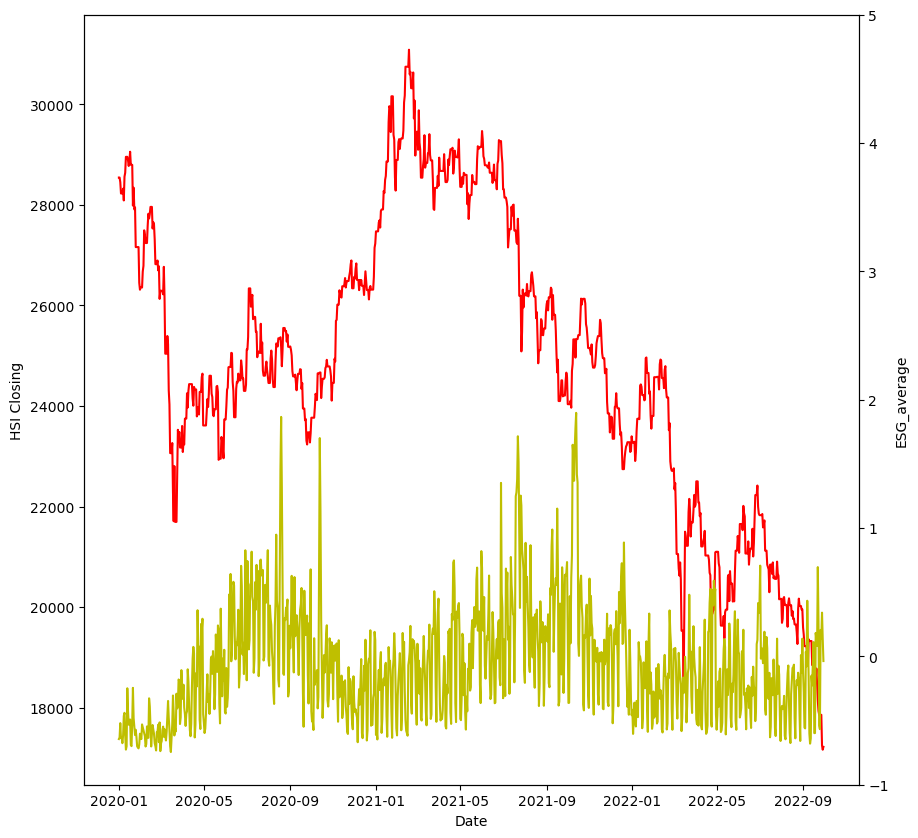

In [61]:

fig, ax1 = plt.subplots(figsize=(10,10)) 
ax1.set_xlabel('Date') 
ax1.set_ylabel('HSI Closing') 
ax1.plot(data_group_1["hsi_close"], color = 'red') 
ax2 = ax1.twinx() 
ax2.plot(data_group_1["ESG_average"], color = 'y')
ax2.set_ylim(-1,5) 
plt.ylabel('ESG_average')
plt.show()

In [62]:
data_group_1["ESG_average_10"]=data_group_1["ESG_average"].rolling(10).mean()

In [63]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return_accu,hsi_volume,ESG_average,hsi_close,hsi_daily_change,ESG_average_10
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531,0.000000,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531,0.012550,NaN
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000,-0.003224,NaN
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453,0.000000,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625,-0.004357,-0.074932
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547,0.000290,-0.000998
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859,-0.034122,0.092858


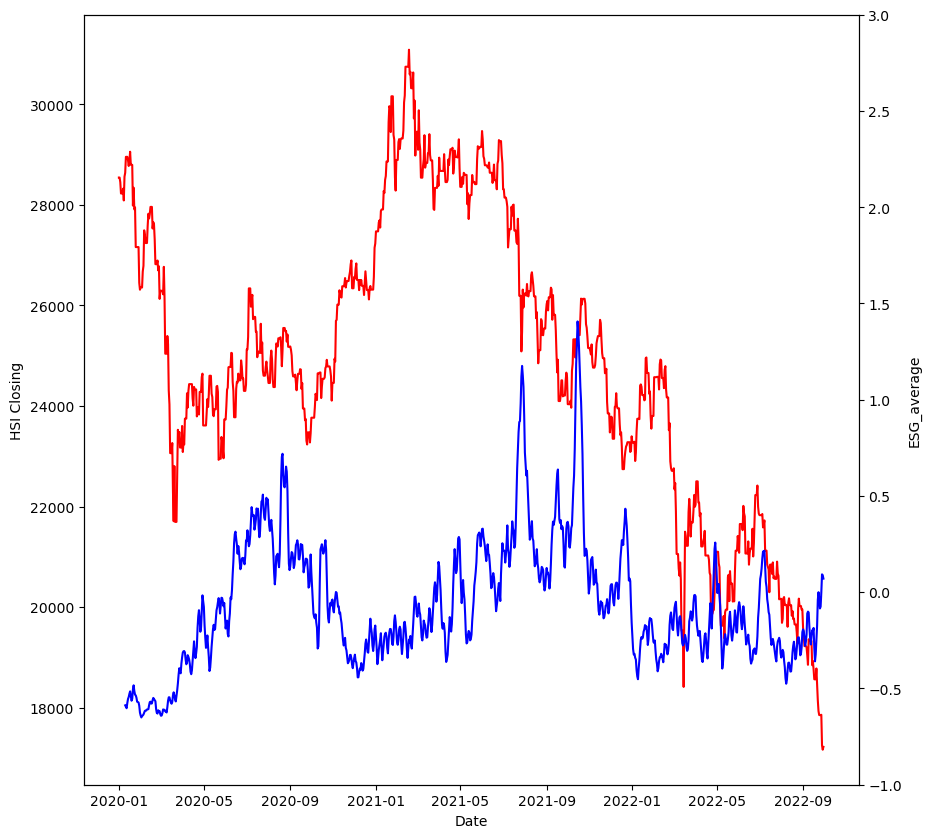

In [64]:

fig, ax1 = plt.subplots(figsize=(10,10)) 
ax1.set_xlabel('Date') 
ax1.set_ylabel('HSI Closing') 
ax1.plot(data_group_1["hsi_close"], color = 'red') 
ax2 = ax1.twinx() 
ax2.plot(data_group_1["ESG_average_10"], color = 'b')
ax2.set_ylim(-1,3) 
plt.ylabel('ESG_average')
plt.show()

In [65]:
data_group_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 43 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   float64
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [66]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return_accu,hsi_volume,ESG_average,hsi_close,hsi_daily_change,ESG_average_10
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531,0.000000,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531,0.012550,NaN
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000,-0.003224,NaN
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453,0.000000,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625,-0.004357,-0.074932
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547,0.000290,-0.000998
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859,-0.034122,0.092858


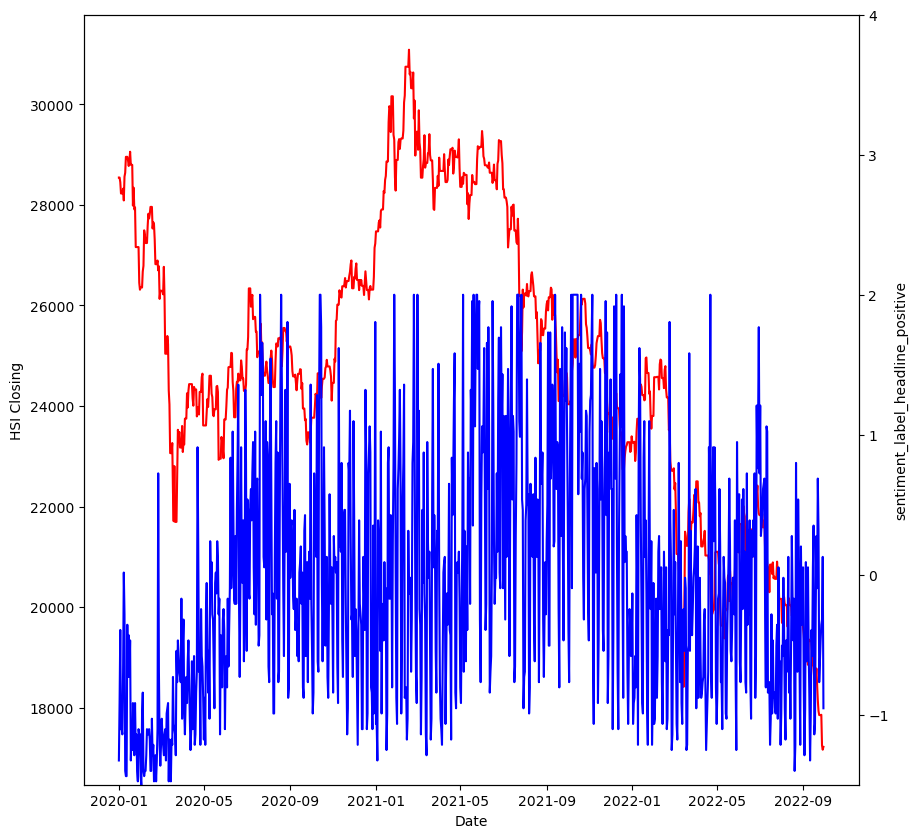

In [67]:

fig, ax1 = plt.subplots(figsize=(10,10)) 
ax1.set_xlabel('Date') 
ax1.set_ylabel('HSI Closing') 
ax1.plot(data_group_1["hsi_close"], color = 'red') 
ax2 = ax1.twinx() 
ax2.plot(data_group_1["sentiment_label_headline_positive"], color = 'b')
ax2.set_ylim(-1.5,4) 
plt.ylabel('sentiment_label_headline_positive')
plt.show()

In [68]:
data_group_1

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,hsi_daily_return_accu,hsi_volume,ESG_average,hsi_close,hsi_daily_change,ESG_average_10
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.630664,-0.819690,-0.796883,-0.742702,1.000000,1.000000,-0.644061,28543.519531,0.000000,NaN
2020-01-02,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.267825,-0.819690,-0.946708,-0.742702,1.000000,1.000000,-0.632192,28543.519531,0.012550,NaN
2020-01-03,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.350289,-0.763903,-0.197579,-0.742702,0.996776,1.423820,-0.520055,28451.500000,-0.003224,NaN
2020-01-04,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.366781,-0.763903,-1.096534,-0.742702,0.988883,1.420274,-0.636472,28226.189453,0.000000,NaN
2020-01-05,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.482230,-0.819690,-0.497231,-0.742702,0.988883,1.420274,-0.634322,28226.189453,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.054544,-0.114490,0.169027,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.597679,0.184475,0.551550,-0.357839,0.625541,2.025050,0.206058,17855.140625,-0.004357,-0.074932
2022-09-27,-0.279860,-0.185444,-0.240885,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.184475,-0.047753,-0.742702,0.625722,1.505069,0.141630,17860.310547,0.000290,-0.000998
2022-09-28,-0.613224,-0.553734,-0.625794,-0.403511,-0.150082,-0.31599,-0.365532,-0.152833,-0.233424,-0.426415,...,-0.564694,0.017114,-0.796883,-0.550270,0.604371,2.334981,0.340800,17250.880859,-0.034122,0.092858


In [69]:
data_group

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.0,5.0,16.0,2.0,0.0,0.0,0.0,2.0,0.0
2020-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,15.0,21.0,2.0,1.0,22.0,0.0,1.0,0.0
2020-01-03,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,21.0,43.0,0.0,4.0,17.0,1.0,6.0,0.0
2020-01-04,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,7.0,33.0,6.0,0.0,16.0,1.0,0.0,0.0
2020-01-05,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.0,23.0,4.0,1.0,9.0,0.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,15400,650.0,14750.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.0,100.0,62.0,44.0,24.0,2.0,2.0,18.0,11.0,2.0
2022-09-27,7688,545.0,7143.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,84.0,46.0,97.0,16.0,14.0,4.0,18.0,7.0,0.0
2022-09-28,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,107.0,25.0,67.0,55.0,44.0,4.0,15.0,2.0,1.0


In [70]:
data_group_1.to_csv("daily.csv")

In [71]:
data_group.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1004 entries, 2020-01-01 to 2022-09-30
Freq: D
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         1004 non-null   int64  
 1   comment_count                                1004 non-null   float64
 2   like_count                                   1004 non-null   float64
 3   dislike_count                                1004 non-null   float64
 4   love_count                                   1004 non-null   float64
 5   haha_count                                   1004 non-null   float64
 6   wow_count                                    1004 non-null   float64
 7   angry_count                                  1004 non-null   float64
 8   sad_count                                    1004 non-null   float64
 9   share_count                                  100

In [72]:
data_group_month=test.groupby(pd.Grouper(key="pubdate",axis=0,freq="M")).sum();data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,62.0,16.0,281.0,678.0,119.0,76.0,345.0,119.0,82.0,40.0
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,84.0,32.0,345.0,662.0,66.0,135.0,199.0,41.0,36.0,20.0
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,115.0,12.0,520.0,935.0,246.0,173.0,286.0,78.0,101.0,42.0
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,151.0,63.0,569.0,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,324.0,60.0,1185.0,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,544.0,48.0,1581.0,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,436.0,93.0,1769.0,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,631.0,71.0,3139.0,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,434.0,41.0,1473.0,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0


<AxesSubplot:>

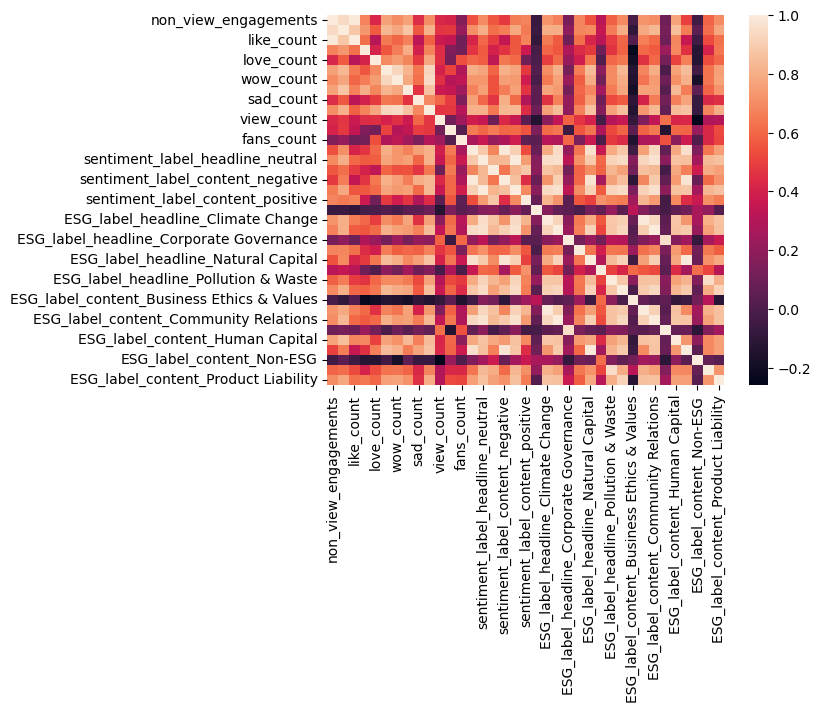

In [73]:
sns.heatmap(data_group_month.corr())

In [74]:
data_group_month.corr()

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_headline_Product Liability,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability
non_view_engagements,1.000000,0.937298,0.985662,0.672326,0.424277,0.756463,0.704844,0.759454,0.441992,0.705033,...,0.694138,-0.019190,0.722832,0.701022,0.099188,0.766537,0.499013,-0.045107,0.590031,0.701862
comment_count,0.937298,1.000000,0.879506,0.730910,0.563119,0.828210,0.778587,0.872242,0.558284,0.812515,...,0.802211,-0.091204,0.783788,0.828290,0.122567,0.848506,0.656082,0.045188,0.614693,0.778113
like_count,0.985662,0.879506,1.000000,0.620151,0.307832,0.648718,0.595294,0.670436,0.324344,0.581700,...,0.595994,0.016376,0.662235,0.602378,0.098241,0.681641,0.361479,-0.047540,0.526046,0.624784
dislike_count,0.672326,0.730910,0.620151,1.000000,0.408239,0.555400,0.659526,0.796349,0.397565,0.671399,...,0.586311,-0.235258,0.602963,0.566667,0.232969,0.689463,0.457637,-0.127637,0.406098,0.645391
love_count,0.424277,0.563119,0.307832,0.408239,1.000000,0.691865,0.745877,0.683144,0.482005,0.774402,...,0.642193,-0.194905,0.459788,0.599430,0.117672,0.506196,0.663088,-0.133962,0.529919,0.593048
haha_count,0.756463,0.828210,0.648718,0.555400,0.691865,1.000000,0.928847,0.818607,0.642474,0.930303,...,0.830683,-0.130873,0.680195,0.799911,-0.003185,0.763520,0.844122,-0.039710,0.630825,0.750234
wow_count,0.704844,0.778587,0.595294,0.659526,0.745877,0.928847,1.000000,0.784366,0.624012,0.945730,...,0.796868,-0.145524,0.634239,0.744067,0.100280,0.710832,0.809445,-0.176650,0.635536,0.768428
angry_count,0.759454,0.872242,0.670436,0.796349,0.683144,0.818607,0.784366,1.000000,0.462284,0.862901,...,0.774139,-0.179210,0.761889,0.755678,0.036939,0.834897,0.661085,0.055226,0.590928,0.720071
sad_count,0.441992,0.558284,0.324344,0.397565,0.482005,0.642474,0.624012,0.462284,1.000000,0.688135,...,0.565216,-0.099848,0.409046,0.658734,0.115987,0.663887,0.771848,-0.069931,0.428614,0.450481
share_count,0.705033,0.812515,0.581700,0.671399,0.774402,0.930303,0.945730,0.862901,0.688135,1.000000,...,0.852484,-0.137323,0.734540,0.830015,0.062058,0.840107,0.862716,-0.068017,0.678463,0.795547


In [75]:
data_group_month.to_csv("monthly.csv")

In [76]:
data_group_month.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33 entries, 2020-01-31 to 2022-09-30
Freq: M
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   non_view_engagements                         33 non-null     int64  
 1   comment_count                                33 non-null     float64
 2   like_count                                   33 non-null     float64
 3   dislike_count                                33 non-null     float64
 4   love_count                                   33 non-null     float64
 5   haha_count                                   33 non-null     float64
 6   wow_count                                    33 non-null     float64
 7   angry_count                                  33 non-null     float64
 8   sad_count                                    33 non-null     float64
 9   share_count                                  33 no

In [77]:
data_group_month["ESG_average"]=data_group_month.iloc[:,19:].sum(axis=1);data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Business Ethics & Values,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.0,281.0,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,32.0,345.0,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,12.0,520.0,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,63.0,569.0,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,60.0,1185.0,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,48.0,1581.0,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,93.0,1769.0,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,71.0,3139.0,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,41.0,1473.0,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0


In [78]:
hsi

,Open,High,Low,Close,Adj Close,Volume,daily_change
Date,,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500,NaN
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800,0.003621
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800,0.002009
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900,0.001502
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400,0.009388
...,...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900,-0.007929
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100,0.018395


In [79]:
hsi_month=hsi.copy().reset_index()
hsi_month['yymm']=pd.DatetimeIndex(hsi_month['Date']).year*100+pd.DatetimeIndex(hsi_month['Date']).month
hsi_month=hsi_month.sort_values(by="Date").drop_duplicates(subset=["yymm"], keep="last")

In [80]:
hsi_month

,Date,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm
17,2018-01-31,32435.759766,32933.980469,32330.390625,32887.269531,32887.269531,3314255500,0.008586,201801
35,2018-02-28,31037.410156,31061.759766,30703.900391,30844.720703,30844.720703,2407877200,-0.013558,201802
56,2018-03-29,30154.179688,30252.949219,29819.630859,30093.380859,30093.380859,2167328200,0.002360,201803
75,2018-04-30,30530.400391,30853.130859,30483.910156,30808.449219,30808.449219,1923280800,0.017430,201804
96,2018-05-31,30274.179688,30533.580078,30148.429688,30468.560547,30468.560547,4110003600,0.013700,201805
...,...,...,...,...,...,...,...,...,...
1166,2022-09-30,17165.929688,17344.810547,17016.279297,17222.830078,17222.830078,2113942500,0.003318,202209
1186,2022-10-31,14830.690430,15113.150391,14597.309570,14687.019531,14687.019531,4183641700,-0.011844,202210
1208,2022-11-30,18141.560547,18645.349609,18052.320313,18597.230469,18597.230469,5359650800,0.021563,202211
1228,2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040,202212


In [81]:
hsi_month.set_index(["Date"],inplace=True)
hsi_month1=hsi_month["2020-01-31":"2022-10-01"]
hsi_month1=hsi_month1.apply(lambda x: (x-x[0])/x[0]);hsi_month1


,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm
Date,,,,,,,,
2020-01-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000
2020-02-28,-0.019006,-0.018841,-0.011640,-0.006943,-0.006943,0.702770,3.693831,0.000005
2020-03-31,-0.117512,-0.118995,-0.116273,-0.102960,-0.102960,0.534650,-4.581600,0.000010
2020-04-29,-0.073683,-0.073209,-0.066394,-0.063431,-0.063431,-0.120713,-1.533213,0.000015
2020-05-29,-0.148612,-0.139047,-0.133650,-0.127359,-0.127359,0.932187,0.434766,0.000020
2020-06-30,-0.085560,-0.082786,-0.076961,-0.071655,-0.071655,0.009640,-2.003946,0.000025
2020-07-31,-0.075131,-0.070100,-0.066958,-0.065265,-0.065265,-0.059235,-0.096351,0.000030
2020-08-31,-0.038311,-0.036233,-0.042534,-0.043157,-0.043157,0.704879,0.867460,0.000035
2020-09-30,-0.119918,-0.113277,-0.111312,-0.108449,-0.108449,-0.224750,-2.527799,0.000040


In [82]:
data_group_month['hsi_accu_return']=hsi_month1["2020-01-31":"2022-10-01"]["Close"];data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,281.0,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,345.0,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,NaN
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,520.0,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,569.0,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,NaN
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1185.0,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,NaN
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,1581.0,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,1769.0,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,3139.0,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,1473.0,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449


In [83]:
hsi_month1["2020-01-31":"2022-10-01"]

,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm
Date,,,,,,,,
2020-01-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000
2020-02-28,-0.019006,-0.018841,-0.011640,-0.006943,-0.006943,0.702770,3.693831,0.000005
2020-03-31,-0.117512,-0.118995,-0.116273,-0.102960,-0.102960,0.534650,-4.581600,0.000010
2020-04-29,-0.073683,-0.073209,-0.066394,-0.063431,-0.063431,-0.120713,-1.533213,0.000015
2020-05-29,-0.148612,-0.139047,-0.133650,-0.127359,-0.127359,0.932187,0.434766,0.000020
2020-06-30,-0.085560,-0.082786,-0.076961,-0.071655,-0.071655,0.009640,-2.003946,0.000025
2020-07-31,-0.075131,-0.070100,-0.066958,-0.065265,-0.065265,-0.059235,-0.096351,0.000030
2020-08-31,-0.038311,-0.036233,-0.042534,-0.043157,-0.043157,0.704879,0.867460,0.000035
2020-09-30,-0.119918,-0.113277,-0.111312,-0.108449,-0.108449,-0.224750,-2.527799,0.000040


In [84]:
data_group_month['hsi_accu_return']

pubdate
2020-01-31    0.000000
2020-02-29         NaN
2020-03-31   -0.102960
2020-04-30         NaN
2020-05-31         NaN
2020-06-30   -0.071655
2020-07-31   -0.065265
2020-08-31   -0.043157
2020-09-30   -0.108449
2020-10-31         NaN
2020-11-30    0.001097
2020-12-31    0.034907
2021-01-31         NaN
2021-02-28         NaN
2021-03-31    0.078507
2021-04-30    0.091677
2021-05-31    0.107901
2021-06-30    0.095594
2021-07-31         NaN
2021-08-31   -0.016480
2021-09-30   -0.066014
2021-10-31         NaN
2021-11-30   -0.107833
2021-12-31   -0.110782
2022-01-31   -0.095406
2022-02-28   -0.136802
2022-03-31   -0.164019
2022-04-30         NaN
2022-05-31   -0.186125
2022-06-30   -0.169228
2022-07-31         NaN
2022-08-31   -0.241642
2022-09-30   -0.345454
Freq: M, Name: hsi_accu_return, dtype: float64

In [85]:
data_group_month['hsi_accu_return']["2020-02-29"]

nan

In [86]:
data_group_month['hsi_accu_return']["2020-02-29"]=-0.006943
data_group_month['hsi_accu_return']["2020-04-30"]=-0.063431
data_group_month['hsi_accu_return']["2020-05-31"]=-0.127359
data_group_month['hsi_accu_return']["2020-10-31"]=-0.083808
data_group_month['hsi_accu_return']["2021-01-31"]=0.074910
data_group_month['hsi_accu_return']["2021-02-28"]=0.101380
data_group_month['hsi_accu_return']["2021-07-31"]=-0.013362
data_group_month['hsi_accu_return']["2021-10-31"]=-0.107833
data_group_month['hsi_accu_return']["2022-04-30"]=-0.198507
data_group_month['hsi_accu_return']["2022-07-31"]=-0.233961

In [87]:
data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Climate Change,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,281.0,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,345.0,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,-0.006943
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,520.0,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,569.0,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,-0.063431
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1185.0,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,-0.127359
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,1581.0,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,1769.0,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,3139.0,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,1473.0,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449


In [88]:
hsi

,Open,High,Low,Close,Adj Close,Volume,daily_change
Date,,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500,NaN
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800,0.003621
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800,0.002009
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900,0.001502
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400,0.009388
...,...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900,-0.007929
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100,0.018395


In [89]:
hsi_month

,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm
Date,,,,,,,,
2018-01-31,32435.759766,32933.980469,32330.390625,32887.269531,32887.269531,3314255500,0.008586,201801
2018-02-28,31037.410156,31061.759766,30703.900391,30844.720703,30844.720703,2407877200,-0.013558,201802
2018-03-29,30154.179688,30252.949219,29819.630859,30093.380859,30093.380859,2167328200,0.002360,201803
2018-04-30,30530.400391,30853.130859,30483.910156,30808.449219,30808.449219,1923280800,0.017430,201804
2018-05-31,30274.179688,30533.580078,30148.429688,30468.560547,30468.560547,4110003600,0.013700,201805
...,...,...,...,...,...,...,...,...
2022-09-30,17165.929688,17344.810547,17016.279297,17222.830078,17222.830078,2113942500,0.003318,202209
2022-10-31,14830.690430,15113.150391,14597.309570,14687.019531,14687.019531,4183641700,-0.011844,202210
2022-11-30,18141.560547,18645.349609,18052.320313,18597.230469,18597.230469,5359650800,0.021563,202211


In [90]:
hsi_month2=hsi_month["2020-01-01":"2022-10-01"]
hsi_month2["monthly_return"]=hsi_month2["Close"].pct_change();hsi_month2

,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm,monthly_return
Date,,,,,,,,,
2020-01-31,26757.609375,26818.839844,26295.490234,26312.630859,26312.630859,1874255200,-0.005161,202001,NaN
2020-02-28,26249.060547,26313.550781,25989.410156,26129.929688,26129.929688,3191426200,-0.024224,202002,-0.006943
2020-03-31,23613.269531,23627.529297,23238.039063,23603.480469,23603.480469,2876326600,0.018484,202003,-0.096688
2020-04-29,24786.019531,24855.470703,24549.619141,24643.589844,24643.589844,1648009000,0.002752,202004,0.044066
2020-05-29,22781.109375,23089.769531,22781.109375,22961.470703,22961.470703,3621412000,-0.007405,202005,-0.068258
2020-06-30,24468.240234,24598.609375,24271.769531,24427.189453,24427.189453,1892323300,0.005181,202006,0.063834
2020-07-31,24747.289063,24938.849609,24534.789063,24595.349609,24595.349609,1763233900,-0.004664,202007,0.006884
2020-08-31,25732.490234,25847.109375,25177.050781,25177.050781,25177.050781,3195378200,-0.009638,202008,0.023651
2020-09-30,23548.890625,23780.869141,23368.490234,23459.050781,23459.050781,1453016000,0.007885,202009,-0.068237


In [91]:
hsi_month2["monthly_return"]["2020-01-31"]=0

In [92]:
hsi_month2

,Open,High,Low,Close,Adj Close,Volume,daily_change,yymm,monthly_return
Date,,,,,,,,,
2020-01-31,26757.609375,26818.839844,26295.490234,26312.630859,26312.630859,1874255200,-0.005161,202001,0.000000
2020-02-28,26249.060547,26313.550781,25989.410156,26129.929688,26129.929688,3191426200,-0.024224,202002,-0.006943
2020-03-31,23613.269531,23627.529297,23238.039063,23603.480469,23603.480469,2876326600,0.018484,202003,-0.096688
2020-04-29,24786.019531,24855.470703,24549.619141,24643.589844,24643.589844,1648009000,0.002752,202004,0.044066
2020-05-29,22781.109375,23089.769531,22781.109375,22961.470703,22961.470703,3621412000,-0.007405,202005,-0.068258
2020-06-30,24468.240234,24598.609375,24271.769531,24427.189453,24427.189453,1892323300,0.005181,202006,0.063834
2020-07-31,24747.289063,24938.849609,24534.789063,24595.349609,24595.349609,1763233900,-0.004664,202007,0.006884
2020-08-31,25732.490234,25847.109375,25177.050781,25177.050781,25177.050781,3195378200,-0.009638,202008,0.023651
2020-09-30,23548.890625,23780.869141,23368.490234,23459.050781,23459.050781,1453016000,0.007885,202009,-0.068237


In [93]:
data_group_month["monthly_return"]=hsi_month2["monthly_return"];data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return,monthly_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,-0.006943,NaN
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960,-0.096688
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,-0.063431,NaN
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,-0.127359,NaN
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655,0.063834
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265,0.006884
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157,0.023651
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449,-0.068237


In [94]:
data_group_month["monthly_return"]

pubdate
2020-01-31    0.000000
2020-02-29         NaN
2020-03-31   -0.096688
2020-04-30         NaN
2020-05-31         NaN
2020-06-30    0.063834
2020-07-31    0.006884
2020-08-31    0.023651
2020-09-30   -0.068237
2020-10-31         NaN
2020-11-30    0.092671
2020-12-31    0.033773
2021-01-31         NaN
2021-02-28         NaN
2021-03-31   -0.020768
2021-04-30    0.012211
2021-05-31    0.014862
2021-06-30   -0.011109
2021-07-31         NaN
2021-08-31   -0.003160
2021-09-30   -0.050363
2021-10-31         NaN
2021-11-30   -0.074948
2021-12-31   -0.003305
2022-01-31    0.017292
2022-02-28   -0.045762
2022-03-31   -0.031531
2022-04-30         NaN
2022-05-31    0.015449
2022-06-30    0.020760
2022-07-31         NaN
2022-08-31   -0.010027
2022-09-30   -0.136890
Freq: M, Name: monthly_return, dtype: float64

In [95]:
data_group_month['monthly_return']["2020-02-29"]=-0.006943
data_group_month['monthly_return']["2020-04-30"]=0.044066
data_group_month['monthly_return']["2020-05-31"]=-0.068258
data_group_month['monthly_return']["2020-10-31"]=0.027638
data_group_month['monthly_return']["2021-01-31"]=0.038654
data_group_month['monthly_return']["2021-02-28"]=0.024625
data_group_month['monthly_return']["2021-07-31"]=-0.099449
data_group_month['monthly_return']["2021-10-31"]=0.032618
data_group_month['monthly_return']["2022-04-30"]=-0.041254
data_group_month['monthly_return']["2022-07-31"]=-0.077918

In [96]:
data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return,monthly_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,-0.006943,-0.006943
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960,-0.096688
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,-0.063431,0.044066
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,-0.127359,-0.068258
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655,0.063834
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265,0.006884
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157,0.023651
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449,-0.068237


In [97]:
data_group_month.corr()

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return,monthly_return
non_view_engagements,1.000000,0.937298,0.985662,0.672326,0.424277,0.756463,0.704844,0.759454,0.441992,0.705033,...,0.701022,0.099188,0.766537,0.499013,-0.045107,0.590031,0.701862,0.673338,-0.380959,0.135452
comment_count,0.937298,1.000000,0.879506,0.730910,0.563119,0.828210,0.778587,0.872242,0.558284,0.812515,...,0.828290,0.122567,0.848506,0.656082,0.045188,0.614693,0.778113,0.791129,-0.244615,0.130251
like_count,0.985662,0.879506,1.000000,0.620151,0.307832,0.648718,0.595294,0.670436,0.324344,0.581700,...,0.602378,0.098241,0.681641,0.361479,-0.047540,0.526046,0.624784,0.575504,-0.450218,0.103898
dislike_count,0.672326,0.730910,0.620151,1.000000,0.408239,0.555400,0.659526,0.796349,0.397565,0.671399,...,0.566667,0.232969,0.689463,0.457637,-0.127637,0.406098,0.645391,0.549591,-0.049242,0.310956
love_count,0.424277,0.563119,0.307832,0.408239,1.000000,0.691865,0.745877,0.683144,0.482005,0.774402,...,0.599430,0.117672,0.506196,0.663088,-0.133962,0.529919,0.593048,0.572091,0.038700,0.196182
haha_count,0.756463,0.828210,0.648718,0.555400,0.691865,1.000000,0.928847,0.818607,0.642474,0.930303,...,0.799911,-0.003185,0.763520,0.844122,-0.039710,0.630825,0.750234,0.783818,-0.052791,0.224815
wow_count,0.704844,0.778587,0.595294,0.659526,0.745877,0.928847,1.000000,0.784366,0.624012,0.945730,...,0.744067,0.100280,0.710832,0.809445,-0.176650,0.635536,0.768428,0.733514,-0.067042,0.274907
angry_count,0.759454,0.872242,0.670436,0.796349,0.683144,0.818607,0.784366,1.000000,0.462284,0.862901,...,0.755678,0.036939,0.834897,0.661085,0.055226,0.590928,0.720071,0.742227,0.018269,0.329014
sad_count,0.441992,0.558284,0.324344,0.397565,0.482005,0.642474,0.624012,0.462284,1.000000,0.688135,...,0.658734,0.115987,0.663887,0.771848,-0.069931,0.428614,0.450481,0.631670,0.023846,0.044723
share_count,0.705033,0.812515,0.581700,0.671399,0.774402,0.930303,0.945730,0.862901,0.688135,1.000000,...,0.830015,0.062058,0.840107,0.862716,-0.068017,0.678463,0.795547,0.823127,0.068459,0.297625


<AxesSubplot:>

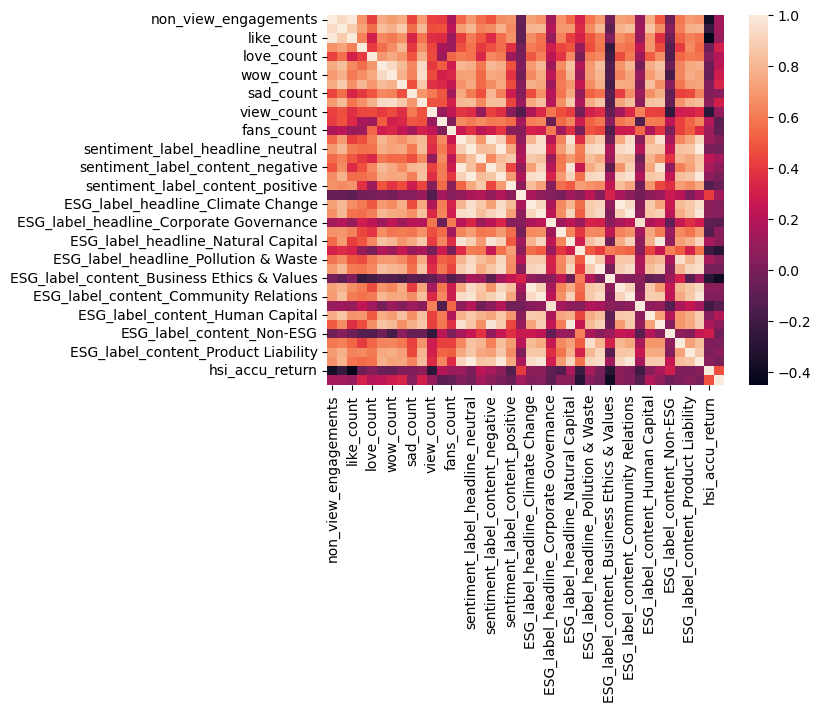

In [98]:
sns.heatmap(data_group_month.corr())

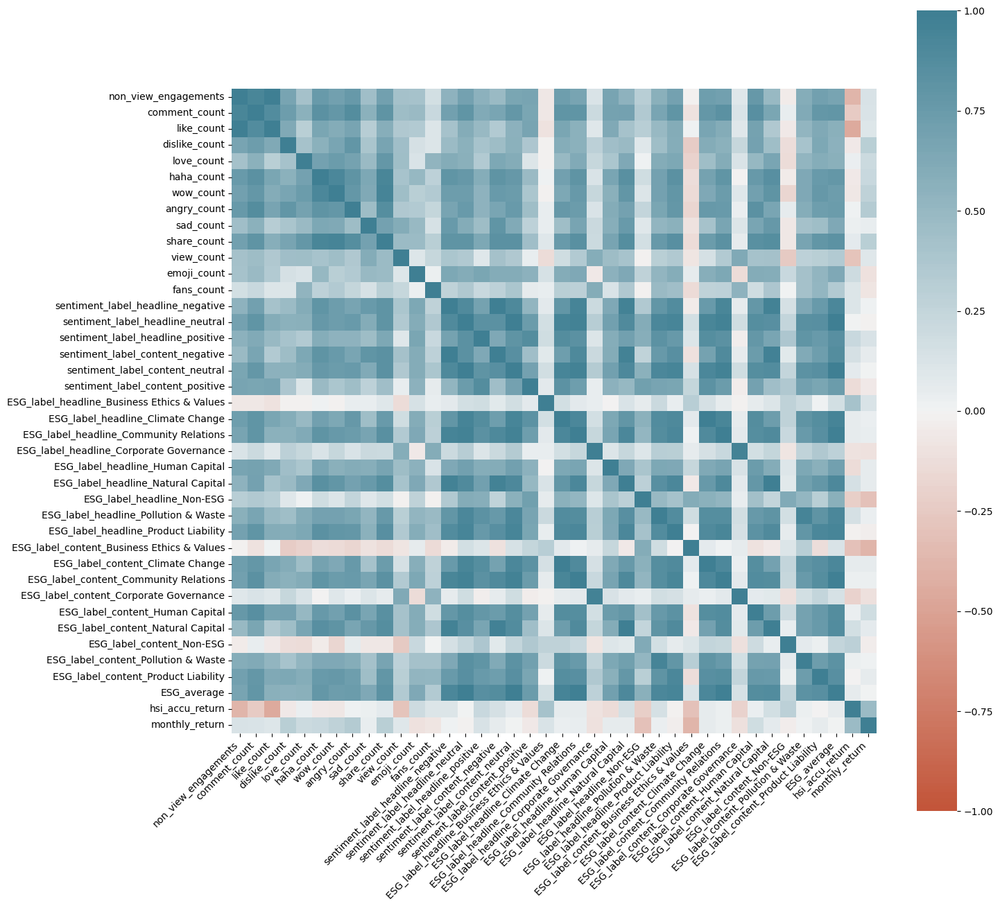

In [99]:
fig, ax = plt.subplots(figsize=(15, 15))
corr=data_group_month.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
fig.savefig("heatmap_monthly_data.jpg")

In [100]:
data_group_month.corr()[["ESG_average","hsi_accu_return","monthly_return"]]

,ESG_average,hsi_accu_return,monthly_return
non_view_engagements,0.673338,-0.380959,0.135452
comment_count,0.791129,-0.244615,0.130251
like_count,0.575504,-0.450218,0.103898
dislike_count,0.549591,-0.049242,0.310956
love_count,0.572091,0.038700,0.196182
haha_count,0.783818,-0.052791,0.224815
wow_count,0.733514,-0.067042,0.274907
angry_count,0.742227,0.018269,0.329014
sad_count,0.631670,0.023846,0.044723
share_count,0.823127,0.068459,0.297625


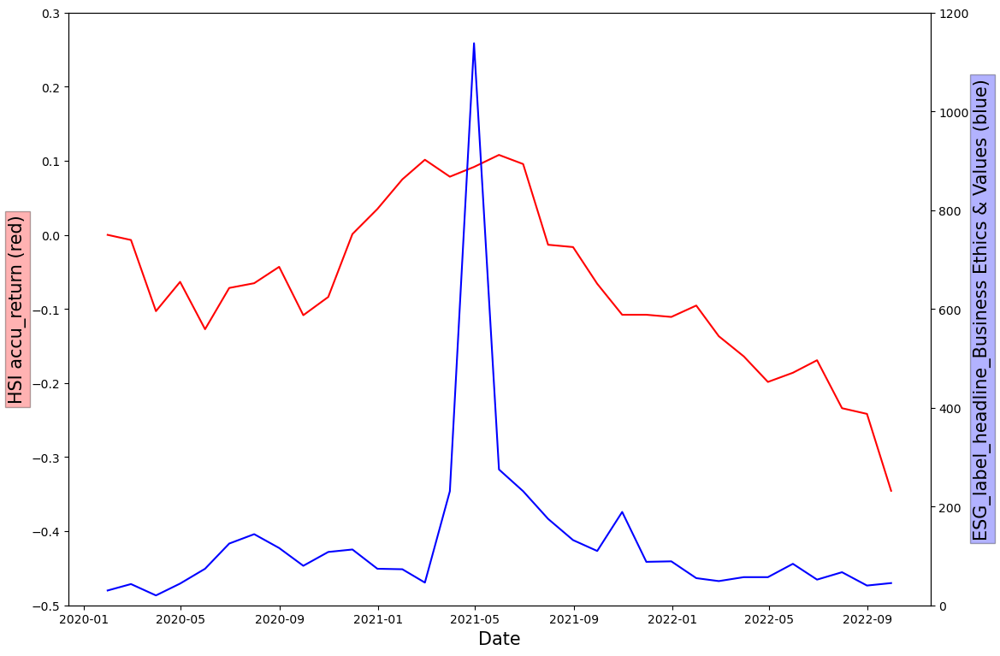

In [124]:
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI accu_return (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(data_group_month["hsi_accu_return"], color = 'red') 
ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_group_month["ESG_label_headline_Business Ethics & Values"], color = 'b')
ax2.set_ylim(0,1200) 
plt.ylabel('ESG_label_headline_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

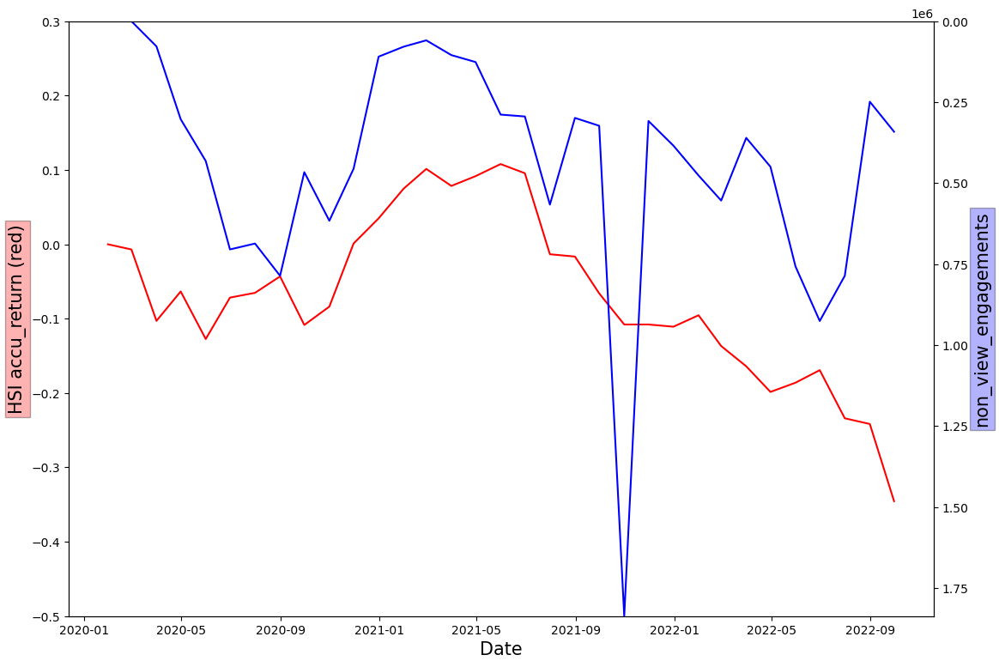

In [127]:
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI accu_return (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(data_group_month["hsi_accu_return"], color = 'red') 
ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_group_month["non_view_engagements"], color = 'b')
ax2.set_ylim(max(data_group_month["non_view_engagements"]),min(data_group_month["non_view_engagements"])) 
plt.ylabel('non_view_engagements',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))

plt.show()

In [126]:
data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return,monthly_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,-0.006943,-0.006943
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960,-0.096688
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,-0.063431,0.044066
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,-0.127359,-0.068258
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655,0.063834
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265,0.006884
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157,0.023651
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449,-0.068237


In [135]:
hsi

,Open,High,Low,Close,Adj Close,Volume,daily_change
Date,,,,,,,
2018-01-08,30895.089844,30929.150391,30732.539063,30899.529297,30899.529297,2004162500,NaN
2018-01-09,30933.509766,31056.699219,30852.429688,31011.410156,31011.410156,2004940800,0.003621
2018-01-10,31009.240234,31267.570313,30928.580078,31073.720703,31073.720703,2595365800,0.002009
2018-01-11,31066.210938,31133.179688,30950.070313,31120.390625,31120.390625,1794778900,0.001502
2018-01-12,31298.050781,31412.539063,31198.359375,31412.539063,31412.539063,2327417400,0.009388
...,...,...,...,...,...,...,...
2022-12-29,19648.400391,19764.519531,19539.839844,19741.140625,19741.140625,2902362900,-0.007929
2022-12-30,20030.849609,20073.919922,19781.410156,19781.410156,19781.410156,1747706800,0.002040
2023-01-03,19570.429688,20212.550781,19303.730469,20145.289063,20145.289063,2286651100,0.018395


In [134]:
hsi_month1["monthly_change"]=hsi_month1["Close"].apply(lambda x: (x-x[0])/x[0]);hsi_month1

TypeError: 'float' object is not subscriptable

In [139]:
hsi_month_accu=hsi[["Close","Volume"]]["2020-01-01":].copy();hsi_month_accu

,Close,Volume
Date,,
2020-01-02,28543.519531,1262732800
2020-01-03,28451.500000,1797904800
2020-01-06,28226.189453,1793426600
2020-01-07,28322.060547,1302687200
2020-01-08,28087.919922,1709241600
...,...,...
2022-12-29,19741.140625,2902362900
2022-12-30,19781.410156,1747706800
2023-01-03,20145.289063,2286651100


In [140]:
hsi_month_accu=hsi_month_accu.apply(lambda x: (x-x[0])/x[0]);hsi_month_accu

,Close,Volume
Date,,
2020-01-02,0.000000,0.000000
2020-01-03,-0.003224,0.423820
2020-01-06,-0.011117,0.420274
2020-01-07,-0.007759,0.031641
2020-01-08,-0.015962,0.353605
...,...,...
2022-12-29,-0.308384,1.298477
2022-12-30,-0.306974,0.384067
2023-01-03,-0.294225,0.810875


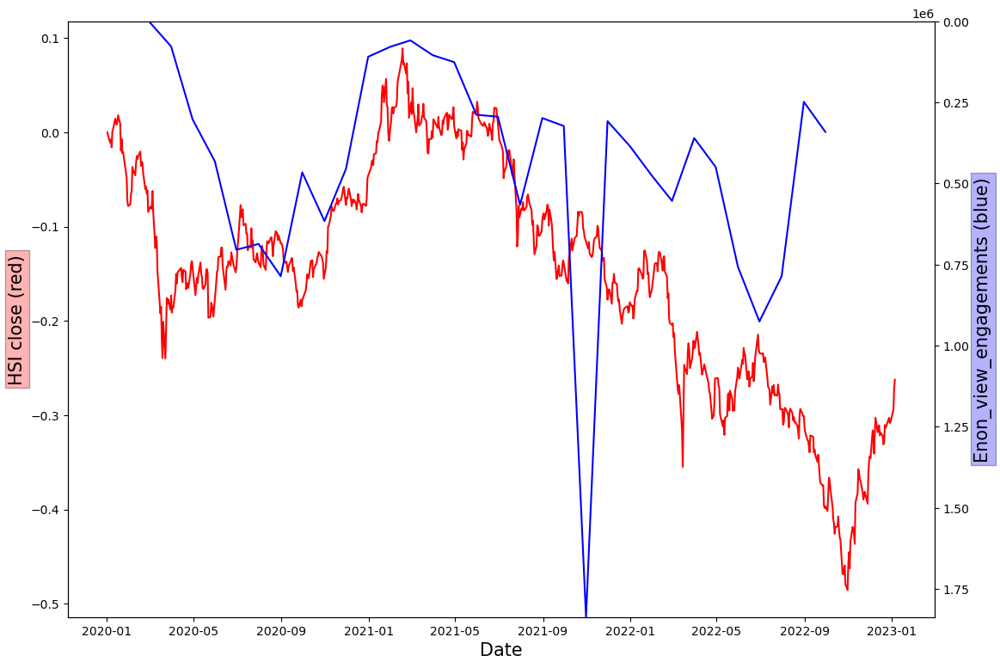

In [149]:
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_group_month["non_view_engagements"], color = 'b')
ax2.set_ylim(max(data_group_month["non_view_engagements"]),min(data_group_month["non_view_engagements"])) 
plt.ylabel('Enon_view_engagements (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

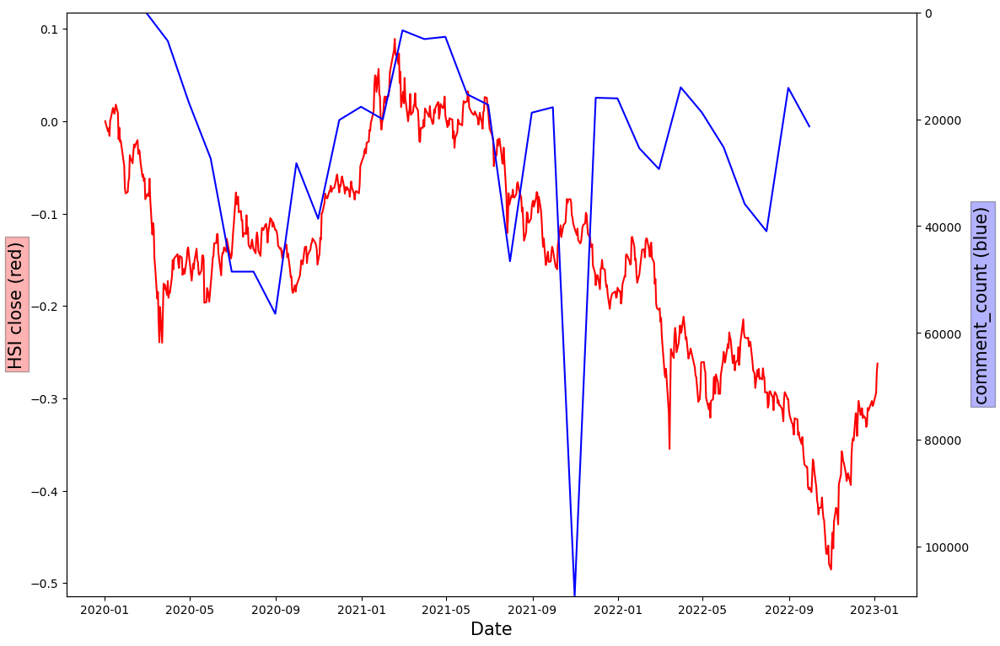

In [152]:
data_to_plot=data_group_month["comment_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('comment_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

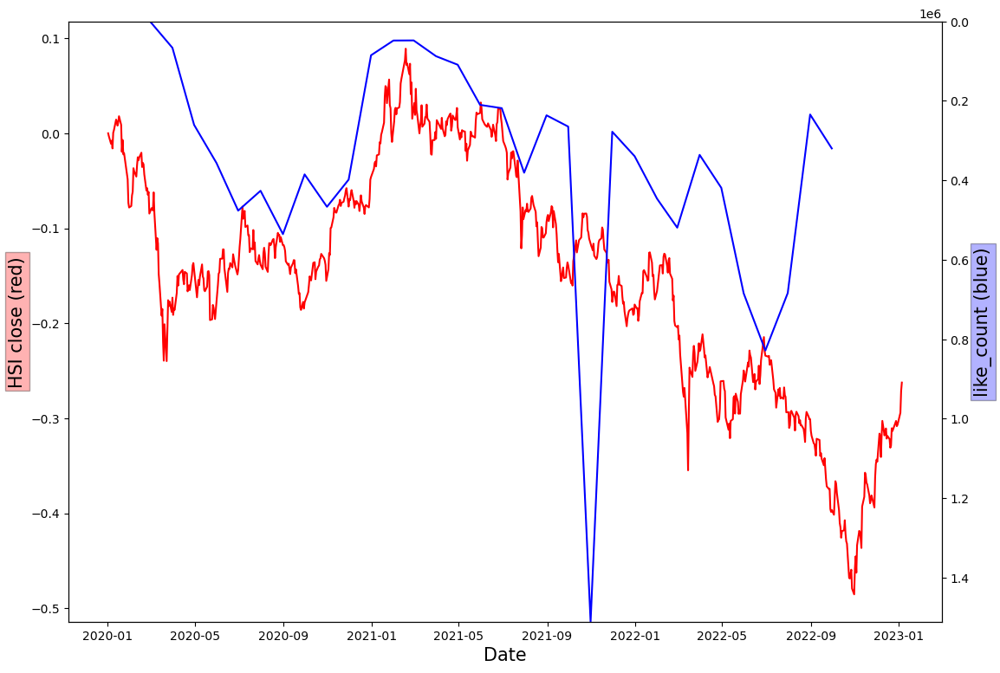

In [154]:
data_to_plot=data_group_month["like_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('like_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

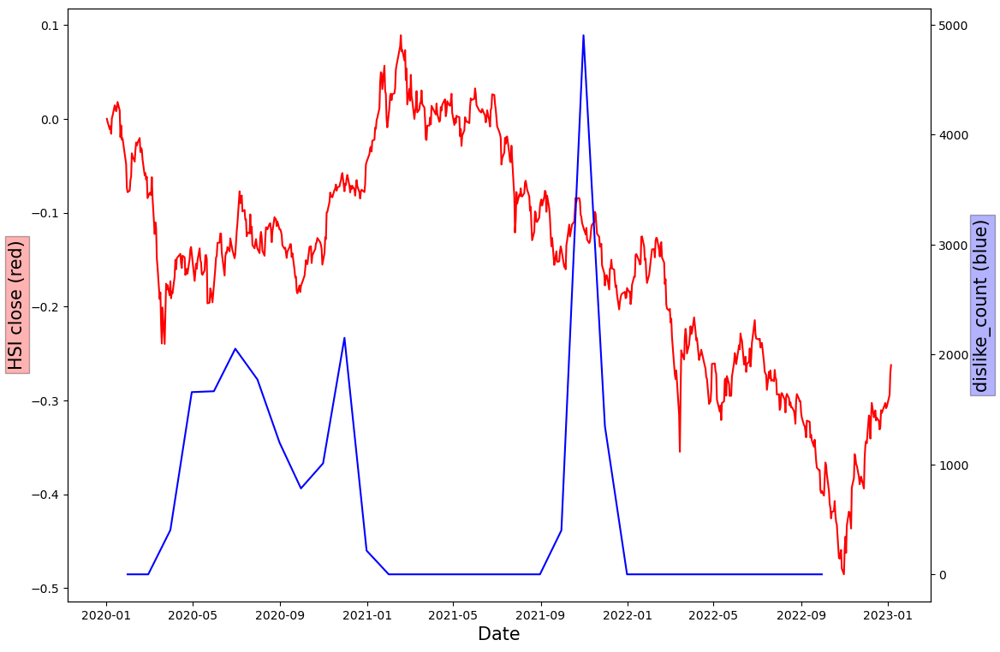

In [155]:
data_to_plot=data_group_month["dislike_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('dislike_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

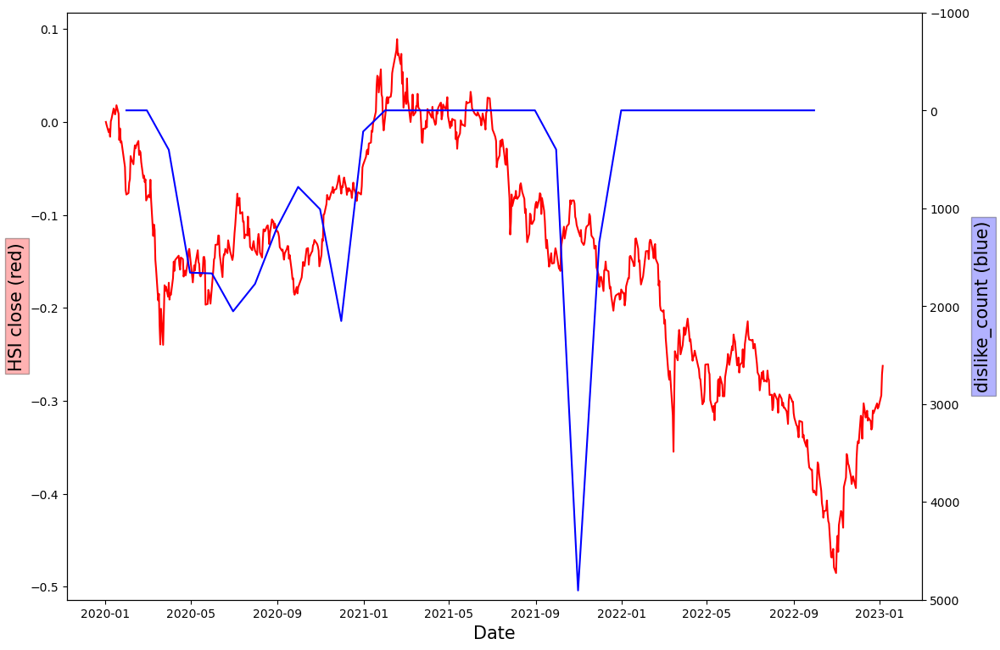

In [157]:
data_to_plot=data_group_month["dislike_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(5000,-1000) 
plt.ylabel('dislike_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

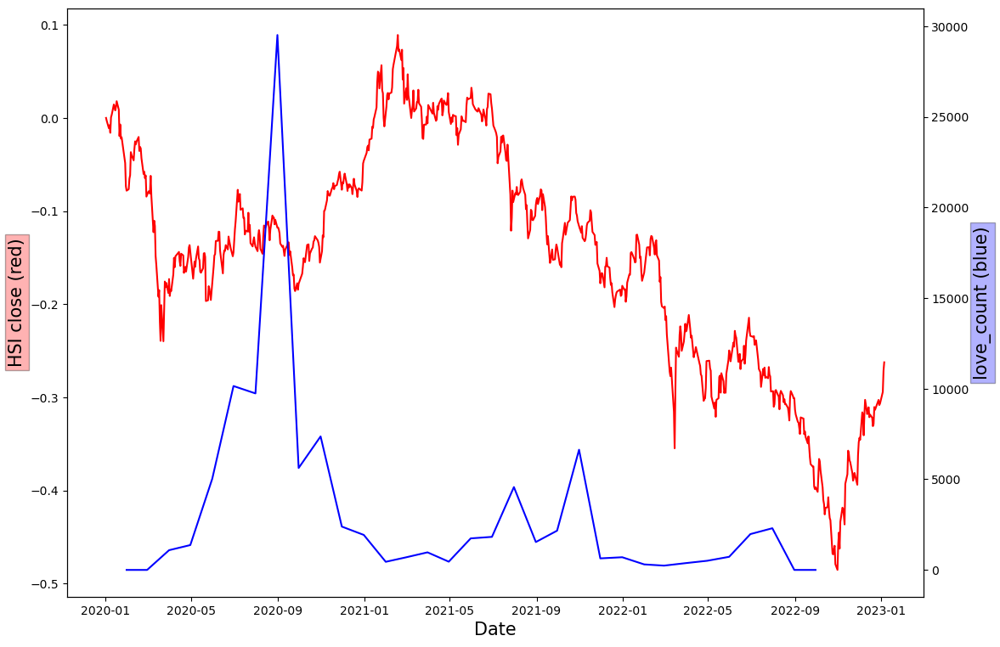

In [158]:
data_to_plot=data_group_month["love_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('love_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

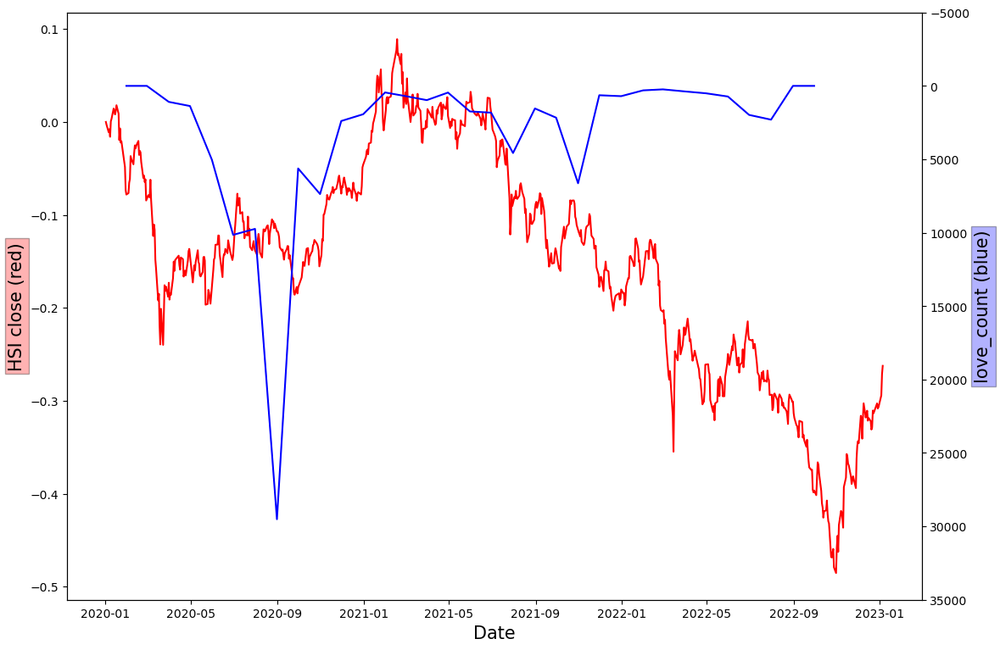

In [160]:
data_to_plot=data_group_month["love_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(35000,-5000) 
plt.ylabel('love_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

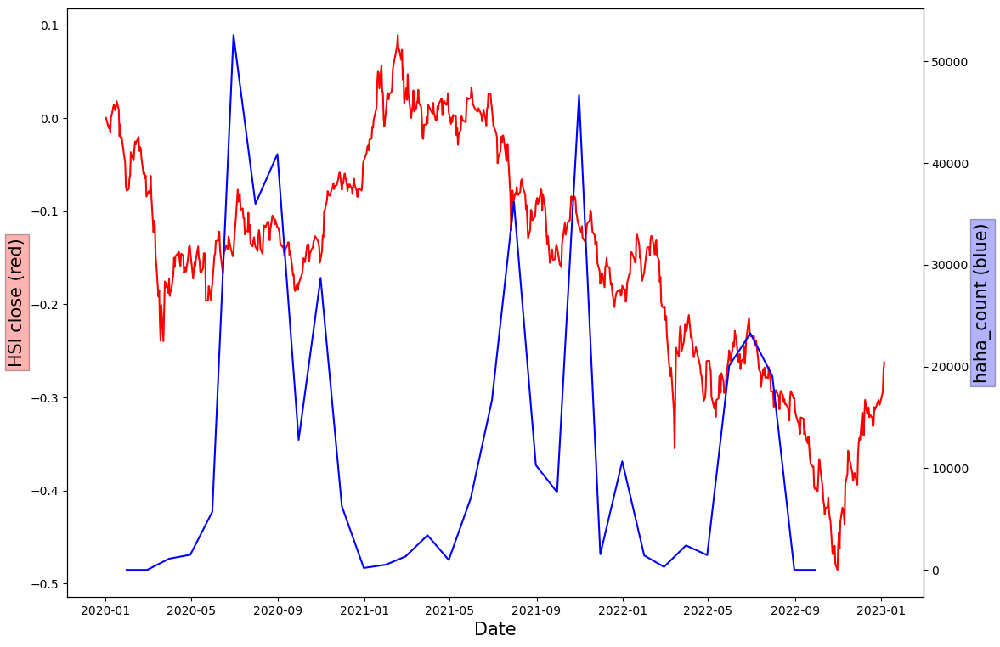

In [161]:
data_to_plot=data_group_month["haha_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('haha_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

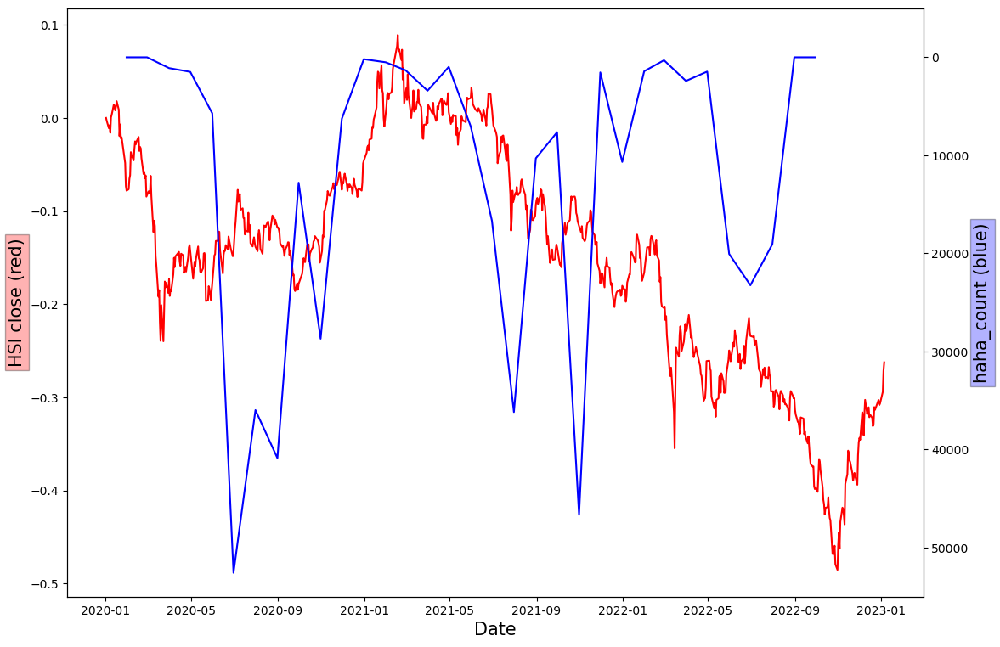

In [163]:
data_to_plot=data_group_month["haha_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(55000,-5000) 
plt.ylabel('haha_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

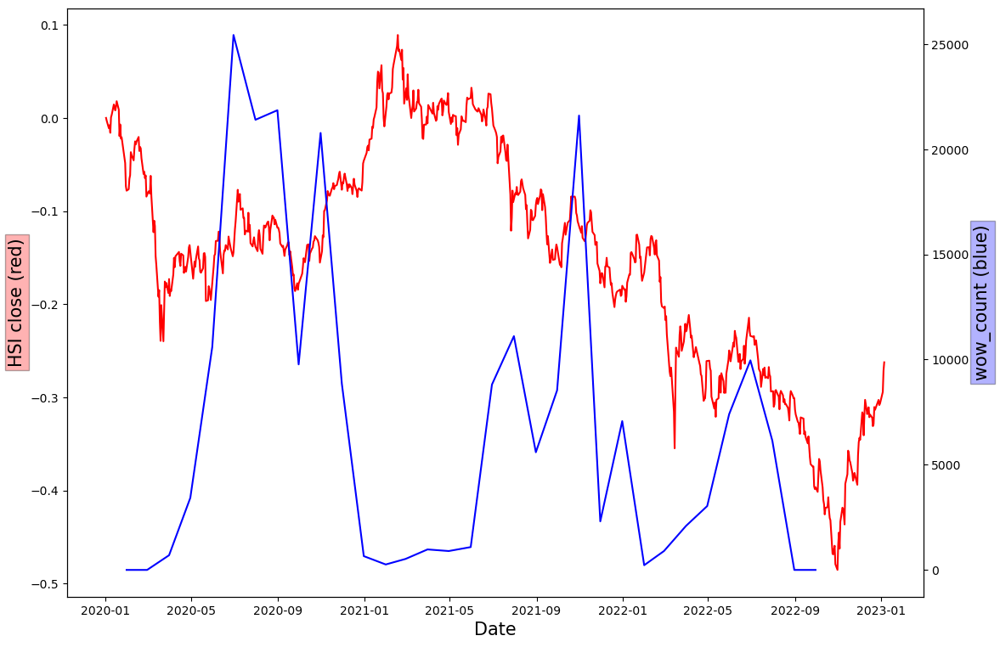

In [164]:
data_to_plot=data_group_month["wow_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('wow_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

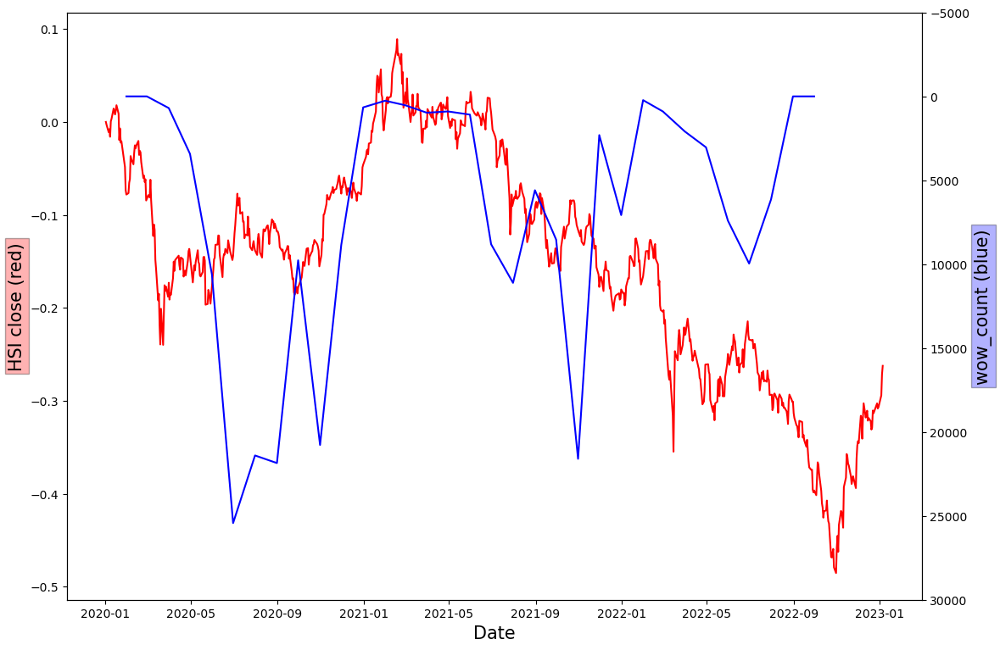

In [167]:
data_to_plot=data_group_month["wow_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(30000,-5000) 
plt.ylabel('wow_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

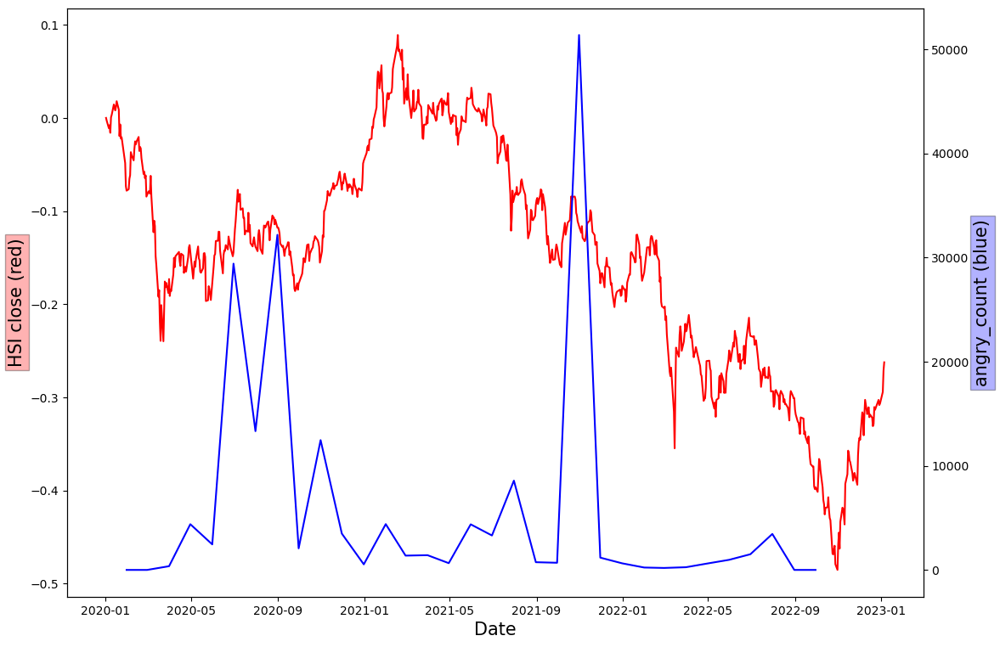

In [168]:
data_to_plot=data_group_month["angry_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('angry_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

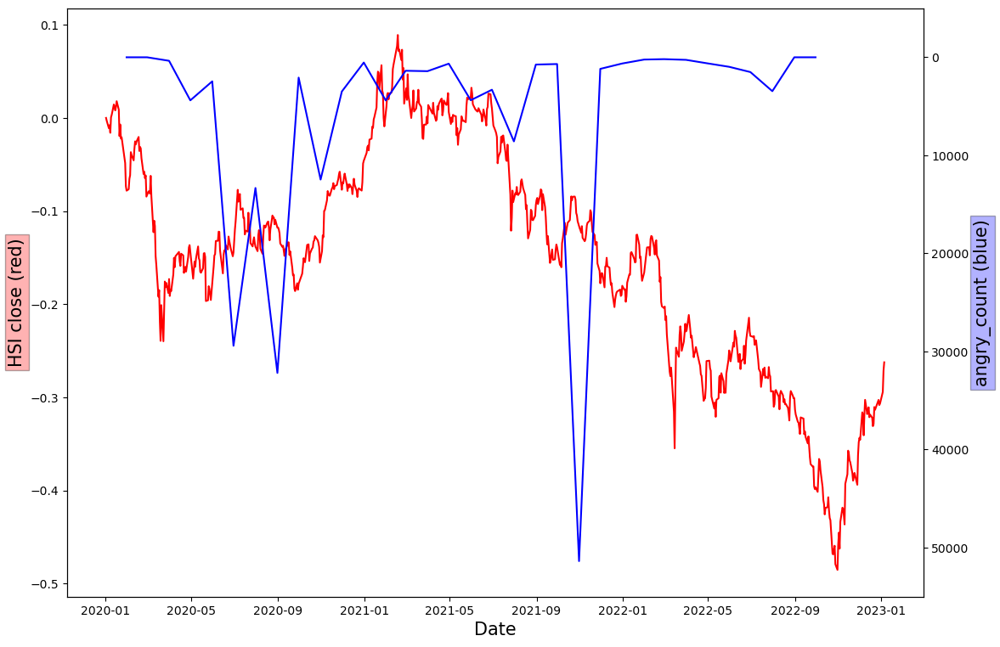

In [170]:
data_to_plot=data_group_month["angry_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(55000,-5000) 
plt.ylabel('angry_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

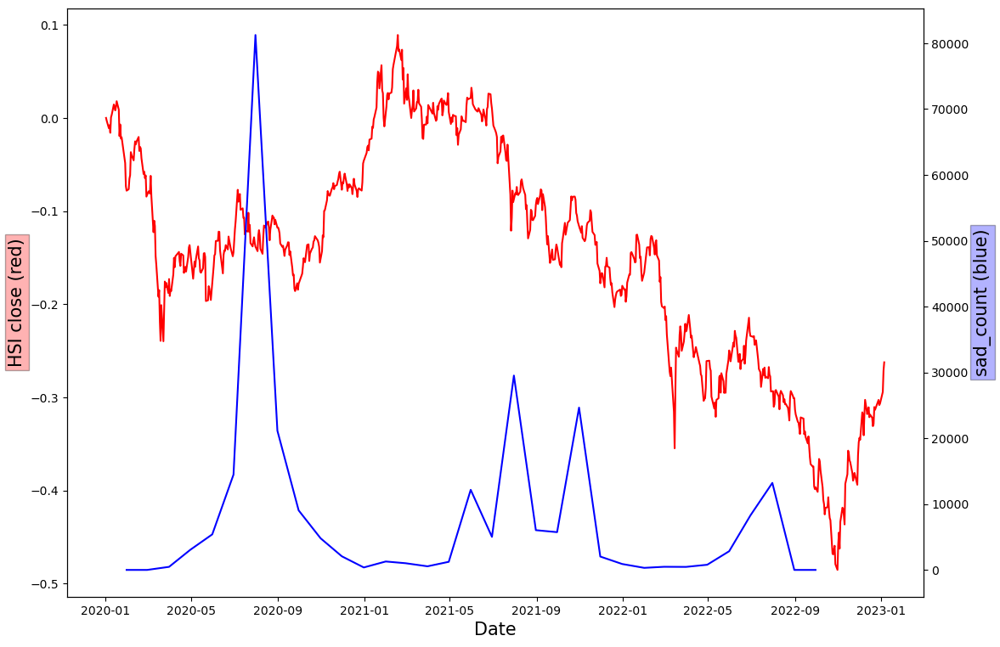

In [171]:
data_to_plot=data_group_month["sad_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('sad_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

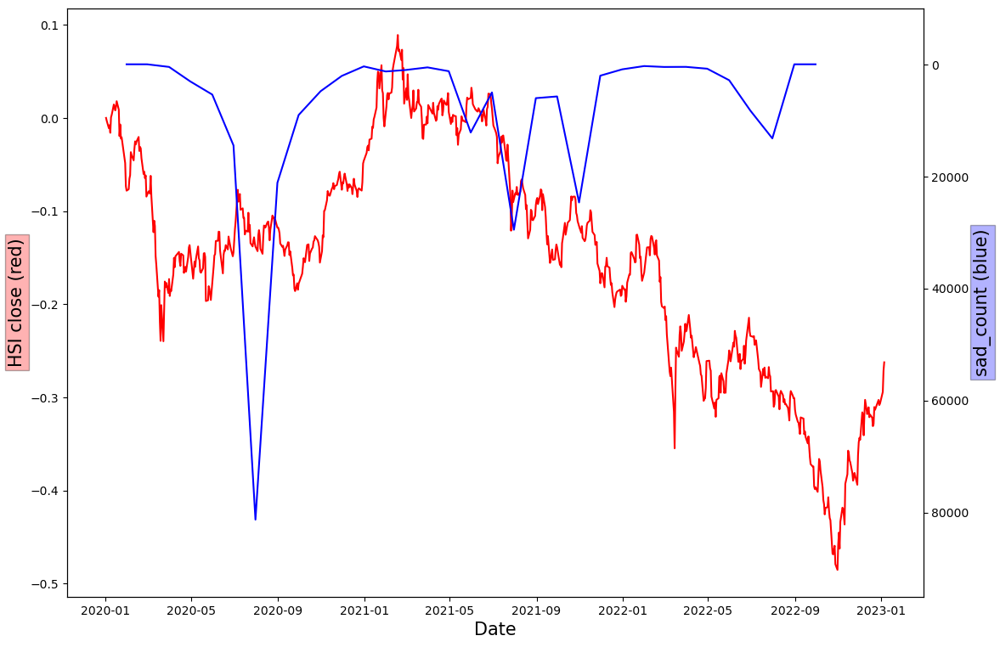

In [174]:
data_to_plot=data_group_month["sad_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(95000,-10000) 
plt.ylabel('sad_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

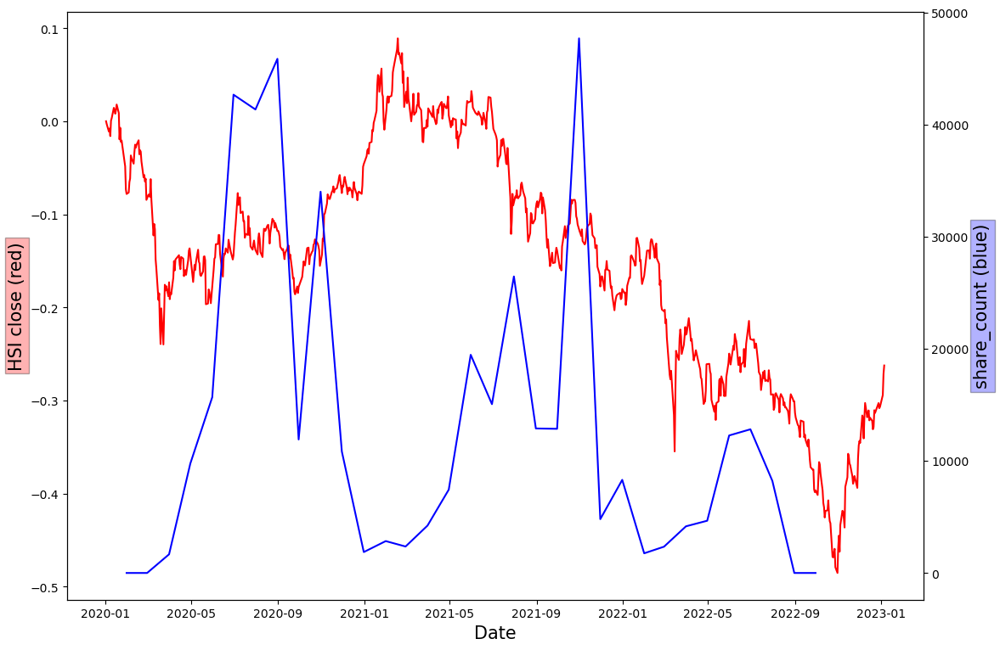

In [175]:
data_to_plot=data_group_month["share_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('share_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

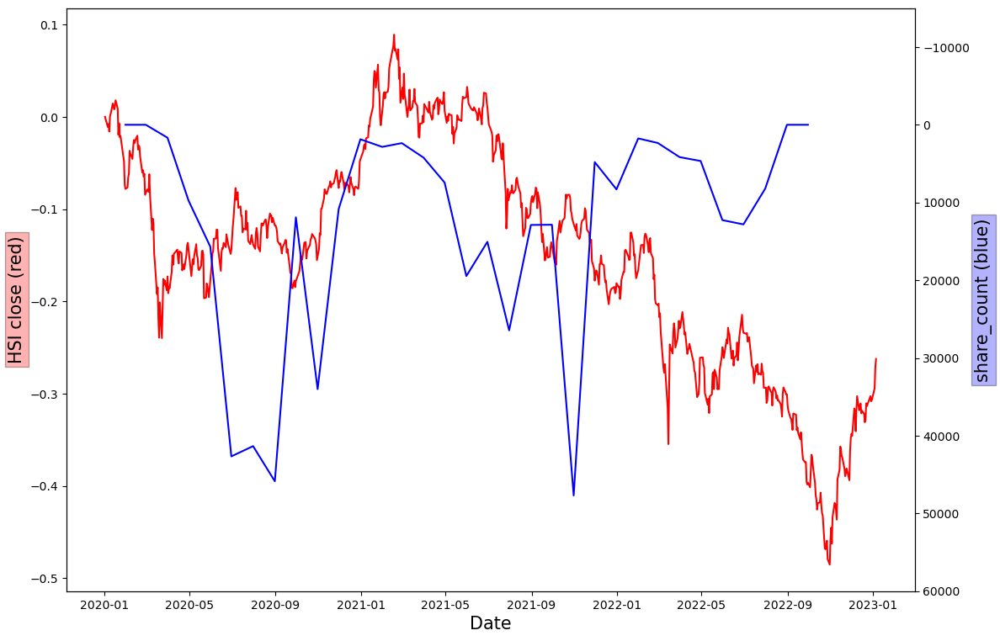

In [177]:
data_to_plot=data_group_month["share_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(60000,-15000) 
plt.ylabel('share_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

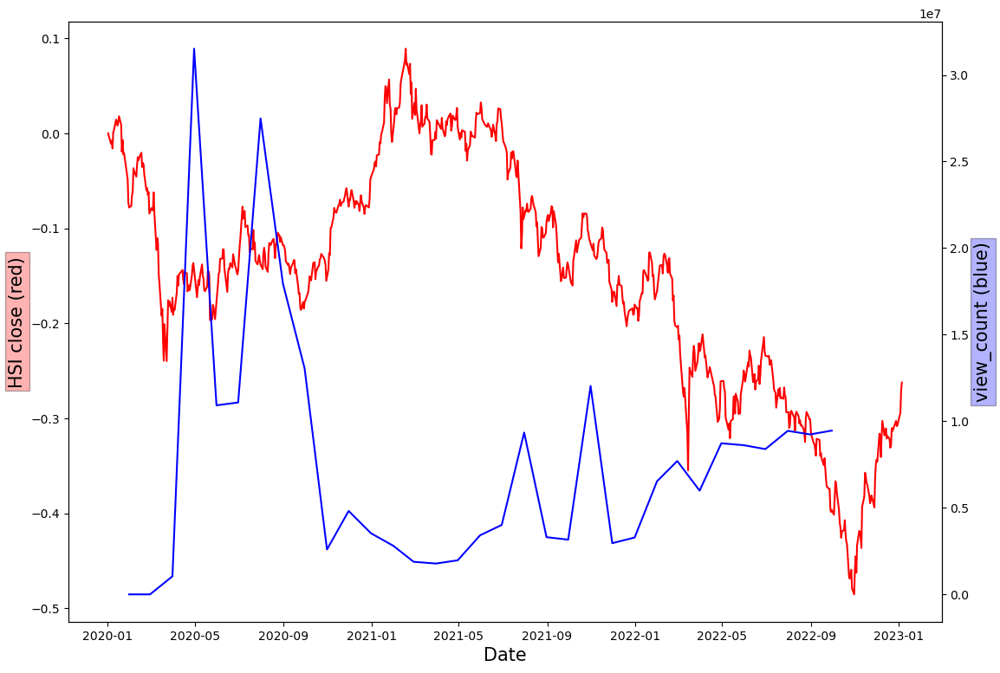

In [178]:
data_to_plot=data_group_month["view_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('view_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

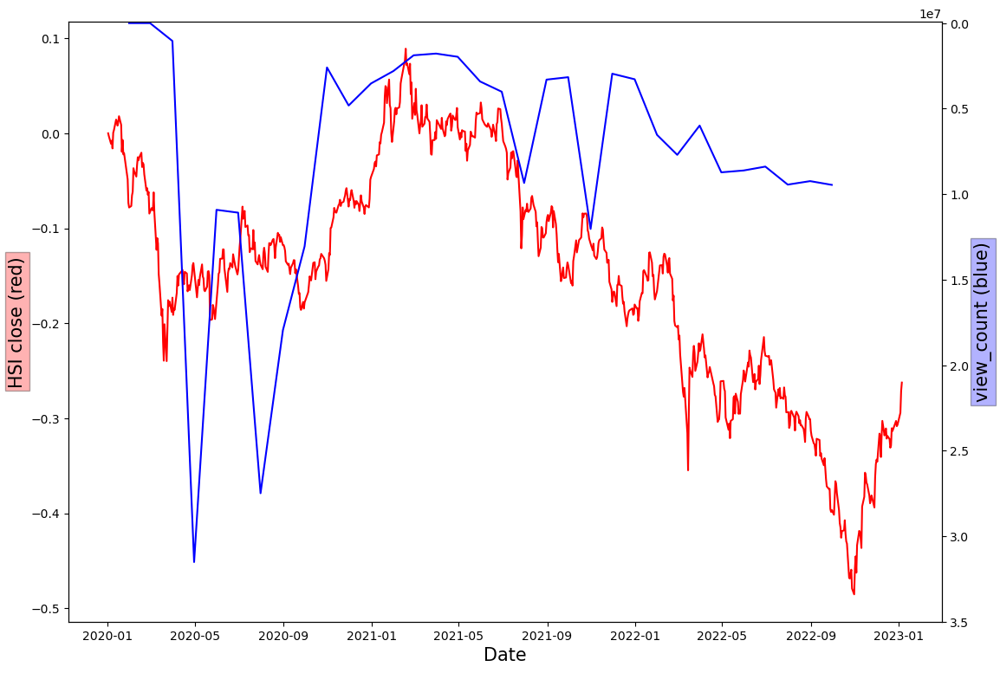

In [181]:
data_to_plot=data_group_month["view_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(35000000,-100000) 
plt.ylabel('view_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

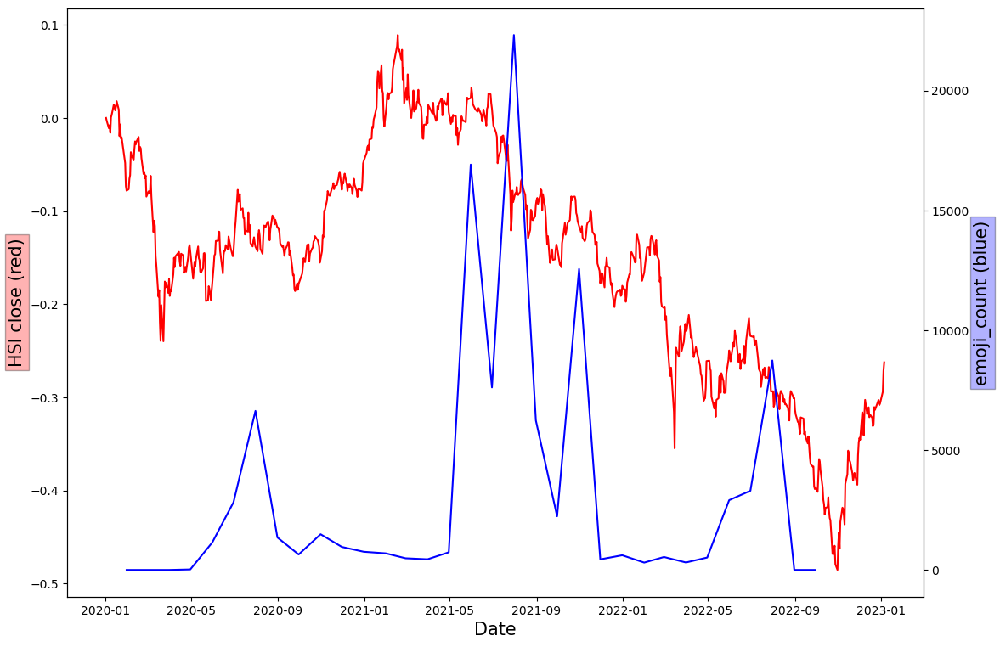

In [182]:
data_to_plot=data_group_month["emoji_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('emoji_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

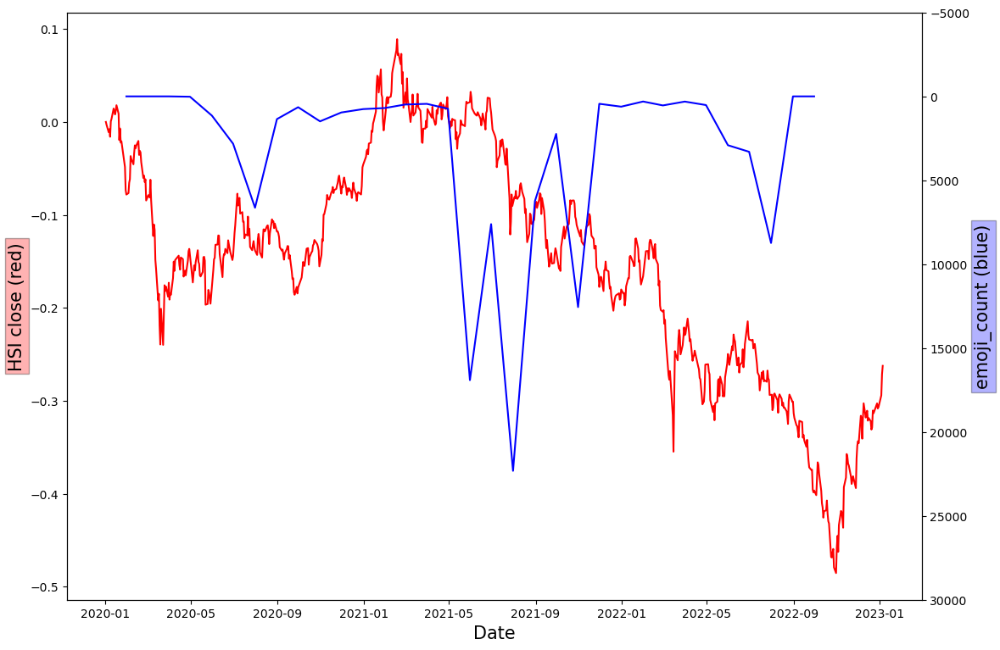

In [184]:
data_to_plot=data_group_month["emoji_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(30000,-5000) 
plt.ylabel('emoji_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

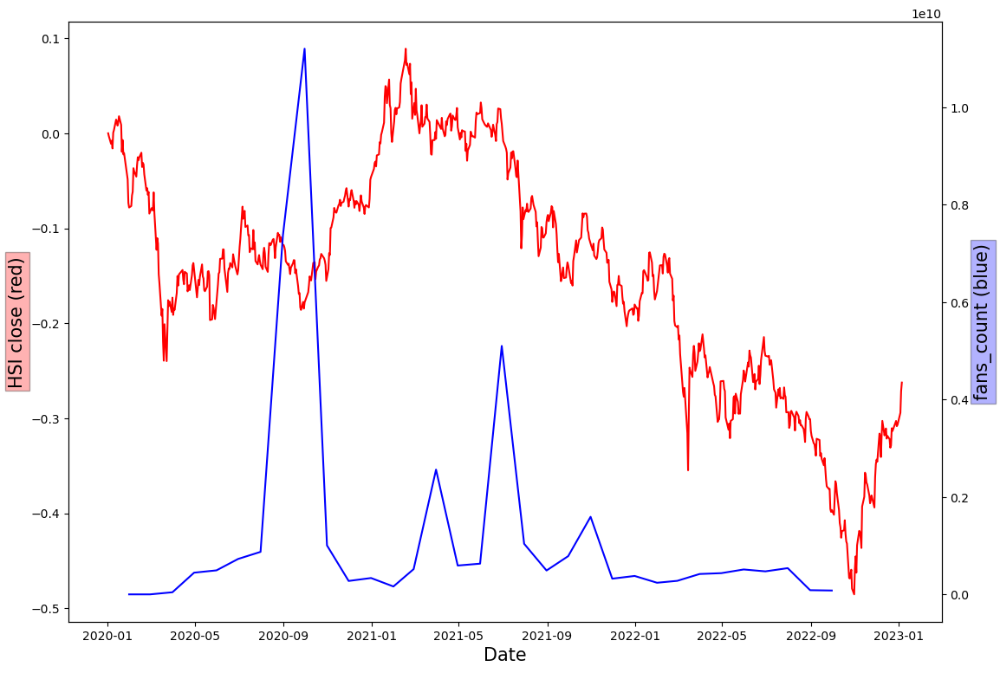

In [185]:
data_to_plot=data_group_month["fans_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(max(data_to_plot),min(data_to_plot)) 
plt.ylabel('fans_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

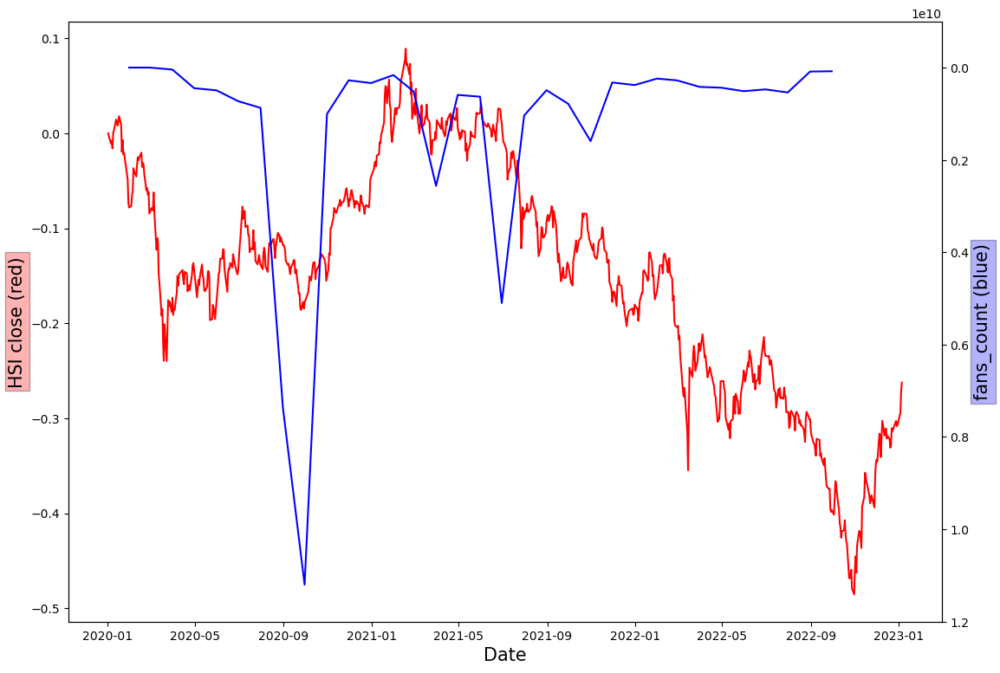

In [193]:
data_to_plot=data_group_month["fans_count"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(12000000000,-1000000000) 
plt.ylabel('fans_count (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

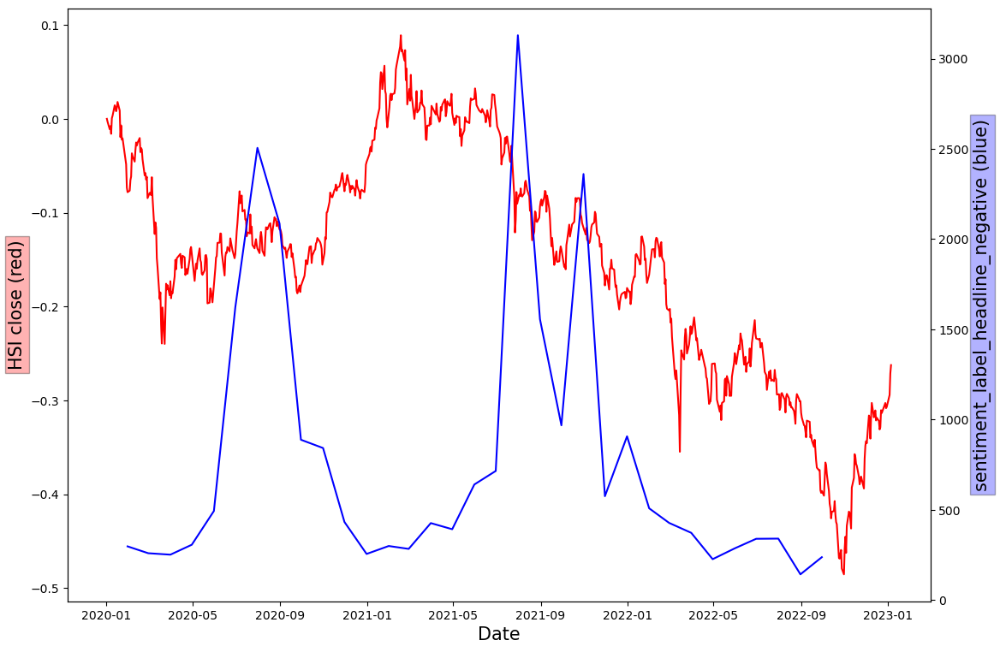

In [195]:
data_to_plot=data_group_month["sentiment_label_headline_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(12000000000,-1000000000) 
plt.ylabel('sentiment_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

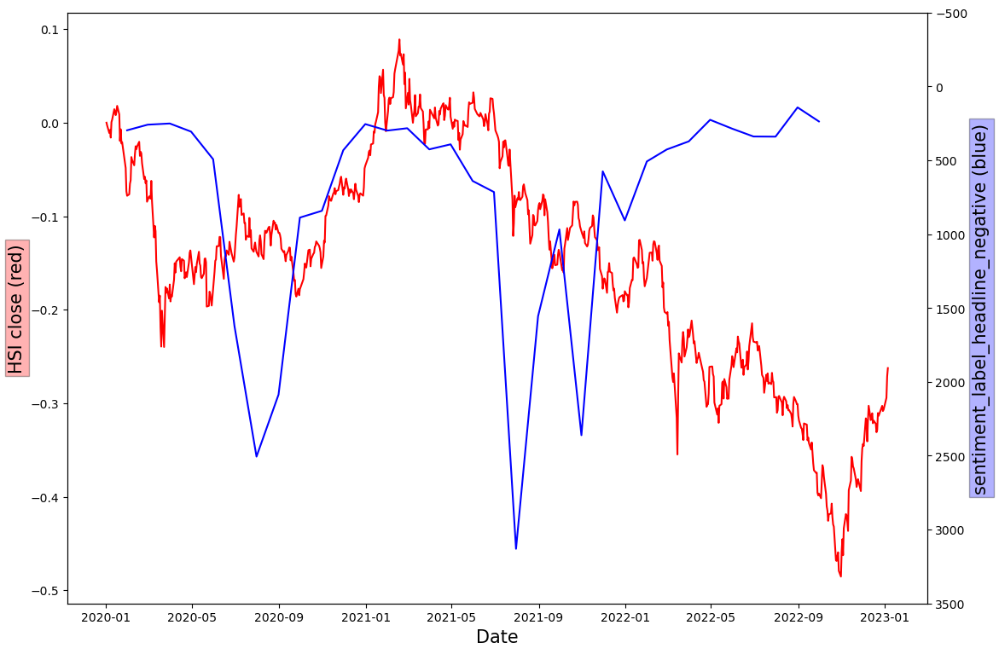

In [198]:
data_to_plot=data_group_month["sentiment_label_headline_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(3500,-500) 
plt.ylabel('sentiment_label_headline_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

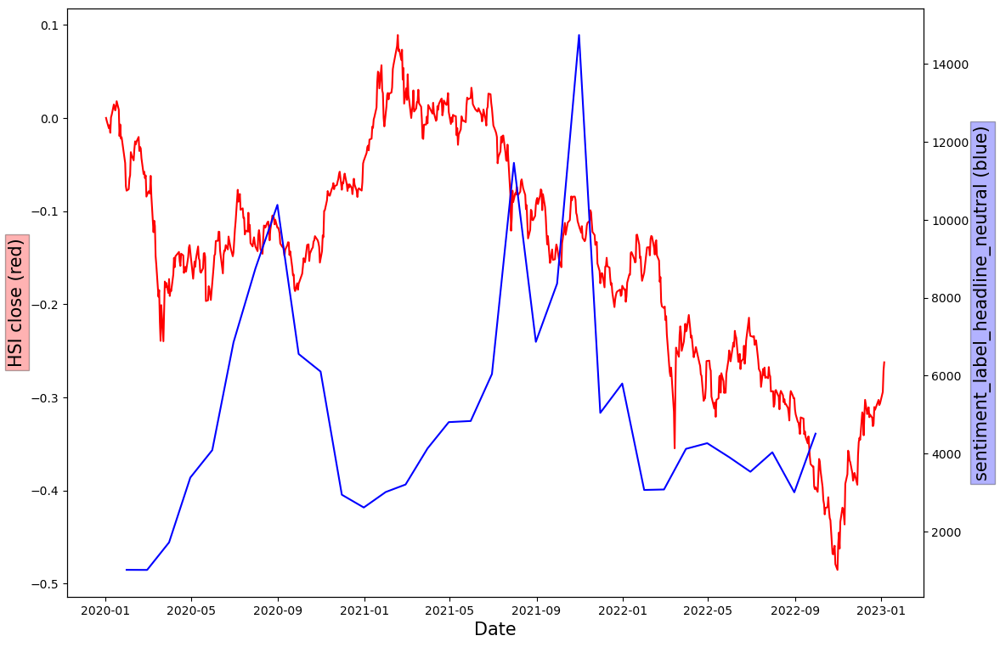

In [199]:
data_to_plot=data_group_month["sentiment_label_headline_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3500,-500) 
plt.ylabel('sentiment_label_headline_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

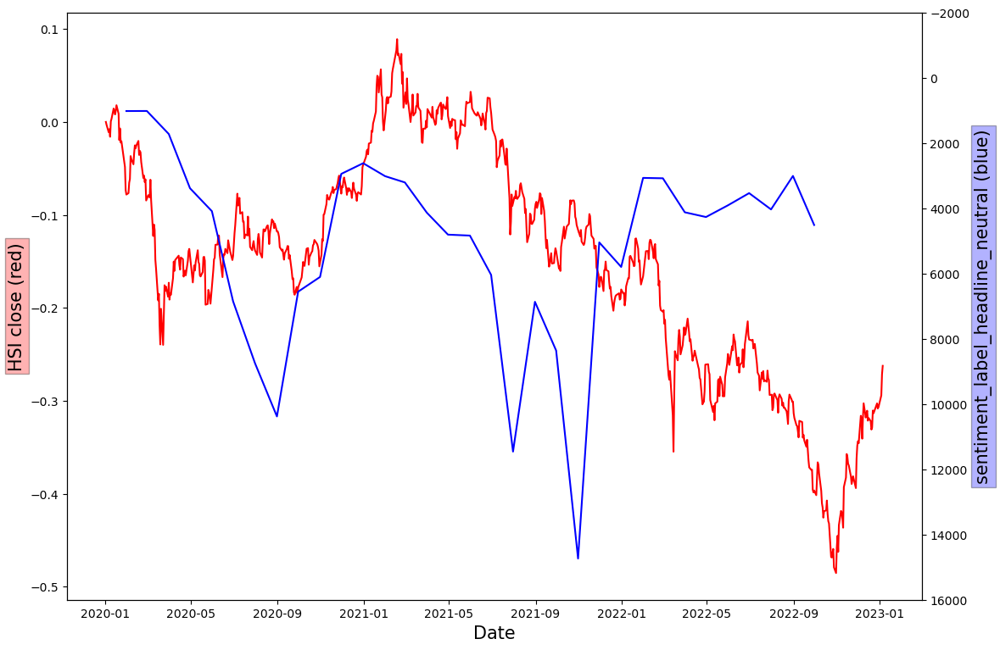

In [201]:
data_to_plot=data_group_month["sentiment_label_headline_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(16000,-2000) 
plt.ylabel('sentiment_label_headline_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

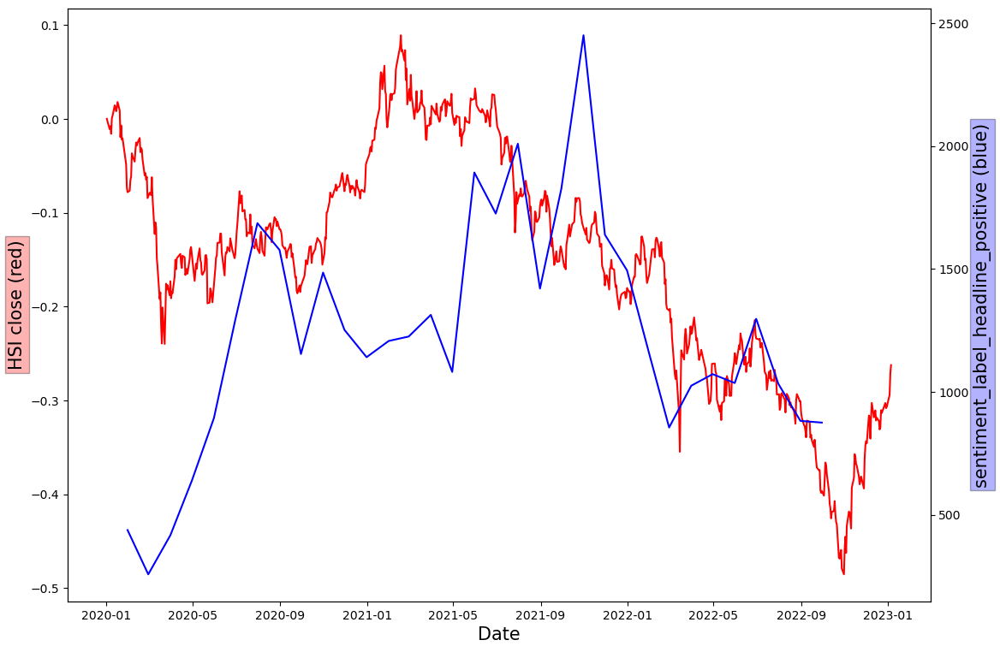

In [202]:
data_to_plot=data_group_month["sentiment_label_headline_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3500,-500) 
plt.ylabel('sentiment_label_headline_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

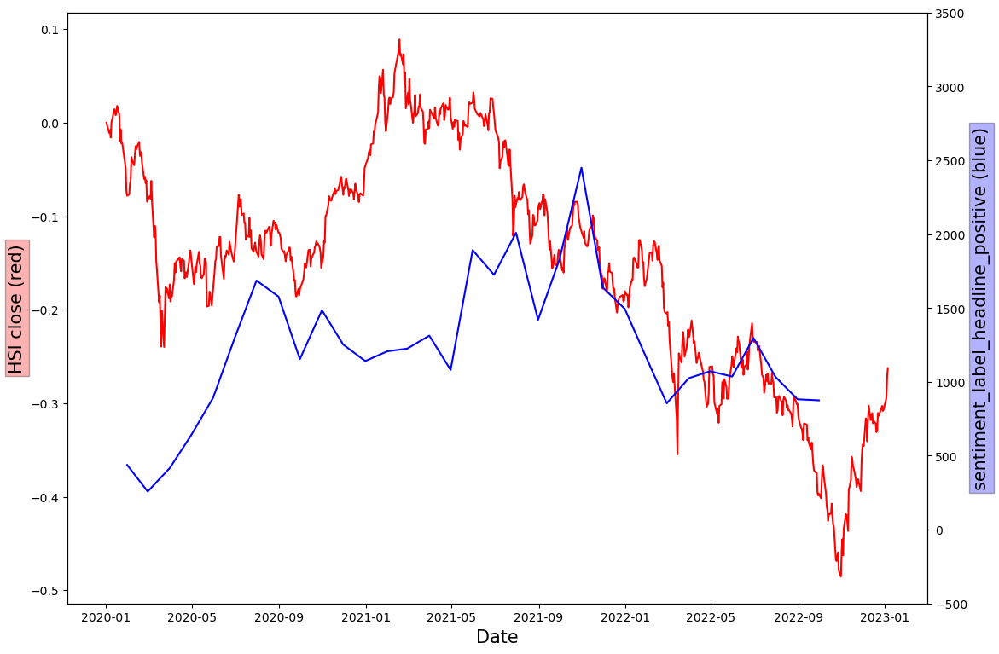

In [204]:
data_to_plot=data_group_month["sentiment_label_headline_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-500,3500) 
plt.ylabel('sentiment_label_headline_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

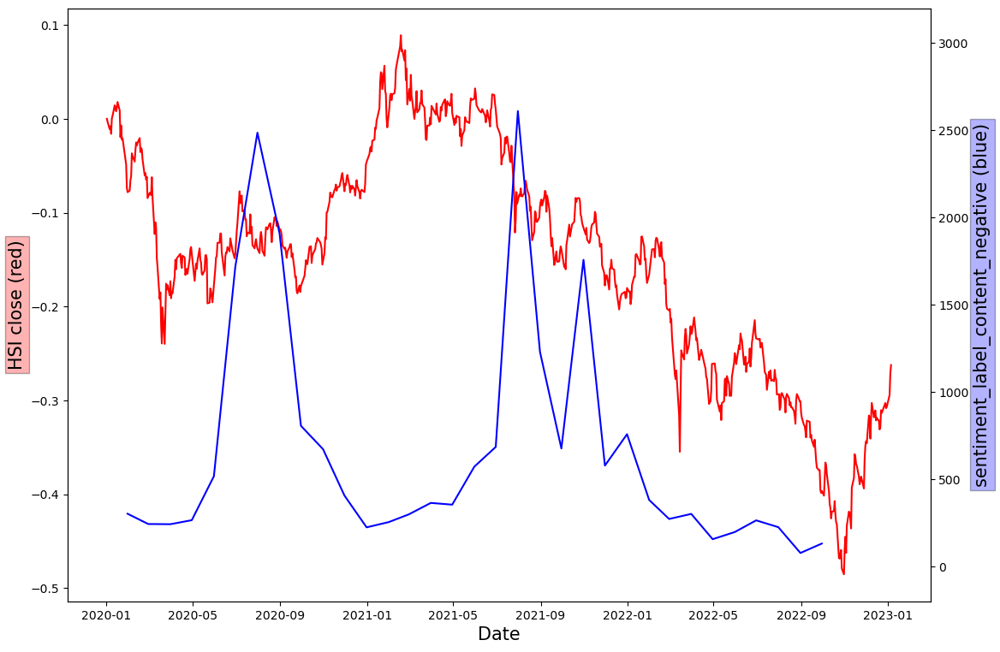

In [209]:
data_to_plot=data_group_month["sentiment_label_content_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-200,3200) 
plt.ylabel('sentiment_label_content_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

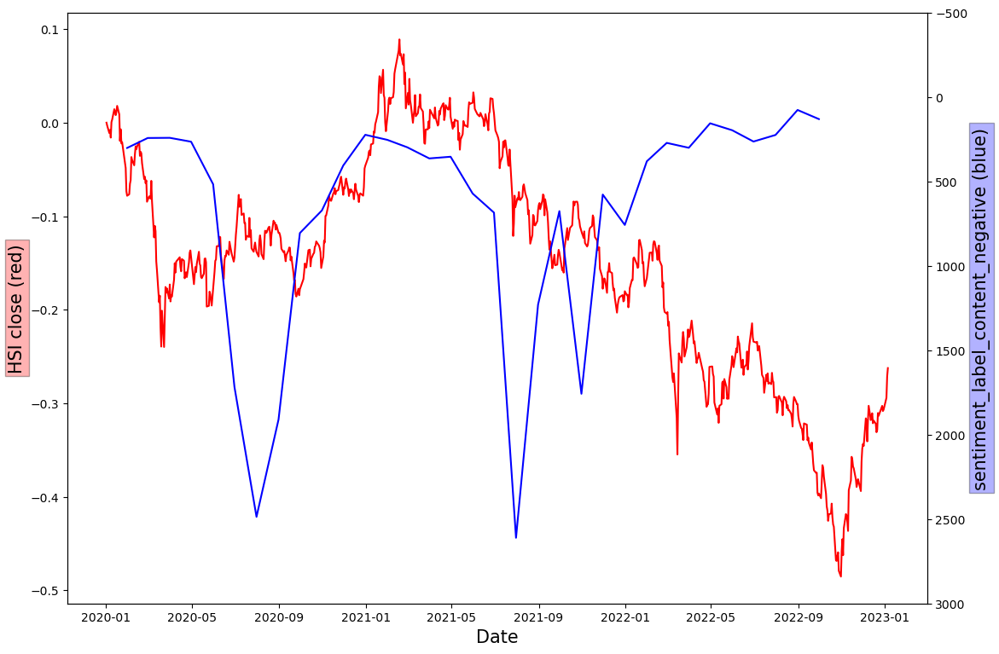

In [207]:
data_to_plot=data_group_month["sentiment_label_content_negative"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(3000,-500) 
plt.ylabel('sentiment_label_content_negative (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

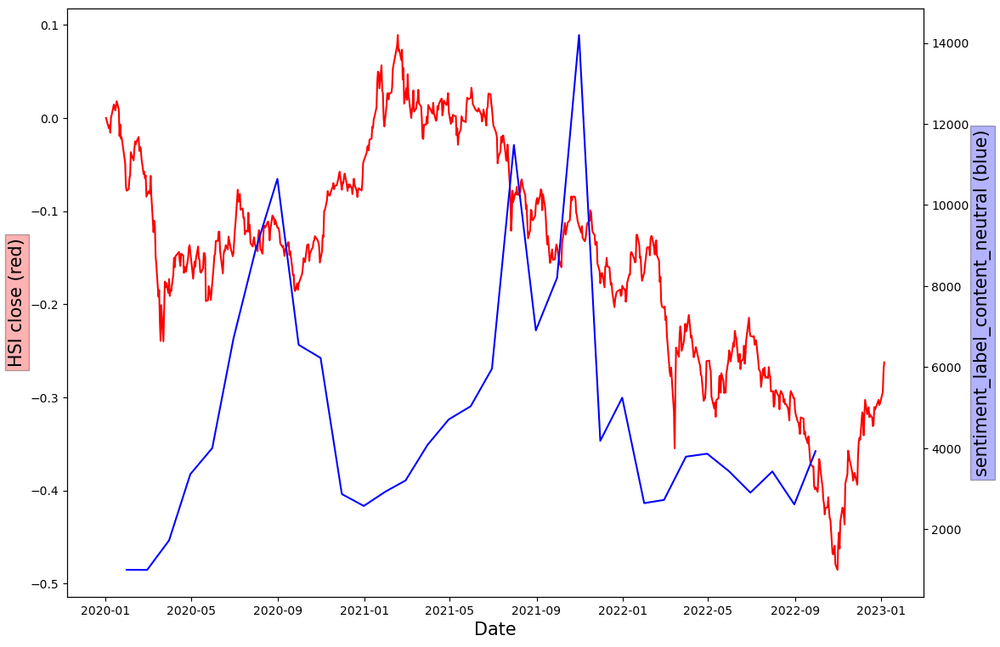

In [210]:
data_to_plot=data_group_month["sentiment_label_content_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(3000,-500) 
plt.ylabel('sentiment_label_content_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

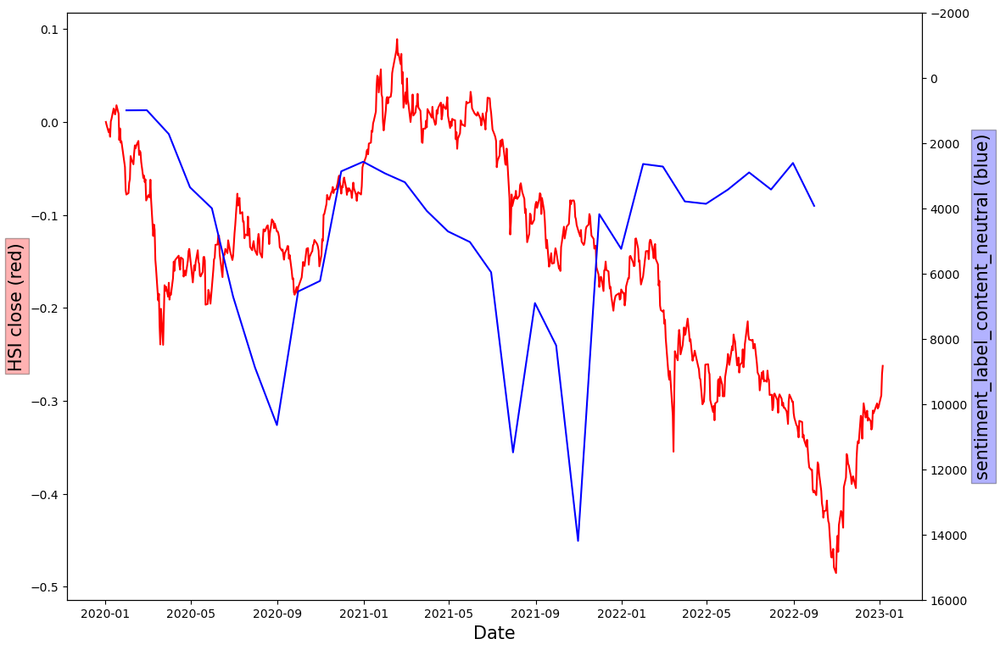

In [211]:
data_to_plot=data_group_month["sentiment_label_content_neutral"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(16000,-2000) 
plt.ylabel('sentiment_label_content_neutral (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

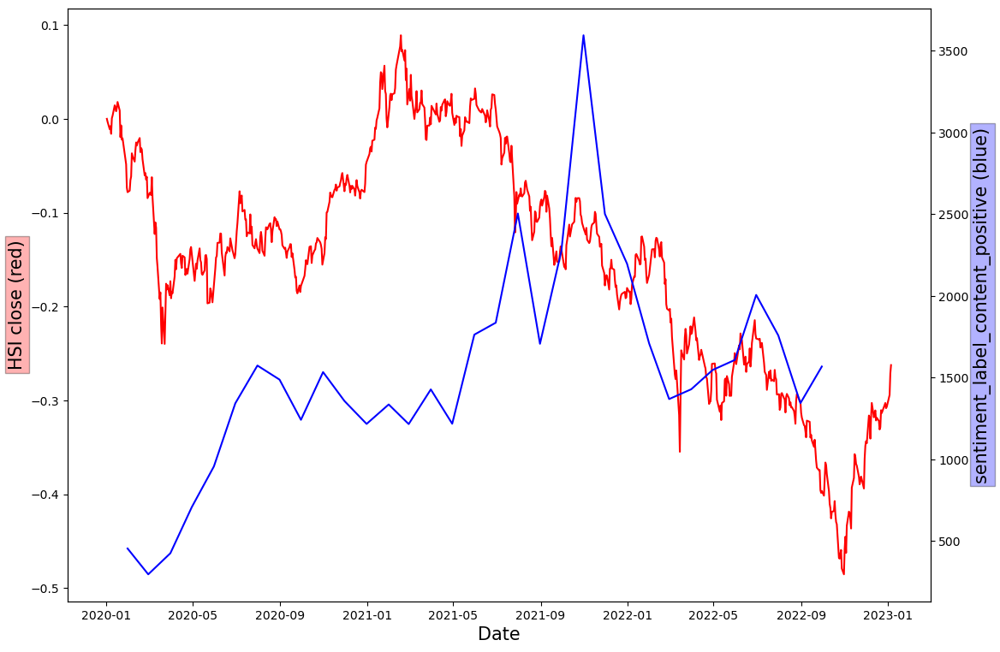

In [213]:
data_to_plot=data_group_month["sentiment_label_content_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(16000,-2000) 
plt.ylabel('sentiment_label_content_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

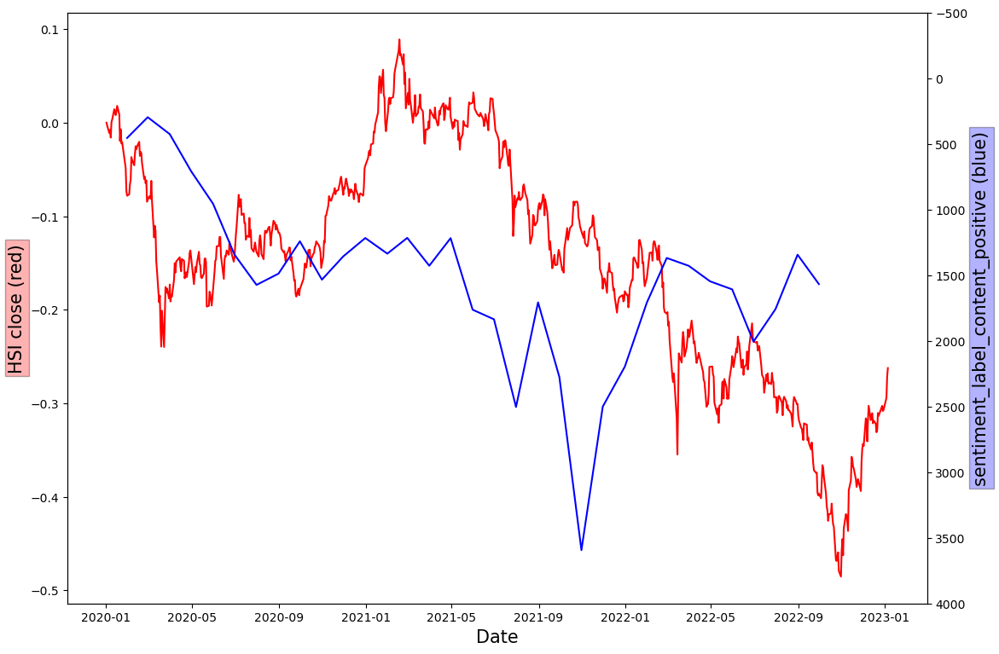

In [214]:
data_to_plot=data_group_month["sentiment_label_content_positive"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(4000,-500) 
plt.ylabel('sentiment_label_content_positive (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

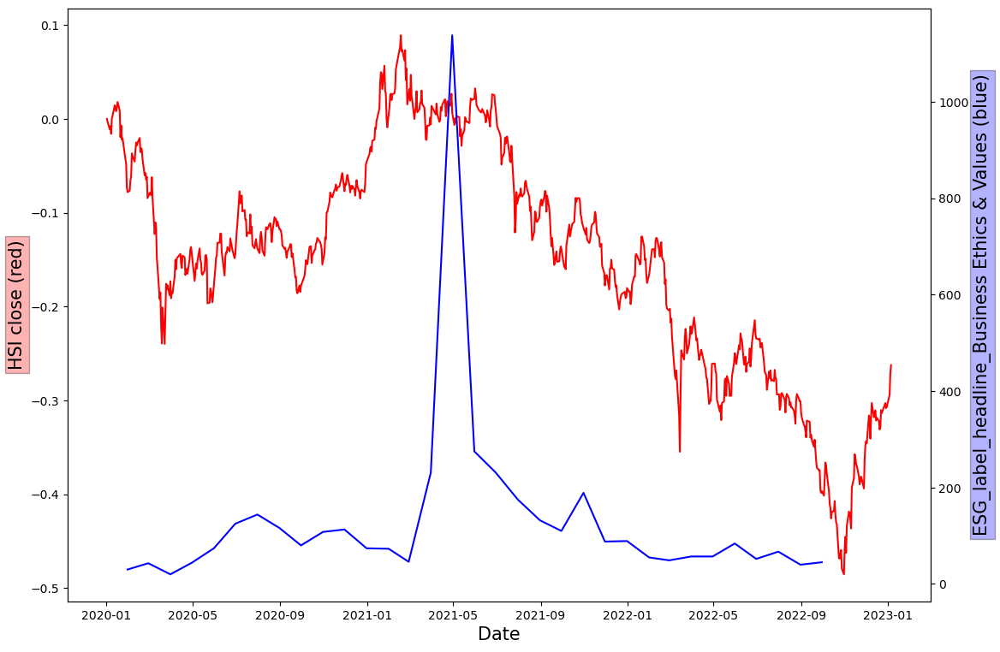

In [217]:
data_to_plot=data_group_month["ESG_label_headline_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1200,-100) 
plt.ylabel('ESG_label_headline_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

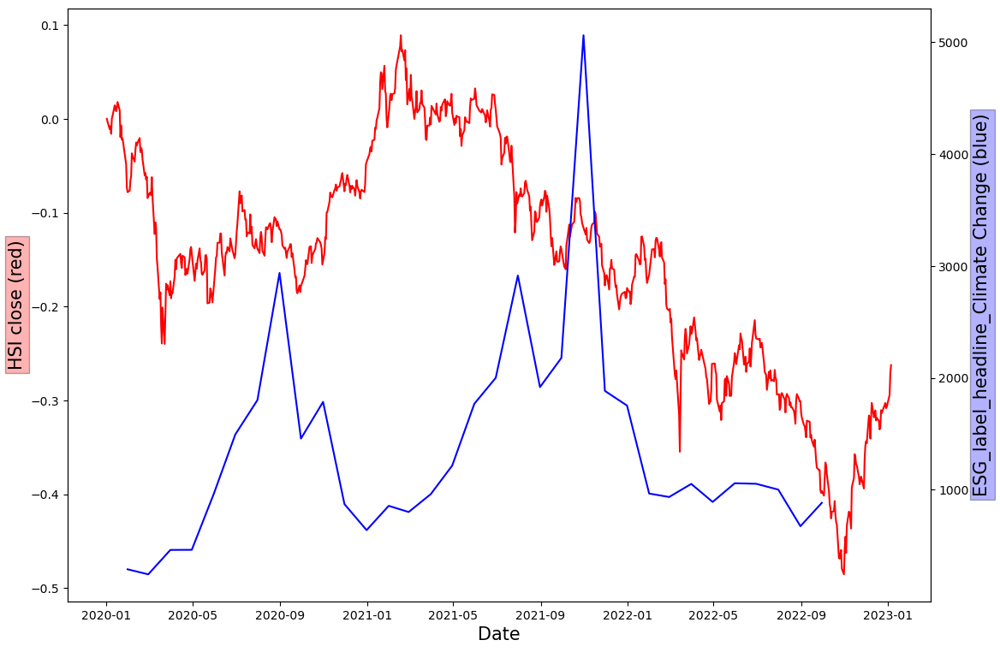

In [218]:
data_to_plot=data_group_month["ESG_label_headline_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1200,-100) 
plt.ylabel('ESG_label_headline_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

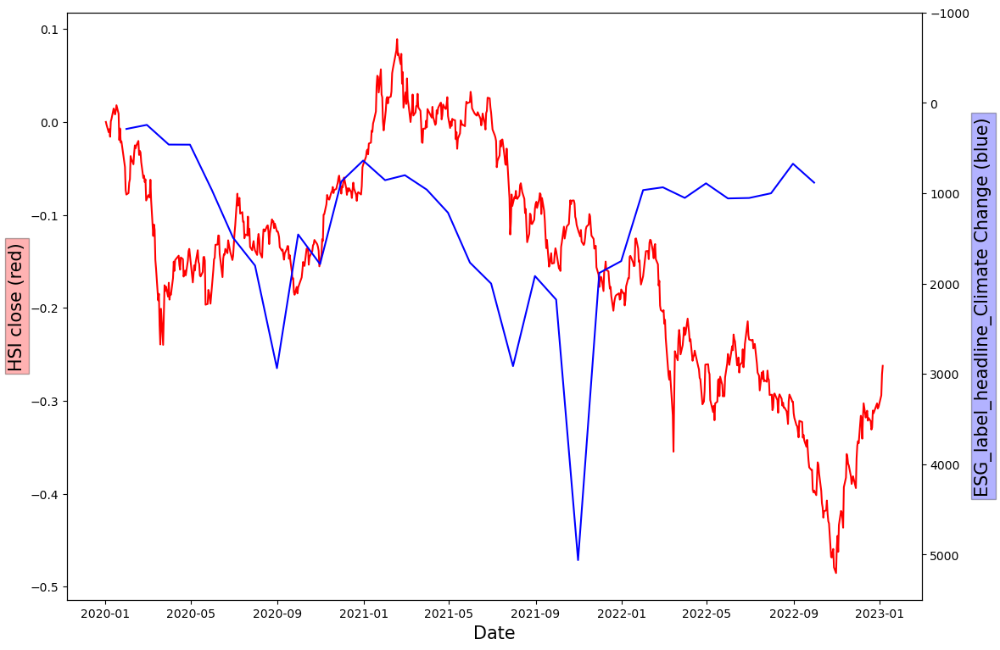

In [219]:
data_to_plot=data_group_month["ESG_label_headline_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(5500,-1000) 
plt.ylabel('ESG_label_headline_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

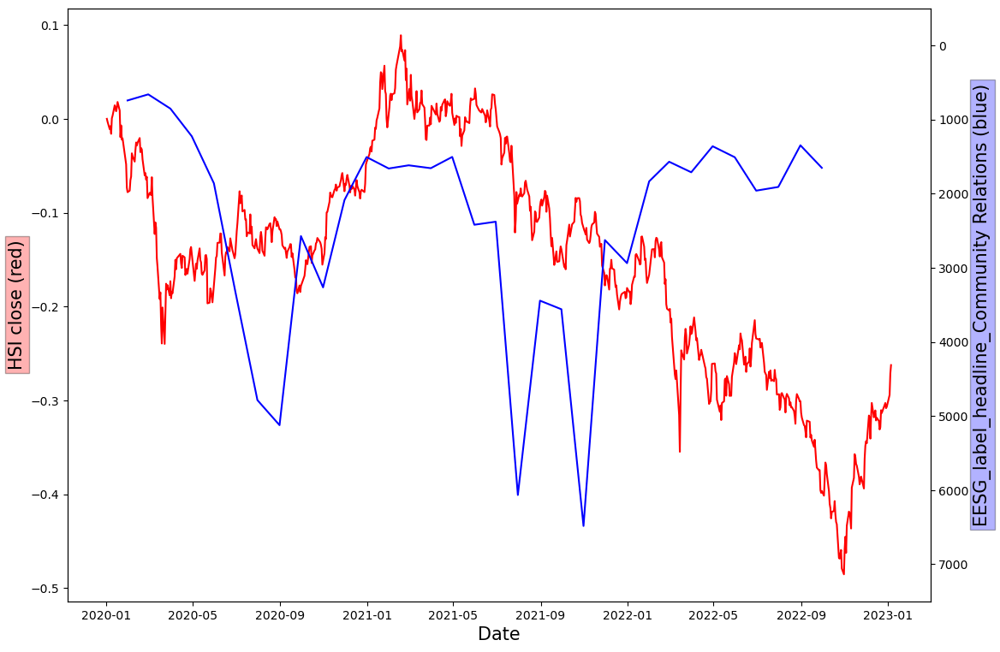

In [221]:
data_to_plot=data_group_month["ESG_label_headline_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(7500,-500) 
plt.ylabel('EESG_label_headline_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

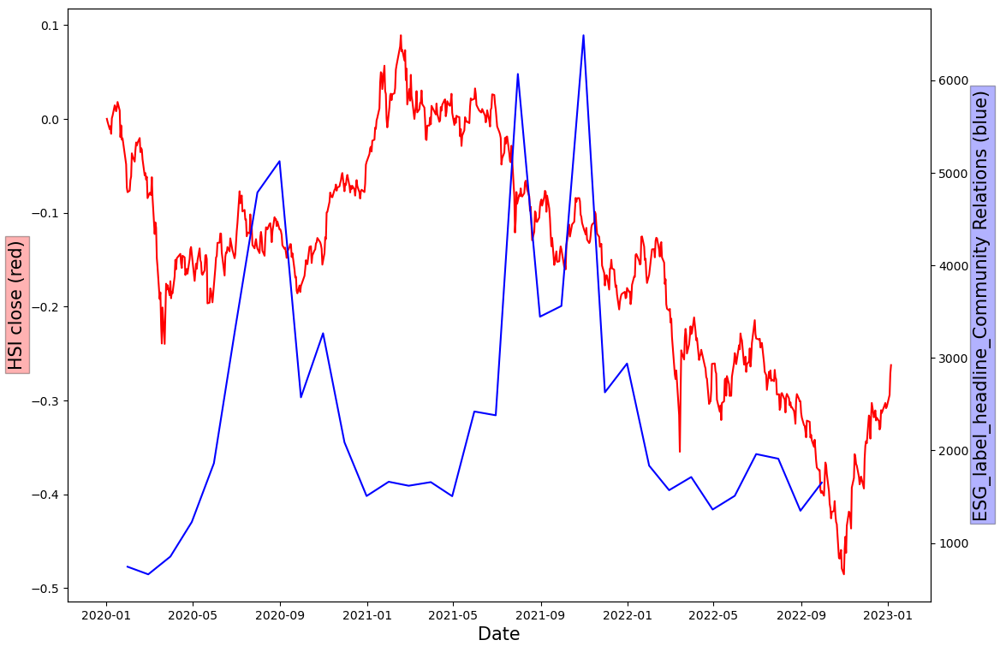

In [224]:
data_to_plot=data_group_month["ESG_label_headline_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(7500,-500) 
plt.ylabel('ESG_label_headline_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

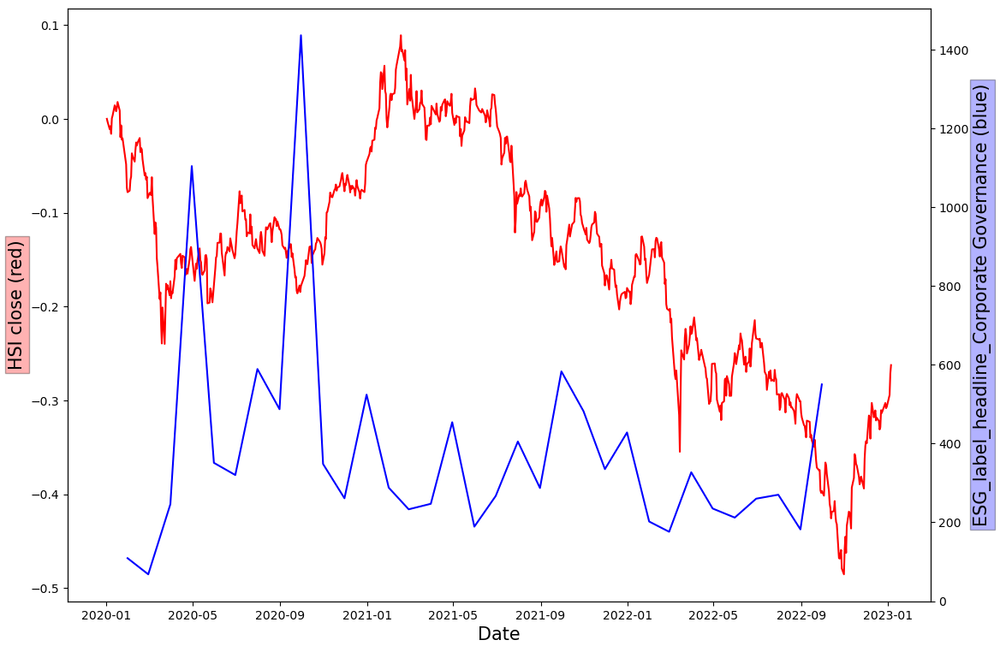

In [225]:
data_to_plot=data_group_month["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(7500,-500) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

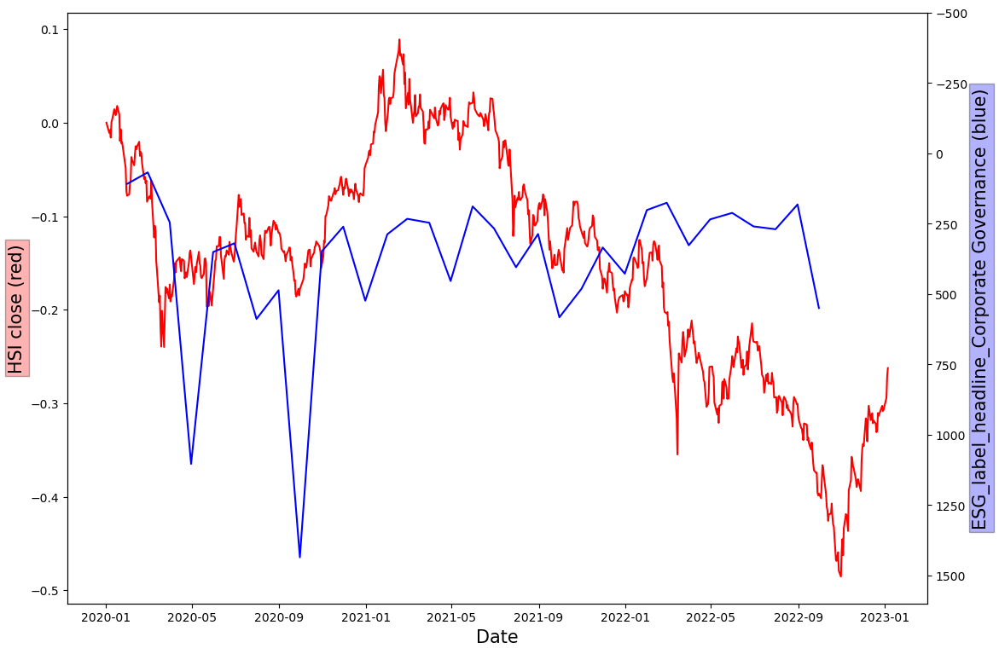

In [226]:
data_to_plot=data_group_month["ESG_label_headline_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1600,-500) 
plt.ylabel('ESG_label_headline_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

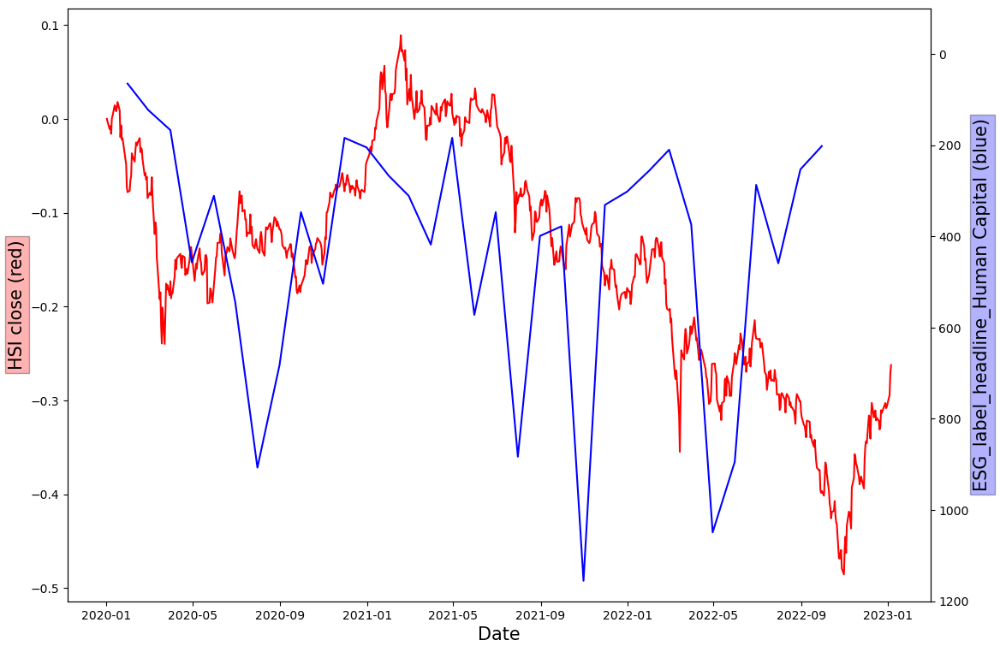

In [229]:
data_to_plot=data_group_month["ESG_label_headline_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1200,-100) 
plt.ylabel('ESG_label_headline_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

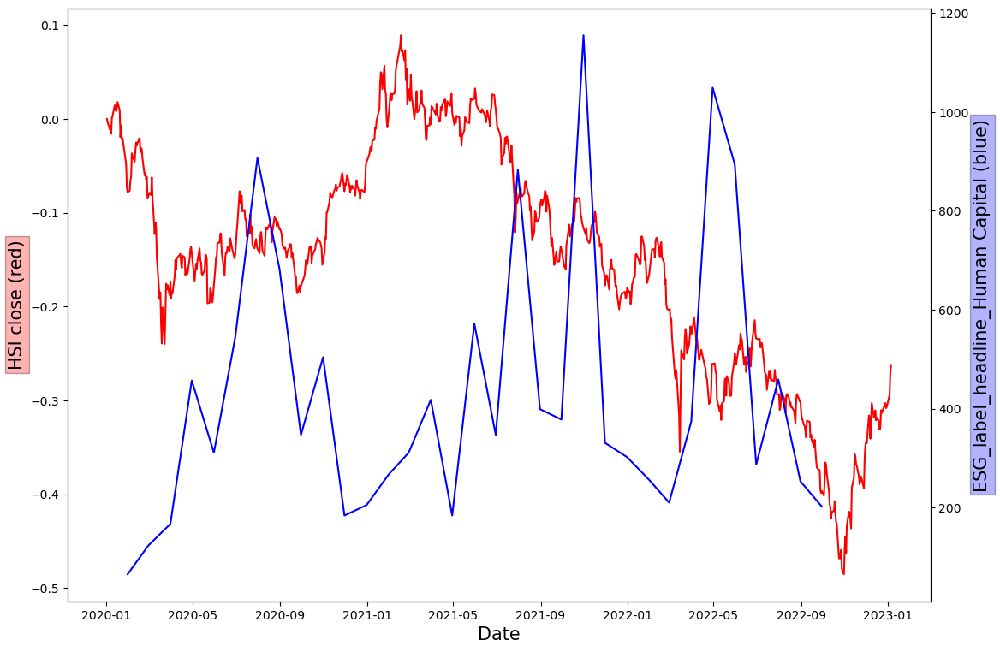

In [230]:
data_to_plot=data_group_month["ESG_label_headline_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1200,-100) 
plt.ylabel('ESG_label_headline_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

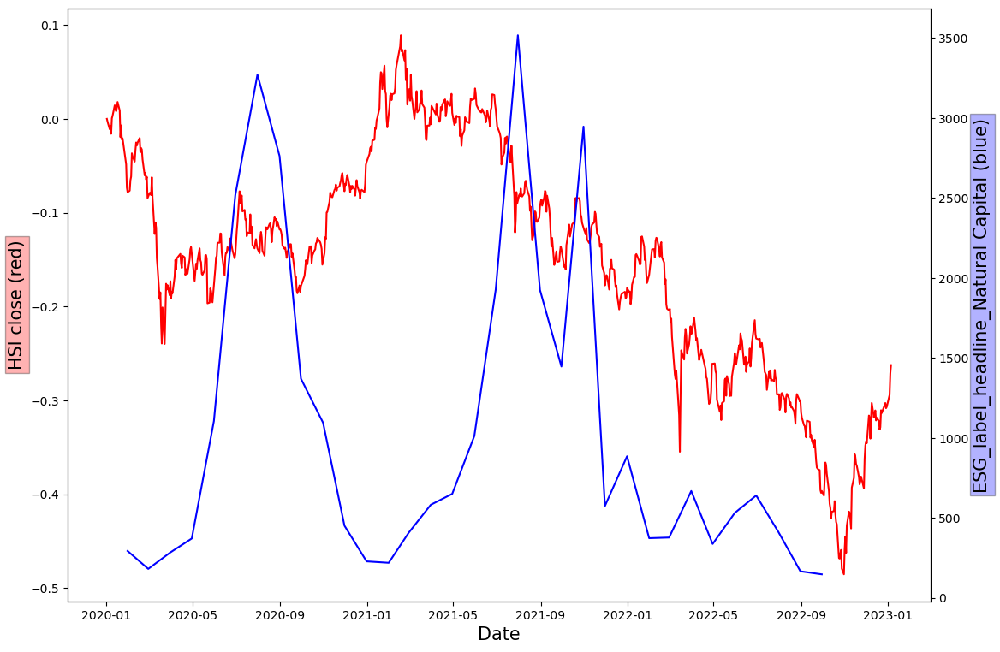

In [231]:
data_to_plot=data_group_month["ESG_label_headline_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1200,-100) 
plt.ylabel('ESG_label_headline_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

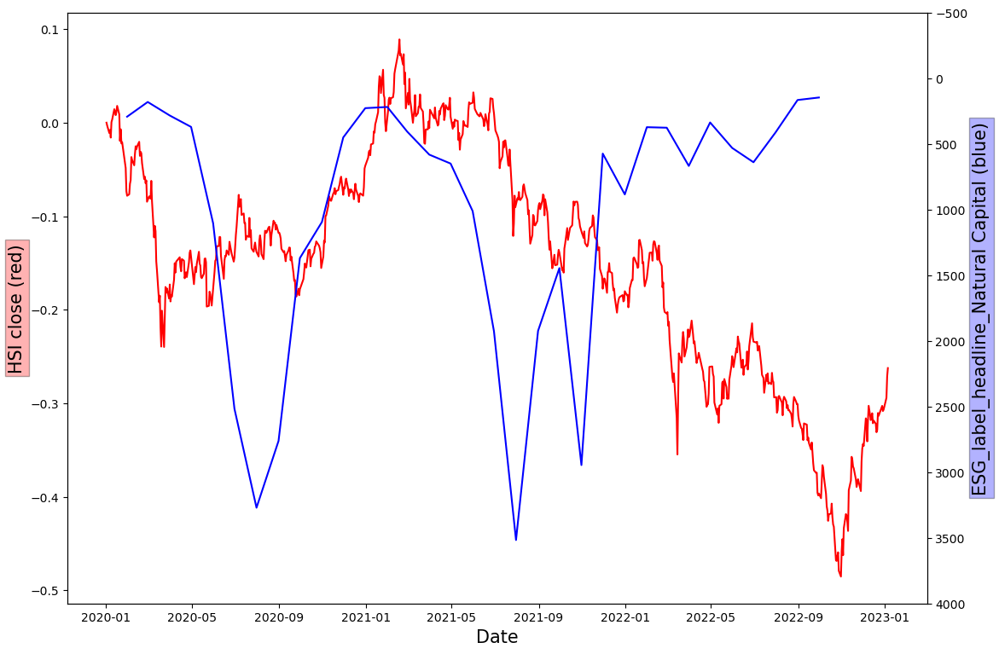

In [233]:
data_to_plot=data_group_month["ESG_label_headline_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(4000,-500) 
plt.ylabel('ESG_label_headline_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

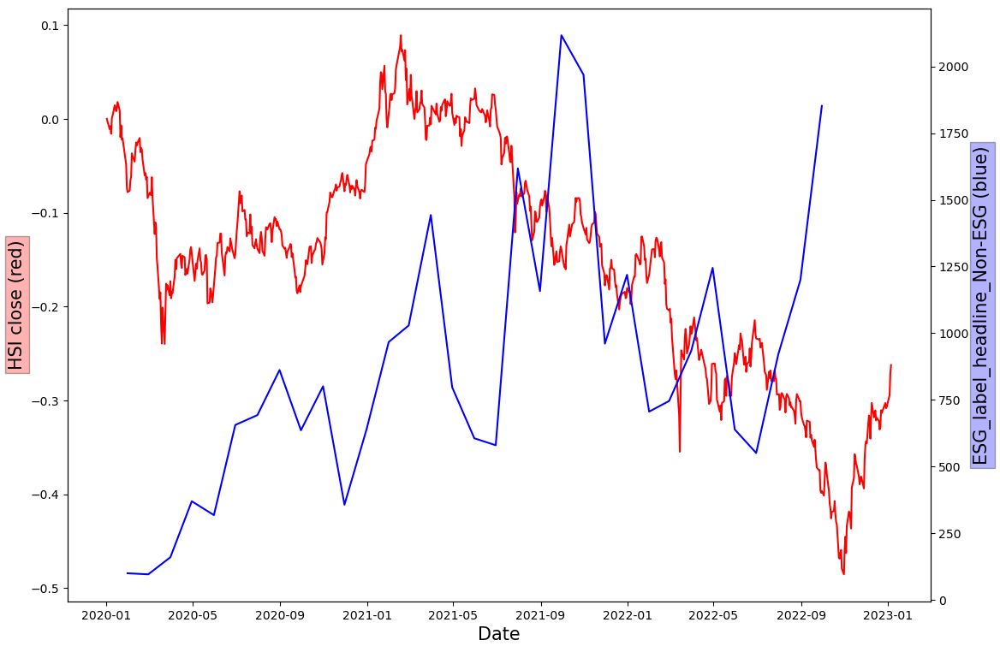

In [234]:
data_to_plot=data_group_month["ESG_label_headline_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(4000,-500) 
plt.ylabel('ESG_label_headline_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

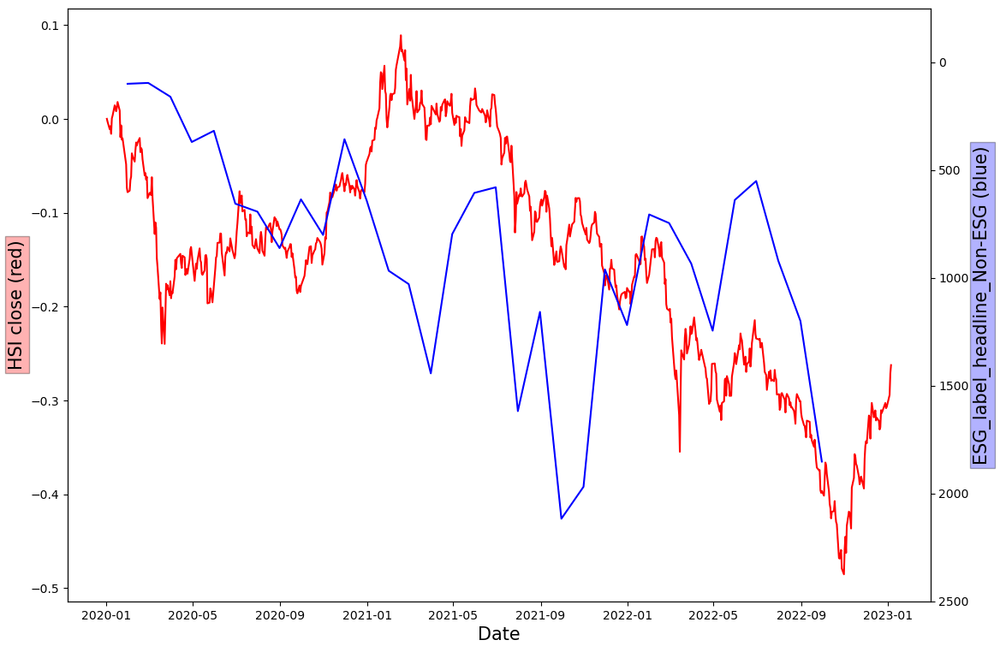

In [235]:
data_to_plot=data_group_month["ESG_label_headline_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(2500,-250) 
plt.ylabel('ESG_label_headline_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

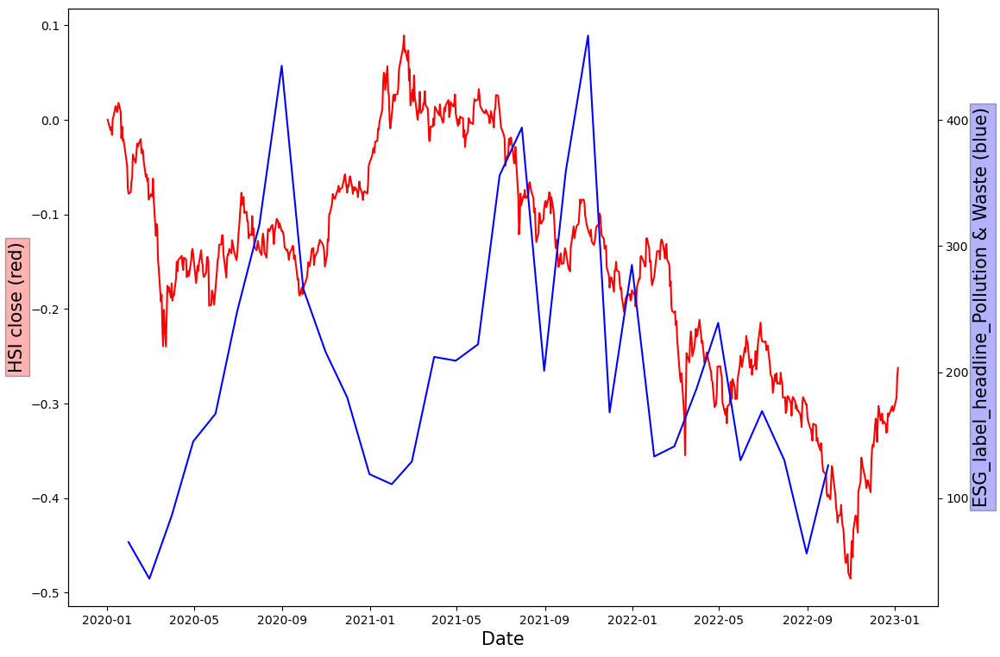

In [236]:
data_to_plot=data_group_month["ESG_label_headline_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(2500,-250) 
plt.ylabel('ESG_label_headline_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

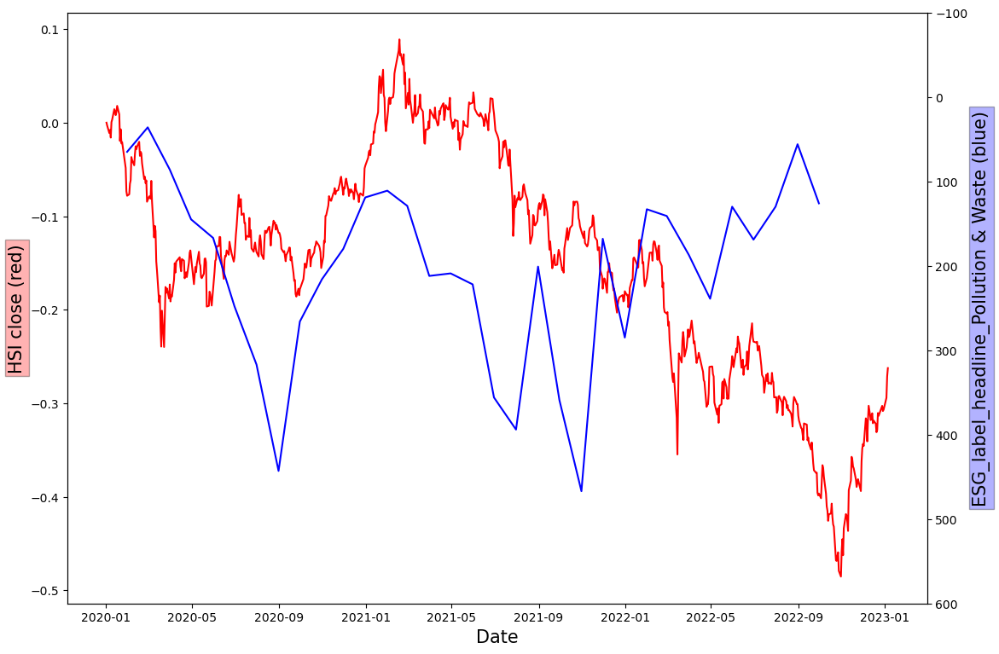

In [237]:
data_to_plot=data_group_month["ESG_label_headline_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(600,-100) 
plt.ylabel('ESG_label_headline_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

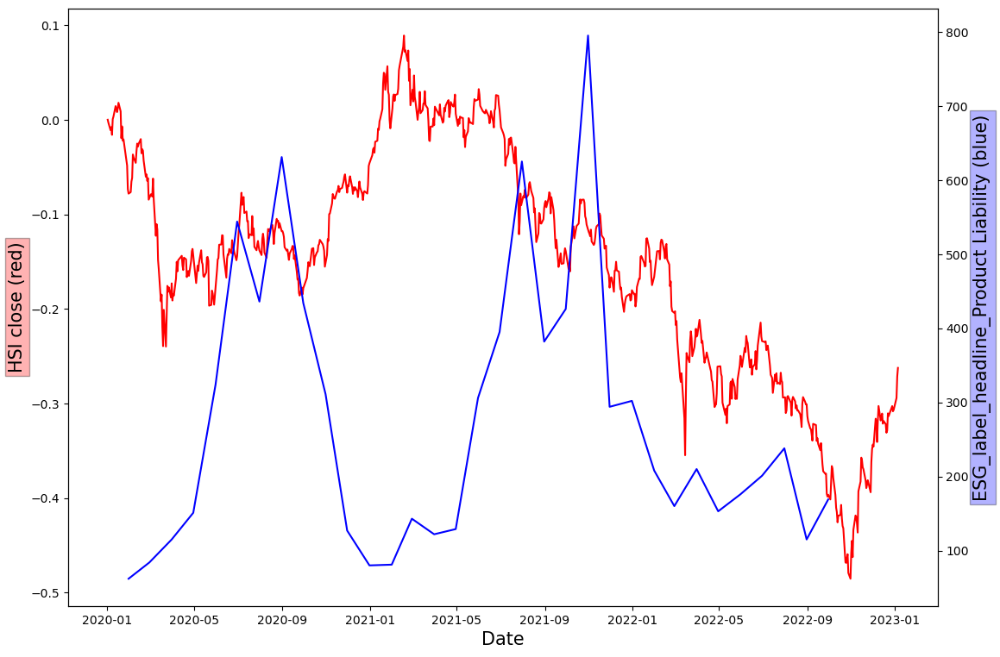

In [238]:
data_to_plot=data_group_month["ESG_label_headline_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(600,-100) 
plt.ylabel('ESG_label_headline_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

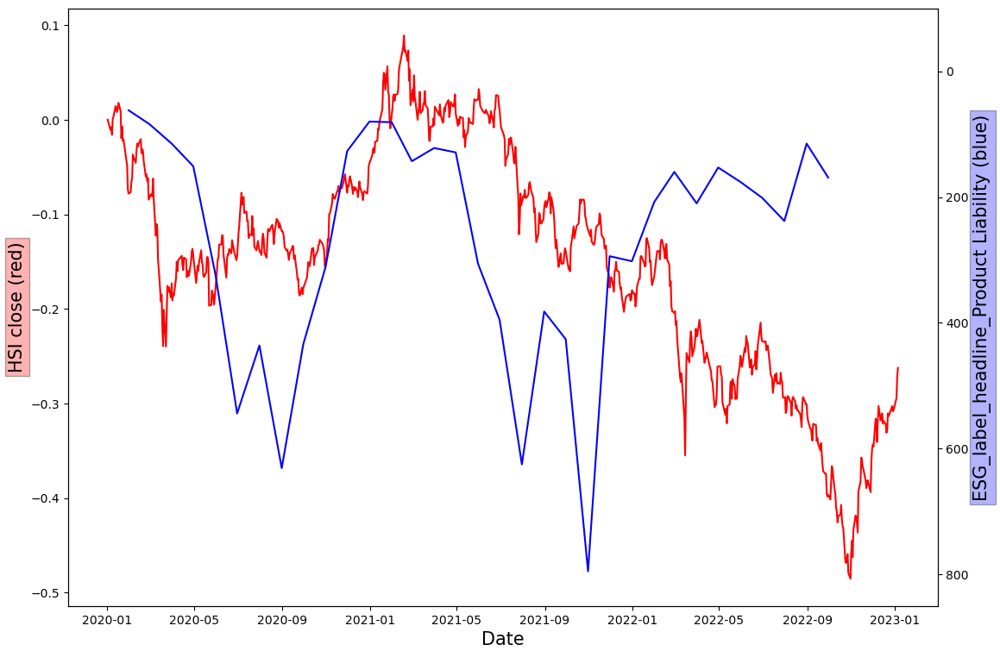

In [239]:
data_to_plot=data_group_month["ESG_label_headline_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(850,-100) 
plt.ylabel('ESG_label_headline_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

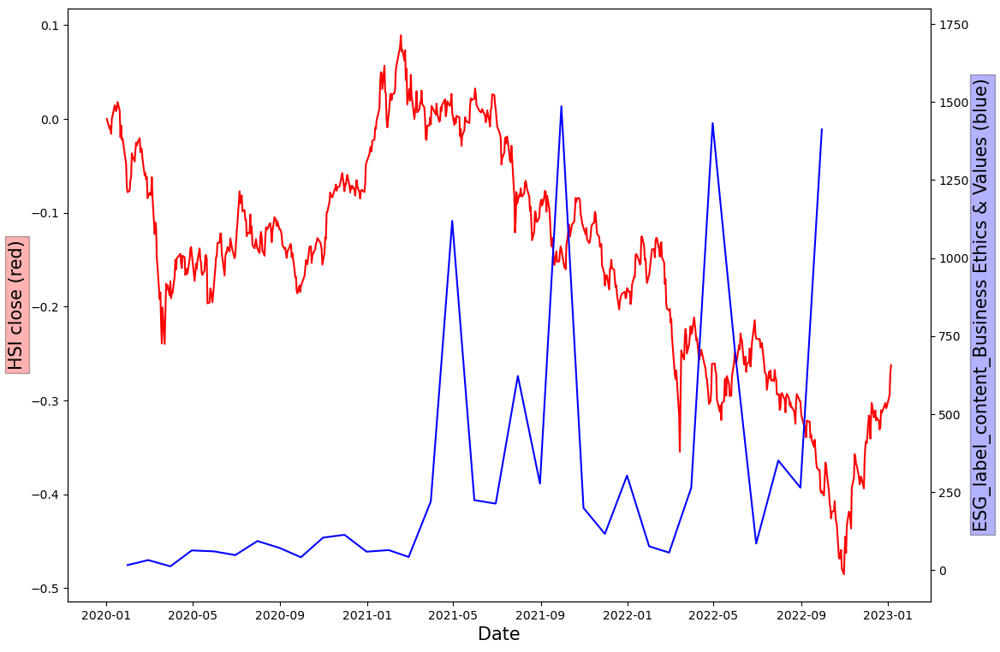

In [241]:
data_to_plot=data_group_month["ESG_label_content_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(-100,1800) 
plt.ylabel('ESG_label_content_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

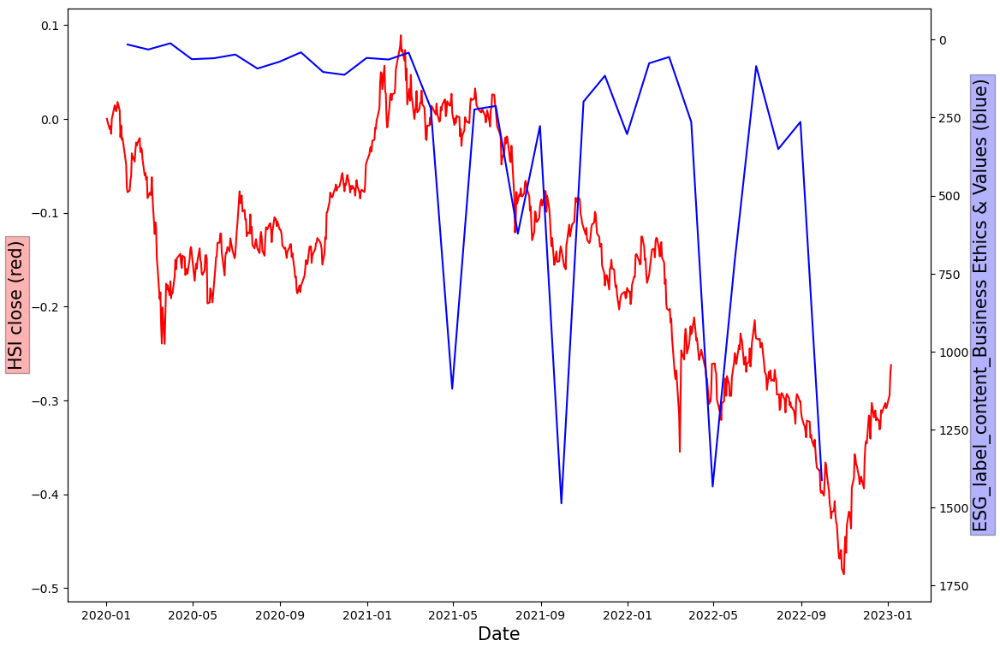

In [242]:
data_to_plot=data_group_month["ESG_label_content_Business Ethics & Values"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1800,-100) 
plt.ylabel('ESG_label_content_Business Ethics & Values (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

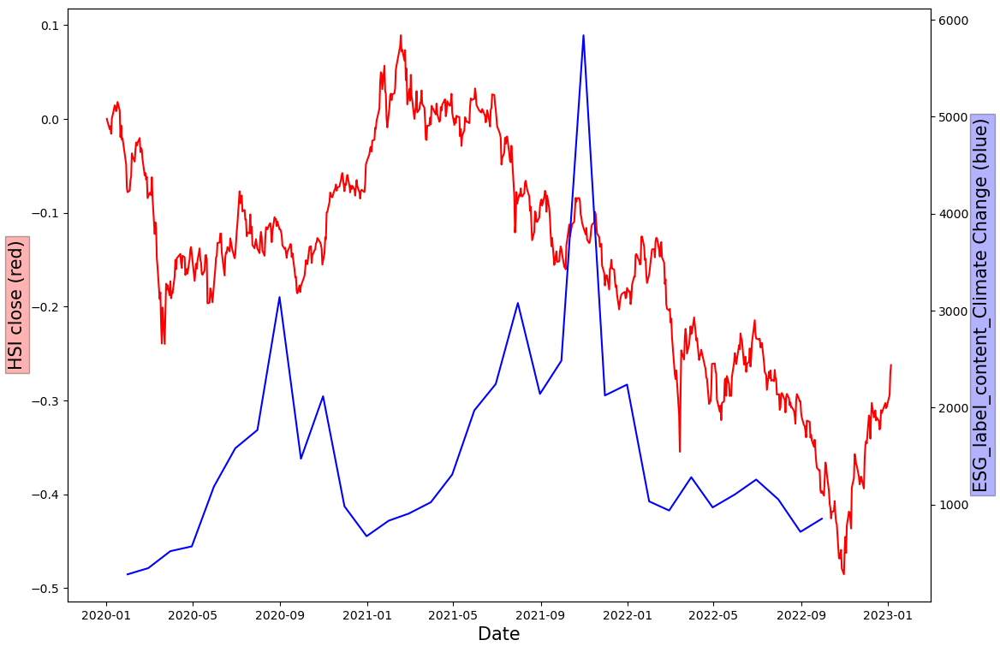

In [243]:
data_to_plot=data_group_month["ESG_label_content_Climate Change"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1800,-100) 
plt.ylabel('ESG_label_content_Climate Change (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

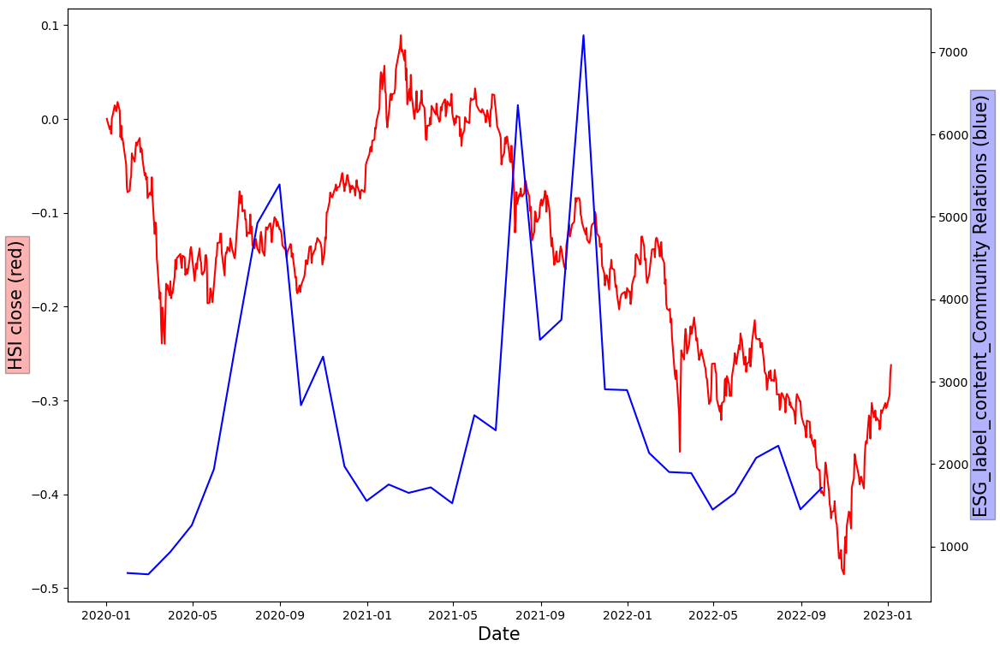

In [244]:
data_to_plot=data_group_month["ESG_label_content_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1800,-100) 
plt.ylabel('ESG_label_content_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

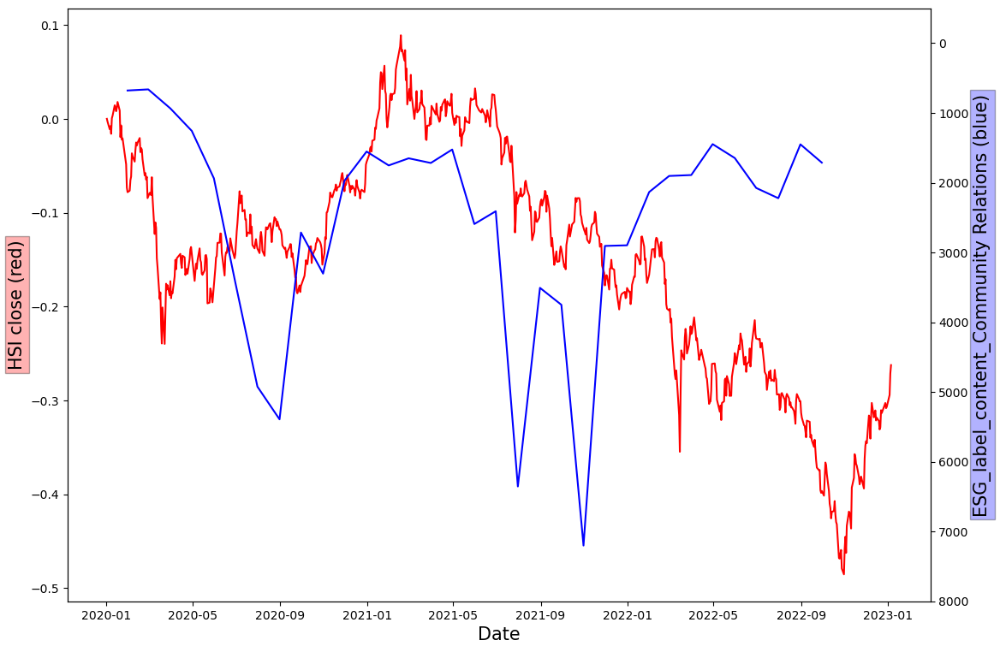

In [245]:
data_to_plot=data_group_month["ESG_label_content_Community Relations"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(8000,-500) 
plt.ylabel('ESG_label_content_Community Relations (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

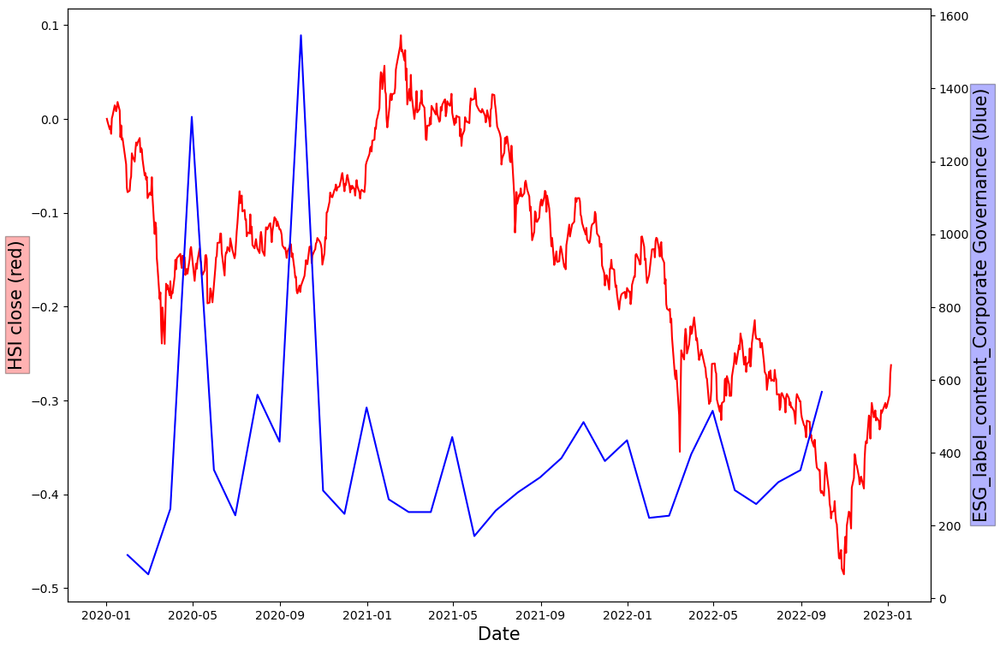

In [246]:
data_to_plot=data_group_month["ESG_label_content_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(8000,-500) 
plt.ylabel('ESG_label_content_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

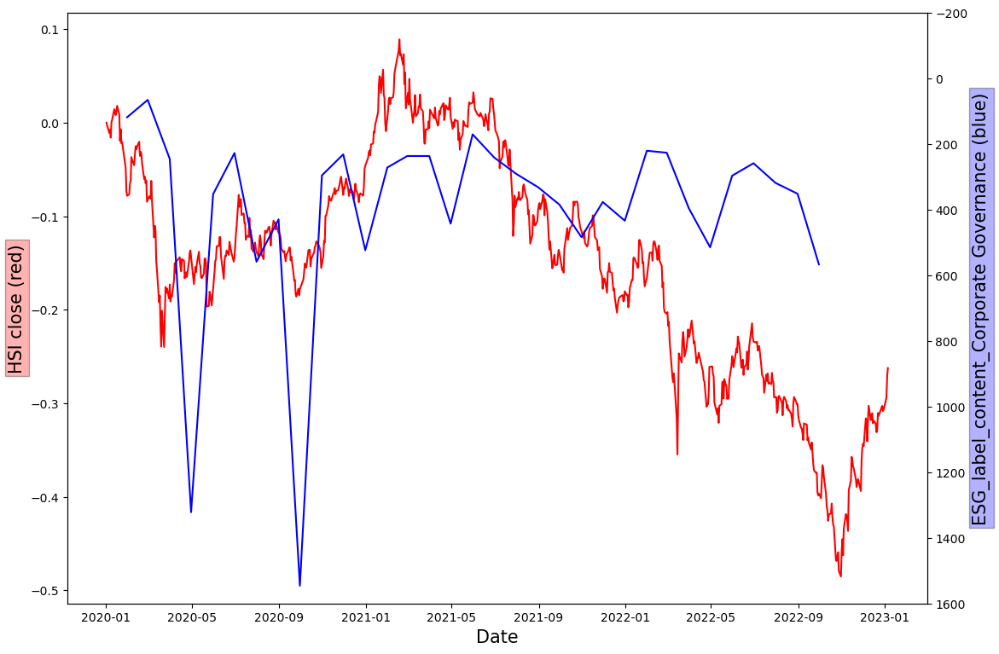

In [247]:
data_to_plot=data_group_month["ESG_label_content_Corporate Governance"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Corporate Governance (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

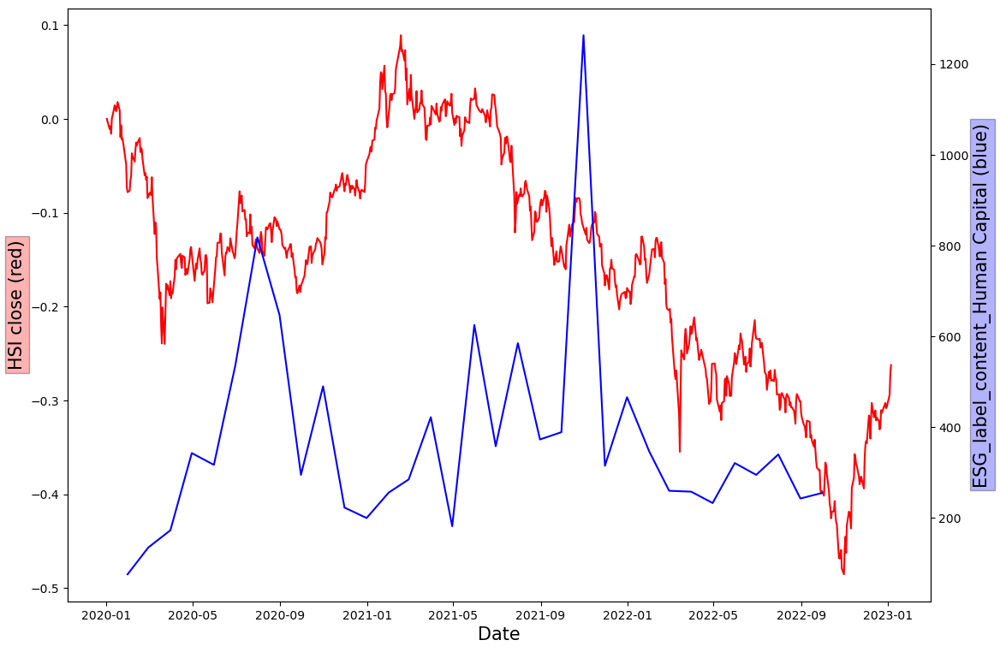

In [248]:
data_to_plot=data_group_month["ESG_label_content_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

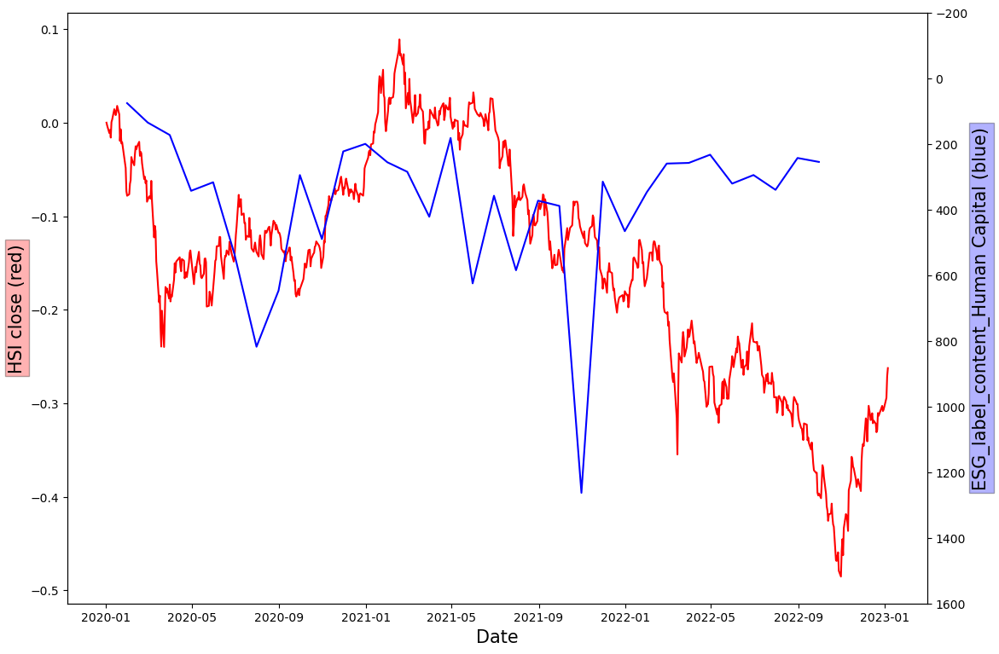

In [249]:
data_to_plot=data_group_month["ESG_label_content_Human Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Human Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

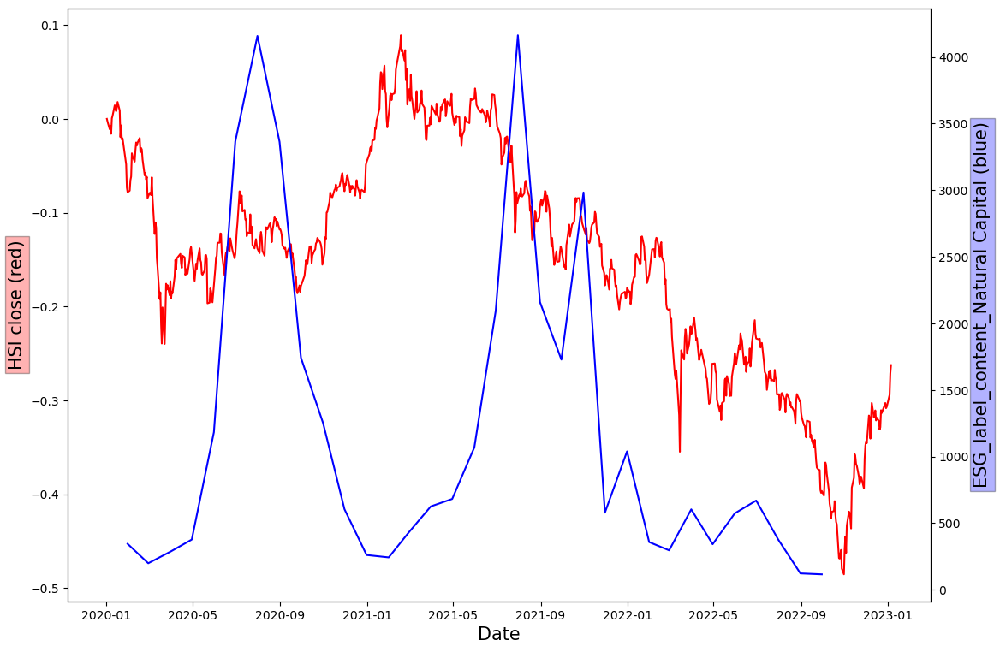

In [250]:
data_to_plot=data_group_month["ESG_label_content_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

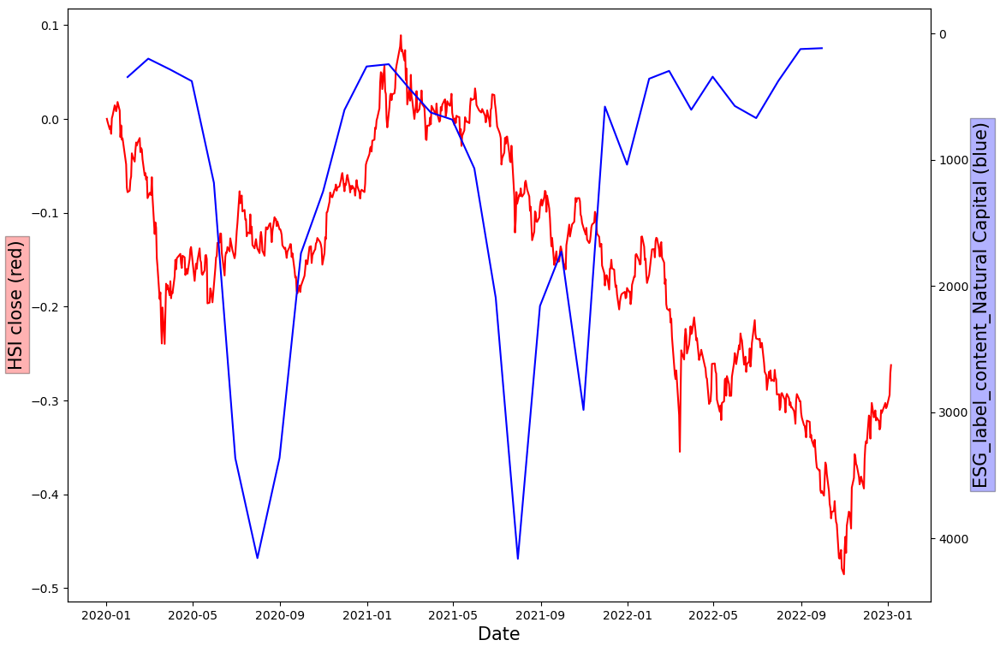

In [251]:
data_to_plot=data_group_month["ESG_label_content_Natural Capital"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(4500,-200) 
plt.ylabel('ESG_label_content_Natural Capital (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

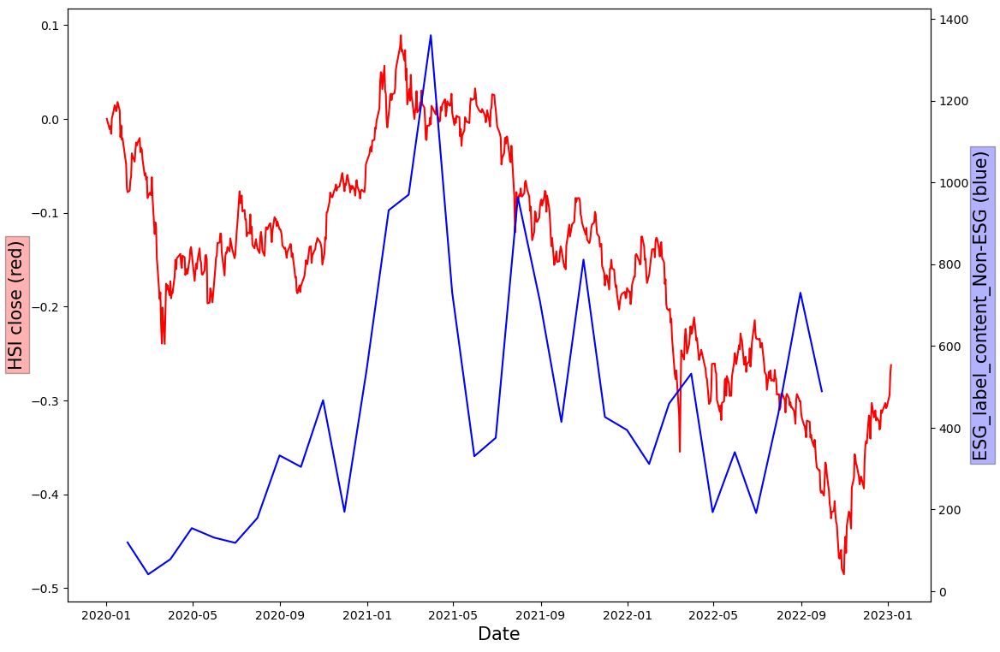

In [252]:
data_to_plot=data_group_month["ESG_label_content_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

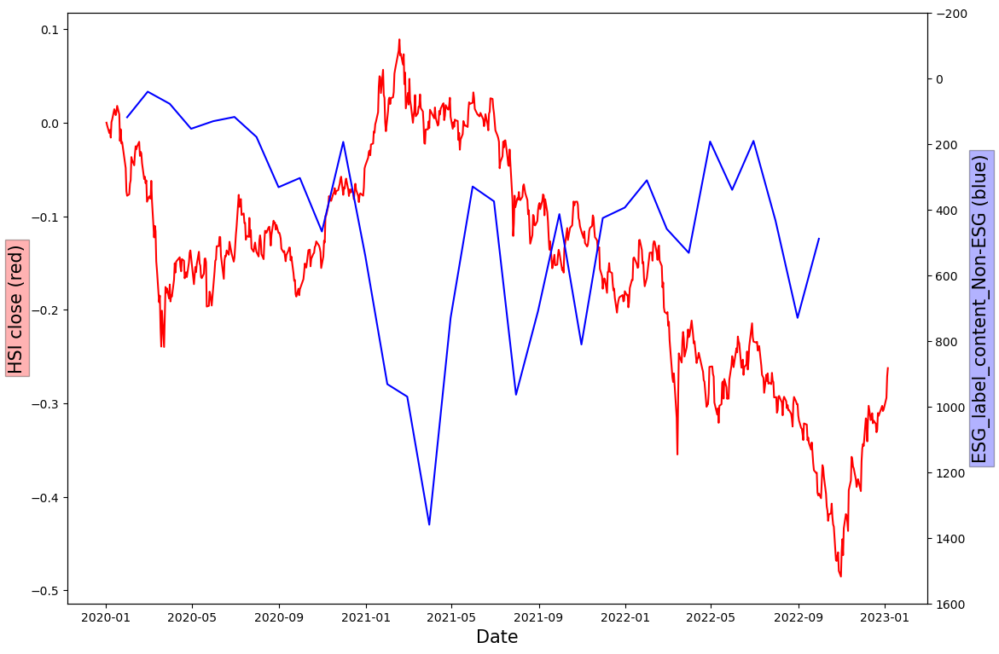

In [253]:
data_to_plot=data_group_month["ESG_label_content_Non-ESG"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Non-ESG (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

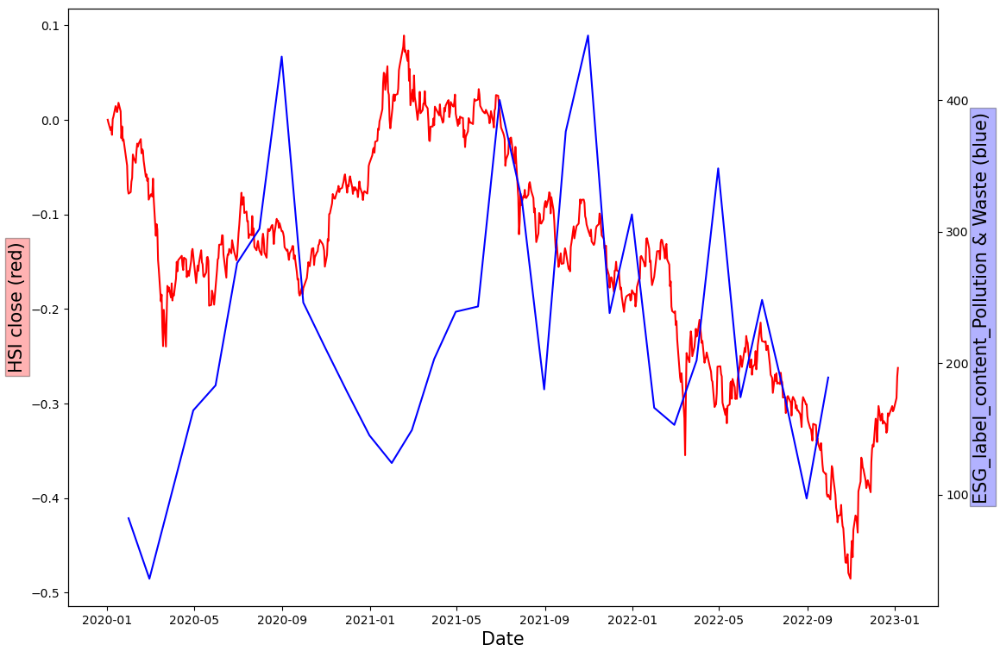

In [254]:
data_to_plot=data_group_month["ESG_label_content_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(1600,-200) 
plt.ylabel('ESG_label_content_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

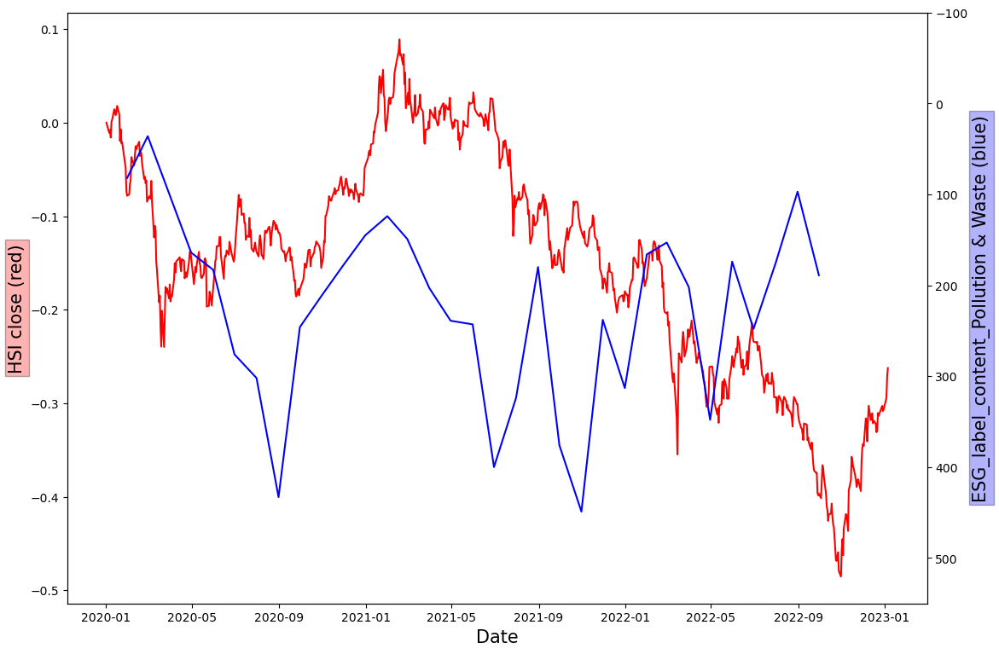

In [255]:
data_to_plot=data_group_month["ESG_label_content_Pollution & Waste"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(550,-100) 
plt.ylabel('ESG_label_content_Pollution & Waste (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

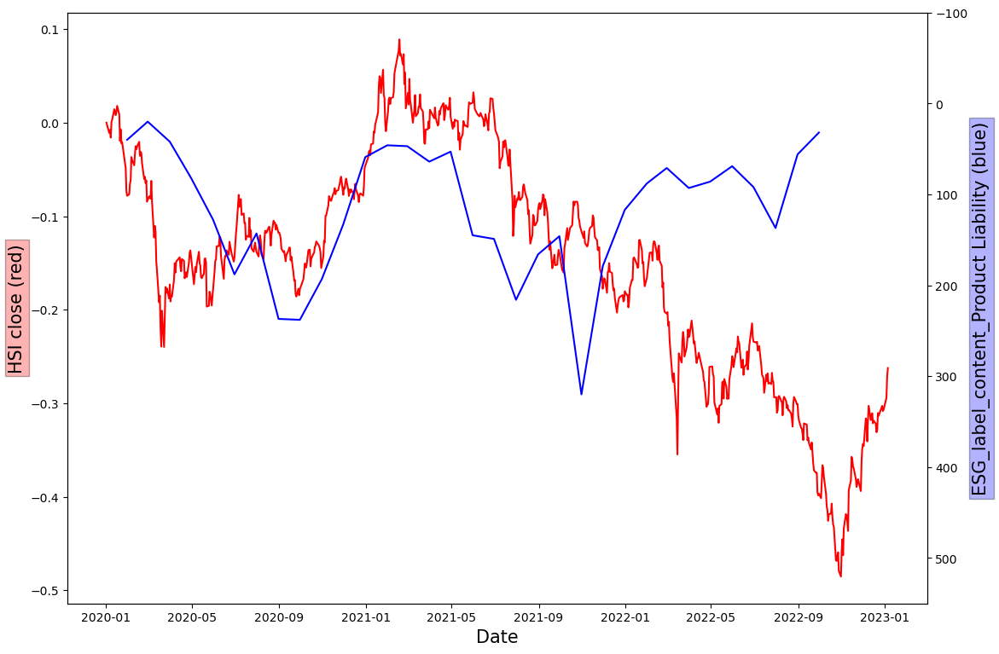

In [256]:
data_to_plot=data_group_month["ESG_label_content_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(550,-100) 
plt.ylabel('ESG_label_content_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

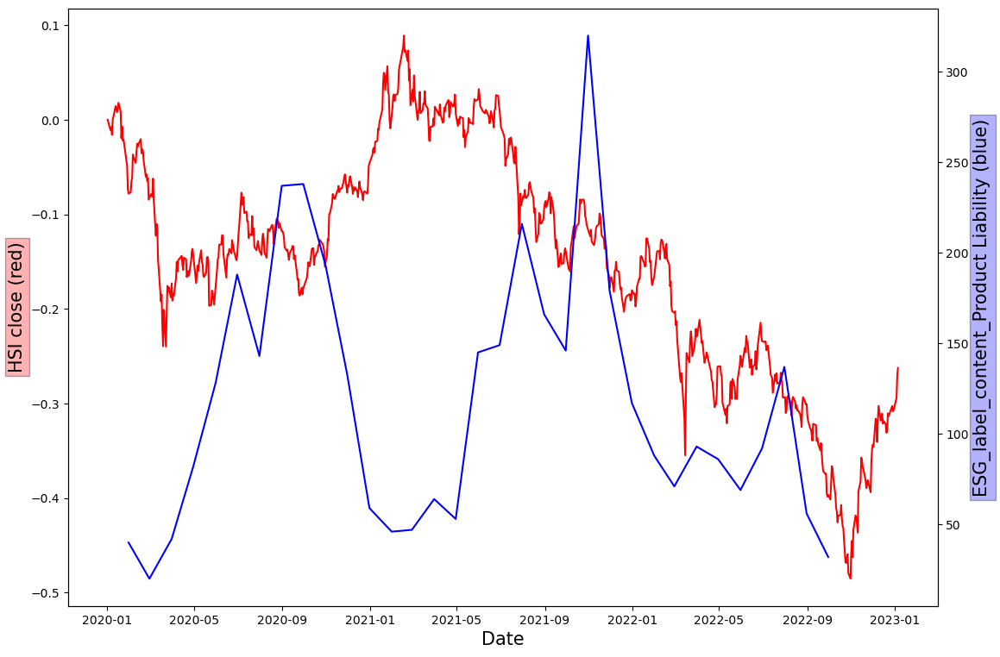

In [257]:
data_to_plot=data_group_month["ESG_label_content_Product Liability"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(550,-100) 
plt.ylabel('ESG_label_content_Product Liability (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

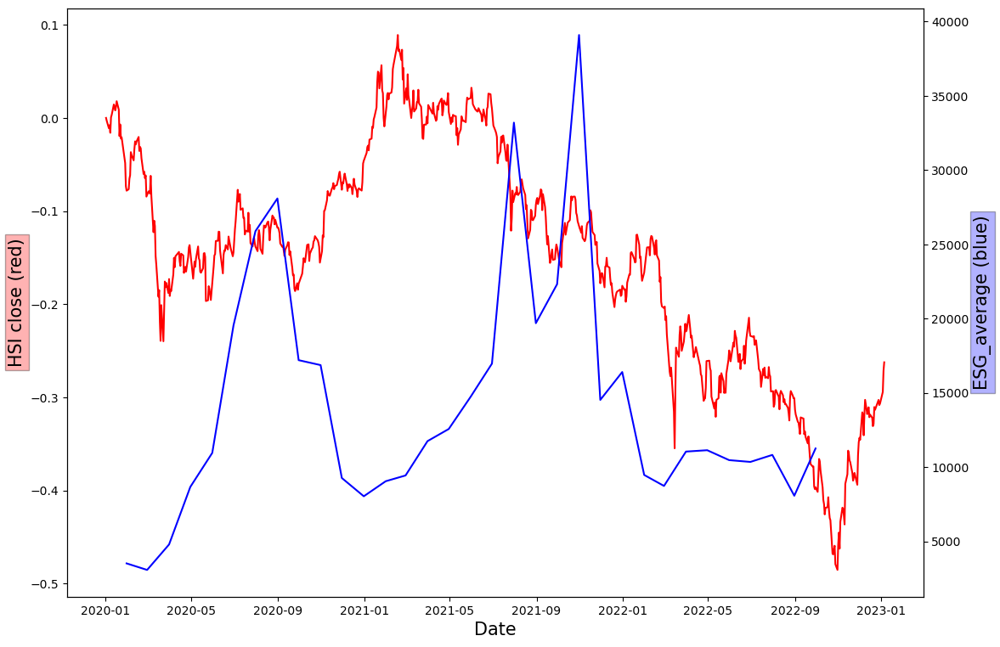

In [258]:
data_to_plot=data_group_month["ESG_average"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
# ax2.set_ylim(550,-100) 
plt.ylabel('ESG_average (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

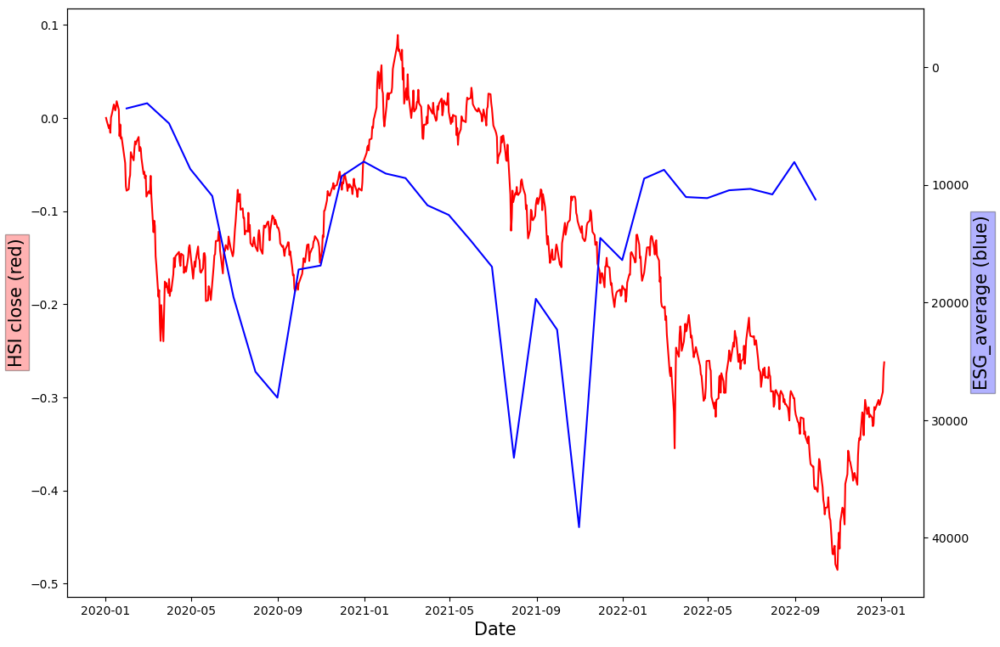

In [259]:
data_to_plot=data_group_month["ESG_average"]
fig, ax1 = plt.subplots(figsize=(13,9)) 
ax1.set_xlabel('Date',fontsize=15) 
ax1.set_ylabel('HSI close (red)',fontsize=15 ,bbox=dict(facecolor="red",pad=3,alpha=0.3)) 
ax1.plot(hsi_month_accu["Close"], color = 'red') 
# ax1.set_ylim(-0.5,0.3)
ax2 = ax1.twinx() 
ax2.plot(data_to_plot, color = 'b')
ax2.set_ylim(45000,-5000) 
plt.ylabel('ESG_average (blue)',fontsize=15 ,bbox=dict(facecolor="blue",pad=3,alpha=0.3))
plt.show()

In [260]:
data_group_month

,non_view_engagements,comment_count,like_count,dislike_count,love_count,haha_count,wow_count,angry_count,sad_count,share_count,...,ESG_label_content_Community Relations,ESG_label_content_Corporate Governance,ESG_label_content_Human Capital,ESG_label_content_Natural Capital,ESG_label_content_Non-ESG,ESG_label_content_Pollution & Waste,ESG_label_content_Product Liability,ESG_average,hsi_accu_return,monthly_return
pubdate,,,,,,,,,,,,,,,,,,,,,
2020-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,678.0,119.0,76.0,345.0,119.0,82.0,40.0,3512.0,0.000000,0.000000
2020-02-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,662.0,66.0,135.0,199.0,41.0,36.0,20.0,3072.0,-0.006943,-0.006943
2020-03-31,77617,5343.0,66490.0,403.0,1089.0,1104.0,698.0,358.0,468.0,1664.0,...,935.0,246.0,173.0,286.0,78.0,101.0,42.0,4786.0,-0.102960,-0.096688
2020-04-30,302574,16880.0,260519.0,1658.0,1372.0,1488.0,3427.0,4391.0,3059.0,9759.0,...,1257.0,1322.0,343.0,377.0,154.0,164.0,82.0,8662.0,-0.063431,0.044066
2020-05-31,431454,27328.0,356436.0,1666.0,5032.0,5711.0,10600.0,2452.0,5401.0,15682.0,...,1937.0,353.0,317.0,1183.0,131.0,183.0,128.0,10954.0,-0.127359,-0.068258
2020-06-30,704458,48525.0,476359.0,2053.0,10146.0,52566.0,25430.0,29415.0,14478.0,42664.0,...,3429.0,228.0,536.0,3366.0,118.0,276.0,188.0,19540.0,-0.071655,0.063834
2020-07-31,686330,48525.0,426365.0,1773.0,9738.0,35972.0,21400.0,13327.0,81250.0,41344.0,...,4923.0,559.0,818.0,4158.0,179.0,302.0,143.0,25888.0,-0.065265,0.006884
2020-08-31,785860,56417.0,535467.0,1199.0,29514.0,40866.0,21853.0,32184.0,21141.0,45865.0,...,5392.0,430.0,647.0,3363.0,332.0,433.0,237.0,28088.0,-0.043157,0.023651
2020-09-30,465961,28229.0,385099.0,782.0,5624.0,12786.0,9771.0,2072.0,9045.0,11908.0,...,2714.0,1546.0,295.0,1742.0,304.0,246.0,238.0,17198.0,-0.108449,-0.068237


In [261]:
hsi_month_accu

,Close,Volume
Date,,
2020-01-02,0.000000,0.000000
2020-01-03,-0.003224,0.423820
2020-01-06,-0.011117,0.420274
2020-01-07,-0.007759,0.031641
2020-01-08,-0.015962,0.353605
...,...,...
2022-12-29,-0.308384,1.298477
2022-12-30,-0.306974,0.384067
2023-01-03,-0.294225,0.810875


In [262]:
data_group_month.to_csv("monthly_data_use_with_daily_hsi.csv")